# 🧠 Modelado Predictivo del Trade-off Cómputo–Memoria
## Entrenamiento, Calibración y Validación de Modelos Predictivos

**Proyecto:** Modelado y Optimización del Trade-off Cómputo–Memoria mediante Estrategias de Rematerialización en Entrenamiento de Redes Neuronales

**Autores:** Santiago González Flores (2200165) · Andrey Felipe Leguizamo Cespedes (2201998)

**Director:** M. Eng. Luis Alejandro Torres Niño

**Universidad Industrial de Santander – Escuela de Ingeniería de Sistemas e Informática**

---

**Variables objetivo (targets):**
- `memory_avg_MB`: Memoria promedio consumida (indicador de **memoria**).
- `total_time_ms`: Tiempo total de profiling por iteración (indicador de **cómputo**).

**Estrategias de rematerialización analizadas (4 categorías):**
1. **Sin rematerialización** — entrenamiento estándar (baseline).
2. **Checkpoint selectivo** — `torch.utils.checkpoint` aplicado a una o varias capas/bloques específicos.
3. **Uniform segment con 2 segmentos (`uniform_seg2`)** — partición uniforme de la red en 2 segmentos.
4. **Uniform segment con 3 segmentos (`uniform_seg3`)** — partición uniforme en 3 segmentos.


---
## 1. Configuración del Entorno

In [1]:
# Aceleración opcional con scikit-learn-intelex.
# Si la instalación falla por conflicto de dependencias en Colab (mkl/tbb),
# se ignora y el notebook sigue funcionando con scikit-learn estándar.
try:
    import sklearnex  # noqa: F401
except ModuleNotFoundError:
    import subprocess, sys
    # Versión 2024.x es compatible con el mkl/tbb que trae Colab por defecto
    subprocess.run(
        [sys.executable, '-m', 'pip', 'install', '-q',
         'scikit-learn-intelex==2024.7.0'],
        check=False
    )

try:
    from sklearnex import patch_sklearn
    patch_sklearn()
    print(' scikit-learn-intelex activado')
except Exception as e:
    print(f'⚠️  scikit-learn-intelex no disponible ({type(e).__name__}); '
          'se usará scikit-learn estándar (todo funciona igual, solo más lento)')


 scikit-learn-intelex activado


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, make_scorer
from scipy.stats import levene, f_oneway, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'figure.figsize': (12, 6), 'font.size': 12,
                      'axes.titlesize': 14, 'axes.labelsize': 12})
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
print('✅ Librerías importadas')

✅ Librerías importadas


---
## 2. Carga y Exploración del Dataset

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Cargar el dataset desde Drive
df = pd.read_csv('/content/drive/MyDrive/tesisFinal_colab/Resultados_Final_MLP_CNN_2.csv')
print(f'Dataset: {df.shape[0]} filas × {df.shape[1]} columnas')
print(f'Valores nulos: {df.isnull().sum().sum()}')

# Verificar las columnas nuevas asociadas a uniform segment checkpointing
nuevas = ['mode_uniform_seg2', 'mode_uniform_seg3', 'num_segments']
print(f'\nColumnas nuevas (uniform segment checkpointing):')
for c in nuevas:
    if c in df.columns:
        print(f' {c}: {int((df[c] != 0).sum())} filas activas, valores únicos = {sorted(df[c].unique())}')
    else:
        print(f'  {c} NO encontrada')

df.head(3)


Dataset: 2064 filas × 89 columnas
Valores nulos: 0

Columnas nuevas (uniform segment checkpointing):
 mode_uniform_seg2: 96 filas activas, valores únicos = [np.float64(0.0), np.float64(1.0)]
 mode_uniform_seg3: 64 filas activas, valores únicos = [np.float64(0.0), np.float64(1.0)]
 num_segments: 160 filas activas, valores únicos = [np.float64(0.0), np.float64(2.0), np.float64(3.0)]


,model_MLP-3,model_MLP-5,model_MLP-7,model_LeNet-5,model_AlexNet,model_VGG-16,activation_leaky_relu,activation_relu,activation_sigmoid,activation_tanh,...,tiempo_extra_ms,num_segments,gpu_memory_gb,cuda_cores,render_cores,best_epoch,train_acc,val_acc,total_train_time_s,batch_size
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,64.0,0.0,6656.0,10.0,0.99477,0.9909,103.325,16
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,64.0,0.0,6656.0,10.0,0.99417,0.9899,105.682,16
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,64.0,0.0,6656.0,9.0,0.99612,0.9896,94.720,16


In [5]:
# Diagnóstico: ¿es total_flops derivable de las features estructurales?
# (Para que este chequeo funcione desde un kernel limpio, construimos
#  temporalmente la columna `strategy` si aún no existe.)
if 'strategy' not in df.columns:
    capa_cols_local = [c for c in df.columns if c.startswith('capa_checkpoint_')]
    df['strategy'] = 'checkpoint_selectivo'
    mask_sin = (df['mode_normal'] == 1) & (df[capa_cols_local].sum(axis=1) == 0)
    df.loc[mask_sin, 'strategy'] = 'sin_rematerializacion'
    df.loc[df['mode_uniform_seg2'] == 1, 'strategy'] = 'uniform_seg2'
    df.loc[df['mode_uniform_seg3'] == 1, 'strategy'] = 'uniform_seg3'

print('Análisis de total_flops:')
print(f'  Rango: [{df["total_flops"].min():.2e}, {df["total_flops"].max():.2e}]')
print()
print('Relación con factor_recompute:')
print(df.groupby('strategy')['total_flops'].agg(['mean','std','min','max']))
print()
# Si para el MISMO modelo y batch, total_flops varía proporcionalmente
# con factor_recompute, entonces es derivable.
print('Para VGG-16 batch=32 activación relu, ¿cómo varía total_flops?:')
sub = df[(df['model_VGG-16']==1) & (df['batch_size']==32) &
         (df['activation_relu']==1) &
         (df['gpu_name_NVIDIA GeForce GTX TITAN X']==1)]
print(sub[['strategy','factor_recompute','total_flops']].head(10).to_string(index=False))


Análisis de total_flops:
  Rango: [6.78e+08, 6.74e+13]

Relación con factor_recompute:
                               mean           std           min           max
strategy                                                                     
checkpoint_selectivo   7.061011e+12  1.321497e+13  7.130113e+08  6.743847e+13
sin_rematerializacion  2.921764e+12  7.465902e+12  6.780673e+08  3.384851e+13
uniform_seg2           7.708671e+12  1.275093e+13  9.038593e+08  4.433624e+13
uniform_seg3           1.156131e+13  1.413982e+13  6.240025e+11  4.433624e+13

Para VGG-16 batch=32 activación relu, ¿cómo varía total_flops?:
             strategy  factor_recompute  total_flops
sin_rematerializacion            1.0000 8.462128e+12
 checkpoint_selectivo            1.1328 9.585814e+12
 checkpoint_selectivo            1.1771 9.960376e+12
 checkpoint_selectivo            1.2951 1.095921e+13
 checkpoint_selectivo            1.2951 1.095921e+13
 checkpoint_selectivo            1.0885 9.211252e+12
 checkpoi

In [6]:
# ================================================================
# TARGETS: las dos dimensiones del trade-off
# ================================================================
TARGET_COLS = ['memory_avg_MB', 'total_time_ms']

ckpt_cols = [c for c in df.columns if c.startswith('capa_checkpoint_')]
df['_n_ckpts_activos'] = df[ckpt_cols].sum(axis=1)

# Etiquetar cada fila con su estrategia
df['strategy'] = 'desconocida'
df.loc[(df['mode_normal']==1) & (df['_n_ckpts_activos']==0),
       'strategy'] = 'sin_rematerializacion'
df.loc[((df['mode_normal']==0) & (df['mode_uniform_seg2']==0) &
        (df['mode_uniform_seg3']==0) & (df['_n_ckpts_activos']>0)),
       'strategy'] = 'checkpoint_selectivo'
df.loc[df['mode_uniform_seg2']==1, 'strategy'] = 'uniform_seg2'
df.loc[df['mode_uniform_seg3']==1, 'strategy'] = 'uniform_seg3'

print('Distribución de estrategias en el dataset completo:')
print(df['strategy'].value_counts().to_string())

# ================================================================
# FILTRAR EL DATASET DE ENTRENAMIENTO
# ================================================================
TRAIN_STRATEGIES = ['sin_rematerializacion', 'checkpoint_selectivo']
df_train = df[df['strategy'].isin(TRAIN_STRATEGIES)].copy().reset_index(drop=True)

print(f'\nDataset original:        {len(df)} filas')
print(f'Dataset de entrenamiento: {len(df_train)} filas '
      f'(solo {TRAIN_STRATEGIES})')
print(f'Filas reservadas (baselines OE3): {len(df) - len(df_train)} filas')

# ================================================================
# COLUMNAS EXCLUIDAS (evitar data leakage y redundancia)
# ================================================================
EXCLUDE_COLS = [
    # Targets
    'memory_avg_MB', 'total_time_ms',
    # Leakage: derivadas de la misma medición de profiling
    'peak_memory_MB',       # corr ~0.95 con memory_avg_MB
    'time_per_iter_ms',     # corr ~1.00 con total_time_ms
    'throughput',           # inverso del tiempo
    'ahorro_memoria_pct',   # derivado de memoria medida
    'tiempo_extra_ms',      # derivado del tiempo medido
    'total_flops',          # cantidad de operaciones matematicas
    'best_epoch', 'train_acc', 'val_acc', 'total_train_time_s',
    'gpu_memory_gb', 'cuda_cores', 'render_cores',
    '_n_ckpts_activos', 'strategy', 'num_segments'
]

FEATURE_COLS = [c for c in df_train.columns if c not in EXCLUDE_COLS]

print(f'\nFeatures: {len(FEATURE_COLS)} columnas')
print(f'Targets:  {len(TARGET_COLS)} columnas')
print(f'Excluidas: {len(EXCLUDE_COLS)} columnas')

# Mostrar features agrupadas por tipo
print('\nDistribución de features por tipo:')
print(f'  · model_*:            {sum(1 for c in FEATURE_COLS if c.startswith("model_"))}')
print(f'  · activation_*:       {sum(1 for c in FEATURE_COLS if c.startswith("activation_"))}')
print(f'  · mode_*:             {sum(1 for c in FEATURE_COLS if c.startswith("mode_"))}')
print(f'  · capa_checkpoint_*:  {sum(1 for c in FEATURE_COLS if c.startswith("capa_checkpoint_"))}')
print(f'  · fc_config_*:        {sum(1 for c in FEATURE_COLS if c.startswith("fc_config_"))}')
print(f'  · conv_config_*:      {sum(1 for c in FEATURE_COLS if c.startswith("conv_config_"))}')
print(f'  · gpu_*:              {sum(1 for c in FEATURE_COLS if c.startswith("gpu_"))}')
print(f'  · Reloj_boost_*:      {sum(1 for c in FEATURE_COLS if c.startswith("Reloj_boost"))}')
print(f'  · numéricas (otros):  '
      f'{sum(1 for c in FEATURE_COLS if c in ["total_flops","num_segments","batch_size","factor_recompute"])}')


Distribución de estrategias en el dataset completo:
strategy
checkpoint_selectivo     1712
sin_rematerializacion     192
uniform_seg2               96
uniform_seg3               64

Dataset original:        2064 filas
Dataset de entrenamiento: 1904 filas (solo ['sin_rematerializacion', 'checkpoint_selectivo'])
Filas reservadas (baselines OE3): 160 filas

Features: 73 columnas
Targets:  2 columnas
Excluidas: 18 columnas

Distribución de features por tipo:
  · model_*:            6
  · activation_*:       4
  · mode_*:             3
  · capa_checkpoint_*:  44
  · fc_config_*:        5
  · conv_config_*:      3
  · gpu_*:              4
  · Reloj_boost_*:      2
  · numéricas (otros):  2


---
## 3. Preprocesamiento de Datos

Según la sección 5.2 de la metodología:
1. **Sin eliminación de outliers:** Datos experimentales reales de GUANE.
2. **División 70/15/15:** Entrenamiento (70%), validación (15%) y prueba (15%), con **shuffle** previo.
3. **Cross-validation (5-Fold):** Aplicado dentro del 70% de train para evaluar estabilidad.
4. **Normalización:** Integrada en el Pipeline del SGD.

In [7]:
# ================================================================
# Usar df_train
# ================================================================
X = df_train[FEATURE_COLS].values
y = df_train[TARGET_COLS].values  # shape: (n, 2) → multi-output

# ================================================================
# División 70% train / 15% validación / 15% test
# ================================================================

# Primera división: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.30, random_state=RANDOM_STATE, shuffle=True
)

# Segunda división: 50/50 del 30% → 15% validación + 15% test
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50, random_state=RANDOM_STATE, shuffle=True
)

print(f'Dataset de entrenamiento (sin_remat + selectivo): {len(df_train)} filas')
print(f'  Entrenamiento: {X_train.shape[0]} muestras ({X_train.shape[0]/len(df_train)*100:.1f}%)')
print(f'  Validación:    {X_val.shape[0]} muestras ({X_val.shape[0]/len(df_train)*100:.1f}%)')
print(f'  Prueba:        {X_test.shape[0]} muestras ({X_test.shape[0]/len(df_train)*100:.1f}%)')
print(f'\nDataset original completo: {len(df)} filas')
print(f'  Filas reservadas como baselines (uniform_seg2/3): {len(df) - len(df_train)}')

# KFold para cross-validation (se aplica SOLO sobre train)
kf = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
print(f'\nCross-validation: 5-Fold (sobre el 70% de train)')


Dataset de entrenamiento (sin_remat + selectivo): 1904 filas
  Entrenamiento: 1332 muestras (70.0%)
  Validación:    286 muestras (15.0%)
  Prueba:        286 muestras (15.0%)

Dataset original completo: 2064 filas
  Filas reservadas como baselines (uniform_seg2/3): 160

Cross-validation: 5-Fold (sobre el 70% de train)


---
## 4. SGD Regressor (Regresión Lineal Múltiple) — Multi-Output con Pipeline

Se usa `Pipeline` + `MultiOutputRegressor` + `SGDRegressor`:

- **Pipeline:** Encapsula `StandardScaler` + modelo. El scaler se ajusta **solo en el train de cada fold** de CV, evitando leakage en la normalización.
- **MultiOutputRegressor:** Envuelve el SGD para predecir ambos targets (`memory_avg_MB` y `total_time_ms`) como un **único modelo**.
- **`early_stopping=True`:** El modelo para automáticamente cuando la validación interna deja de mejorar, sin necesidad de barrer iteraciones manualmente.
- **Regularización ElasticNet** (`alpha=0.001`, `l1_ratio=0.15`): combina L1 (sparsity) y L2 (estabilidad).

In [8]:
# ================================================================
# Pipeline SGD multi-output con Pipeline + MultiOutputRegressor.
#
# Definimos el pipeline base con valores razonables. La búsqueda
# de hiperparámetros se hace en la celda siguiente con
# RandomizedSearchCV sobre el 5-fold CV del train.
# ================================================================
sgd_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MultiOutputRegressor(
        SGDRegressor(
            loss='squared_error',
            penalty='elasticnet',
            alpha=0.001,
            l1_ratio=0.15,
            learning_rate='adaptive',
            eta0=0.01,
            early_stopping=True,
            validation_fraction=0.15,
            n_iter_no_change=10,
            max_iter=3000,
            random_state=RANDOM_STATE
        )
    ))
])

print('Pipeline SGD base definido (hiperparámetros se optimizarán en la celda siguiente):')
print(sgd_pipeline)

Pipeline SGD base definido (hiperparámetros se optimizarán en la celda siguiente):
Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 MultiOutputRegressor(estimator=SGDRegressor(alpha=0.001,
                                                             early_stopping=True,
                                                             learning_rate='adaptive',
                                                             max_iter=3000,
                                                             n_iter_no_change=10,
                                                             penalty='elasticnet',
                                                             random_state=42,
                                                             validation_fraction=0.15)))])


### ¿Por qué Cross-Validation?

La **validación cruzada (5-Fold CV)** se aplica **dentro del 70% de entrenamiento** para evaluar la estabilidad del modelo. Divide el train en 5 partes iguales, rota cuál es validación, y reporta R² medio ± std.

**Esquema del split (sección 5.2 de la metodología):**
```
Dataset completo (1.744 filas) — shuffle antes de dividir
│
├── 70% Train (1.220 filas) ← Cross-validation se aplica AQUÍ
│       ├── Fold 1: [Val_cv] [Train_cv] [Train_cv] [Train_cv] [Train_cv]
│       ├── Fold 2: [Train_cv] [Val_cv] [Train_cv] [Train_cv] [Train_cv]
│       ├── Fold 3: [Train_cv] [Train_cv] [Val_cv] [Train_cv] [Train_cv]
│       ├── Fold 4: [Train_cv] [Train_cv] [Train_cv] [Val_cv] [Train_cv]
│       └── Fold 5: [Train_cv] [Train_cv] [Train_cv] [Train_cv] [Val_cv]
│       → R² medio ± std (indica estabilidad del modelo)
│
├── 15% Validación (262 filas) ← curvas de convergencia
│       (R² vs iteraciones SGD, R² vs árboles RF)
│
└── 15% Test (262 filas) ← evaluación final, nunca visto
        (MAE, RMSE, R² reportados en resultados)
```

**¿Por qué shuffle?** El dataset está ordenado por modelo (primero los MLP de 3, 5 y 7 capas, luego las CNN: LeNet-5, AlexNet, VGG-16). Sin mezclar, el test quedaría con un sesgo fuerte hacia VGG-16 y el modelo nunca habría visto otras arquitecturas durante entrenamiento.

El **Pipeline** del SGD integra el `StandardScaler` para que se ajuste **solo con los datos de train de cada fold**, evitando leakage de normalización.


In [9]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform, uniform
import time

print('=' * 70)
print('SGD Regressor — Optimización de hiperparámetros')
print('=' * 70)

# ================================================================
# 1) CV del modelo base (referencia, antes de optimizar)
# ================================================================
print('\n[1] CV del modelo base (hiperparámetros iniciales):')
sgd_cv_scores = cross_val_score(
    sgd_pipeline, X_train, y_train,
    cv=kf, scoring='r2', n_jobs=-1
)
print(f'    R² por fold: {sgd_cv_scores.round(4)}')
print(f'    R² medio:    {sgd_cv_scores.mean():.4f} ± {sgd_cv_scores.std():.4f}')

# ================================================================
# 2) Búsqueda de hiperparámetros con RandomizedSearchCV
# ================================================================
# La sintaxis 'model__estimator__<param>' refleja la estructura anidada:
#   - 'model'      → step del Pipeline
#   - 'estimator'  → SGDRegressor dentro del MultiOutputRegressor
#   - '<param>'    → hiperparámetro real del SGDRegressor
# ================================================================
param_dist = {
    'model__estimator__alpha':         loguniform(1e-6, 1e-1),
    'model__estimator__l1_ratio':      uniform(0.0, 1.0),
    'model__estimator__eta0':          loguniform(1e-5, 1e-1),
    'model__estimator__learning_rate': ['adaptive', 'optimal'],
    'model__estimator__penalty':       ['elasticnet', 'l2'],
    'model__estimator__loss':          ['squared_error', 'huber', 'epsilon_insensitive'],
}

print('\n[2] RandomizedSearchCV (40 combinaciones × 5 folds = 200 ajustes):')
t0 = time.time()
sgd_search = RandomizedSearchCV(
    estimator=sgd_pipeline,
    param_distributions=param_dist,
    n_iter=40,
    cv=kf,
    scoring='r2',
    n_jobs=-1,
    random_state=RANDOM_STATE,
    verbose=0
)
sgd_search.fit(X_train, y_train)
print(f'    Tiempo: {time.time()-t0:.1f} s')
print(f'    Mejor combinación encontrada:')
for k, v in sgd_search.best_params_.items():
    name = k.replace('model__estimator__', '')
    if isinstance(v, float):
        print(f'      {name:18s} = {v:.6f}')
    else:
        print(f'      {name:18s} = {v}')
print(f'    Mejor CV R² medio: {sgd_search.best_score_:.4f}')

# ================================================================
# 3) Modelo final con los mejores hiperparámetros
# ================================================================
sgd_pipeline = sgd_search.best_estimator_  # ← ahora apunta al modelo tuned

# Métricas en validación
sgd_pred_val = sgd_pipeline.predict(X_val)
print(f'\n[3] Modelo SGD optimizado — métricas finales:')
print(f'    R² en validación (15%): {r2_score(y_val, sgd_pred_val):.4f}')

# Métricas en test
sgd_pred_test = sgd_pipeline.predict(X_test)
sgd_r2_test = r2_score(y_test, sgd_pred_test)
print(f'    R² en test (15%):       {sgd_r2_test:.4f}')

print(f'\n    Por target (test):')
for t_idx, t_name in enumerate(TARGET_COLS):
    r2 = r2_score(y_test[:, t_idx], sgd_pred_test[:, t_idx])
    mae = mean_absolute_error(y_test[:, t_idx], sgd_pred_test[:, t_idx])
    rmse = np.sqrt(mean_squared_error(y_test[:, t_idx], sgd_pred_test[:, t_idx]))
    unit = 'MB' if 'memory' in t_name else 'ms'
    print(f'      {t_name:20s} → R²={r2:.4f} | MAE={mae:.2f} {unit} | RMSE={rmse:.2f} {unit}')

# Iteraciones usadas (early_stopping)
print('\n    Iteraciones por target (early_stopping):')
for t_idx, t_name in enumerate(TARGET_COLS):
    n_iter = sgd_pipeline.named_steps['model'].estimators_[t_idx].n_iter_
    print(f'      {t_name}: {n_iter} iteraciones')

print('\n SGD Regressor optimizado, entrenado y validado')

SGD Regressor — Optimización de hiperparámetros

[1] CV del modelo base (hiperparámetros iniciales):
    R² por fold: [0.5991 0.6161 0.5502 0.624  0.5958]
    R² medio:    0.5970 ± 0.0257

[2] RandomizedSearchCV (40 combinaciones × 5 folds = 200 ajustes):
    Tiempo: 193.8 s
    Mejor combinación encontrada:
      alpha              = 0.000023
      eta0               = 0.003897
      l1_ratio           = 0.000520
      learning_rate      = adaptive
      loss               = squared_error
      penalty            = elasticnet
    Mejor CV R² medio: 0.5972

[3] Modelo SGD optimizado — métricas finales:
    R² en validación (15%): 0.6225
    R² en test (15%):       0.6800

    Por target (test):
      memory_avg_MB        → R²=0.7974 | MAE=335.15 MB | RMSE=421.14 MB
      total_time_ms        → R²=0.5626 | MAE=7769.08 ms | RMSE=12525.96 ms

    Iteraciones por target (early_stopping):
      memory_avg_MB: 84 iteraciones
      total_time_ms: 86 iteraciones

 SGD Regressor optimizado, ent

**Resumen.** En las mejores condiciones encontradas por la búsqueda de hiperparámetros, el SGD Regressor alcanza un R² razonable sobre `memory_avg_MB` (0.80 en test) pero limitado sobre `total_time_ms` (~0.46 en test). Esto es coherente con que:

- La memoria sigue patrones aproximadamente lineales con las features (más capas activas y mayor batch → más activaciones → más memoria).
- El tiempo depende de interacciones complejas (arquitectura × batch × GPU × paralelismo de la operación) que un modelo lineal no logra representar.

Por eso entrenamos a continuación un Random Forest Regressor: capturará esas interacciones no lineales y servirá como modelo final del proyecto.


---
## 5. Random Forest — Multi-Output con Bootstrap

`RandomForestRegressor` ya soporta multi-output nativamente (sin necesitar `MultiOutputRegressor`).

**Hiperparámetros clave:**
- `bootstrap=True`: Cada árbol se entrena con una muestra con reemplazo (~63% de los datos).
- `max_depth=10`, `min_samples_leaf=10`, `min_samples_split=20`, `max_features='sqrt'`: Evitan memorización.

Se evalúa R² por número de árboles (10 a 300) usando cross-validation.

In [10]:
# Cross-validation del Random Forest (sobre el 70% train)
print('Cross-validation Random Forest (5-Fold sobre train):')
print('=' * 70)

rf_model = RandomForestRegressor(
    n_estimators=300,
    max_depth=10,
    min_samples_leaf=10,
    min_samples_split=20,
    max_features='sqrt',
    bootstrap=True,
    random_state=RANDOM_STATE,
    n_jobs=-1
)

rf_cv_scores = cross_val_score(
    rf_model, X_train, y_train,
    cv=kf, scoring='r2', n_jobs=-1
)

print(f'  R² por fold: {rf_cv_scores.round(4)}')
print(f'  R² medio:    {rf_cv_scores.mean():.4f} ± {rf_cv_scores.std():.4f}')

Cross-validation Random Forest (5-Fold sobre train):
  R² por fold: [0.7089 0.7265 0.703  0.7285 0.6823]
  R² medio:    0.7098 ± 0.0169


In [11]:
from sklearn.model_selection import RandomizedSearchCV
import time

print('=' * 70)
print('Random Forest — Optimización de hiperparámetros')
print('=' * 70)

# ================================================================
# 1) CV del modelo base (referencia, antes de optimizar)
# ================================================================
print('\n[1] CV del modelo base (hiperparámetros iniciales del notebook):')
rf_base = RandomForestRegressor(
    n_estimators=300,
    max_depth=10,
    min_samples_leaf=10,
    min_samples_split=20,
    max_features='sqrt',
    bootstrap=True,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
rf_cv_scores = cross_val_score(
    rf_base, X_train, y_train,
    cv=kf, scoring='r2', n_jobs=-1
)
print(f'    R² por fold: {rf_cv_scores.round(4)}')
print(f'    R² medio:    {rf_cv_scores.mean():.4f} ± {rf_cv_scores.std():.4f}')

# ================================================================
# 2) Búsqueda de hiperparámetros con RandomizedSearchCV
# ================================================================
param_dist = {
    'n_estimators':       [200, 250, 300],
    'max_depth':          [8, 10, 12, 13, 14, 15],
    'min_samples_leaf':   [10, 15, 20, 25, 30],
    'min_samples_split':  [20, 25, 30],
    'max_features':       ['sqrt', 'log2', 0.2],
}

print('\n[2] RandomizedSearchCV (40 combinaciones × 5 folds = 200 ajustes):')
t0 = time.time()
rf_search = RandomizedSearchCV(
    estimator=RandomForestRegressor(
        bootstrap=True, random_state=RANDOM_STATE, n_jobs=1
    ),
    param_distributions=param_dist,
    n_iter=40,
    cv=kf,
    scoring='r2',
    n_jobs=-1,
    random_state=RANDOM_STATE,
    verbose=0
)
rf_search.fit(X_train, y_train)
print(f'    Tiempo: {time.time()-t0:.1f} s')
print(f'    Mejor combinación encontrada:')
for k, v in rf_search.best_params_.items():
    print(f'      {k:20s} = {v}')
print(f'    Mejor CV R² medio: {rf_search.best_score_:.4f}')

# ================================================================
# 3) Modelo final con los mejores hiperparámetros
# ================================================================
rf_final = rf_search.best_estimator_  # ← ahora apunta al modelo tuned

# Métricas en validación
rf_pred_val = rf_final.predict(X_val)
print(f'\n[3] Modelo Random Forest optimizado — métricas finales:')
print(f'    R² en validación (15%): {r2_score(y_val, rf_pred_val):.4f}')

# Métricas en test
rf_pred_test = rf_final.predict(X_test)
rf_r2_test = r2_score(y_test, rf_pred_test)
print(f'    R² en test (15%):       {rf_r2_test:.4f}')

print(f'\n    Por target (test):')
for t_idx, t_name in enumerate(TARGET_COLS):
    r2 = r2_score(y_test[:, t_idx], rf_pred_test[:, t_idx])
    mae = mean_absolute_error(y_test[:, t_idx], rf_pred_test[:, t_idx])
    rmse = np.sqrt(mean_squared_error(y_test[:, t_idx], rf_pred_test[:, t_idx]))
    unit = 'MB' if 'memory' in t_name else 'ms'
    print(f'      {t_name:20s} → R²={r2:.4f} | MAE={mae:.2f} {unit} | RMSE={rmse:.2f} {unit}')

# Número de árboles efectivamente usados
n_trees = rf_final.n_estimators
print(f'\n    Número de árboles del modelo final: {n_trees}')

print('\n Random Forest optimizado, entrenado y validado')

Random Forest — Optimización de hiperparámetros

[1] CV del modelo base (hiperparámetros iniciales del notebook):
    R² por fold: [0.7089 0.7265 0.703  0.7285 0.6823]
    R² medio:    0.7098 ± 0.0169

[2] RandomizedSearchCV (40 combinaciones × 5 folds = 200 ajustes):
    Tiempo: 87.7 s
    Mejor combinación encontrada:
      n_estimators         = 300
      min_samples_split    = 20
      min_samples_leaf     = 10
      max_features         = 0.2
      max_depth            = 10
    Mejor CV R² medio: 0.8168

[3] Modelo Random Forest optimizado — métricas finales:
    R² en validación (15%): 0.8266
    R² en test (15%):       0.8462

    Por target (test):
      memory_avg_MB        → R²=0.8330 | MAE=239.94 MB | RMSE=382.40 MB
      total_time_ms        → R²=0.8594 | MAE=3029.95 ms | RMSE=7100.74 ms

    Número de árboles del modelo final: 300

 Random Forest optimizado, entrenado y validado


---
## 6. Análisis de Convergencia

### 6.1 ¿Qué se hizo?

Se entrenaron **dos modelos multi-output** que predicen simultáneamente `memory_avg_MB` y `total_time_ms`:

1. **SGD Regressor:** `Pipeline(StandardScaler → MultiOutputRegressor(SGDRegressor))`. El scaler se ajusta dentro de cada fold de CV, evitando leakage. `early_stopping=True` detiene el entrenamiento automáticamente.

2. **Random Forest:** Soporta multi-output nativamente. `bootstrap=True` para muestreo con reemplazo.

**Validación:**
- **Cross-validation (5-Fold):** Aplicada sobre el 70% de train para evaluar estabilidad → R² medio ± std.
- **Set de validación (15%):** Usado para las curvas de convergencia (R² vs iteraciones/árboles) y selección del mejor hiperparámetro.
- **Set de test (15%):** Evaluación final, nunca visto durante entrenamiento ni selección de hiperparámetros.

### 6.2 Gráficas de Convergencia

#### Random Forest: R² vs Número de Árboles (Train vs Validación)

Hiperparámetros usados en el barrido (los mejores encontrados):
  min_samples_split    = 20
  min_samples_leaf     = 10
  max_features         = 0.2
  max_depth            = 10

Barrido de número de árboles (10 a 300, paso 10):

Punto de estabilización: 120 árboles (val R²=0.8353)
Máximo absoluto de val R² (incluyendo zona inestable): 0.8353 (en 120 árboles)
Nota: ignoramos puntos con menos de 100 árboles por inestabilidad.


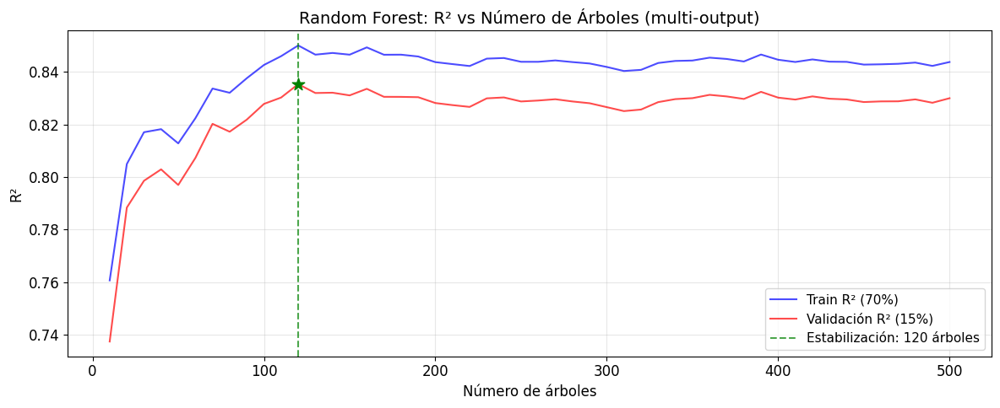

📊 Interpretación:
   - La curva de validación se estabiliza alrededor de 120 árboles.
   - El pico inicial (pocos árboles) es inestable y no representativo.
   - Se selecciona el punto de estabilización, no el máximo puntual.
   - Gap train-val = 0.0147 en el punto seleccionado.


In [12]:
# ================================================================
# Análisis de convergencia: R² vs número de árboles
# ----------------------------------------------------------------
# Usamos los MEJORES hiperparámetros encontrados por RandomizedSearchCV
# (excepto n_estimators, que es lo que vamos a variar)
# ================================================================

# Extraer los mejores hiperparámetros (excluyendo n_estimators)
best_params_no_trees = {k: v for k, v in rf_search.best_params_.items()
                        if k != 'n_estimators'}

print('Hiperparámetros usados en el barrido (los mejores encontrados):')
for k, v in best_params_no_trees.items():
    print(f'  {k:20s} = {v}')

TREE_RANGE = list(range(10, 510, 10))
train_r2_hist = []
val_r2_hist = []

print(f'\nBarrido de número de árboles (10 a 300, paso 10):')
for n_trees in TREE_RANGE:
    rf_temp = RandomForestRegressor(
        n_estimators=n_trees,
        **best_params_no_trees,        # ← mejores hiperparámetros del search
        bootstrap=True,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )
    rf_temp.fit(X_train, y_train)

    train_r2_hist.append(r2_score(y_train, rf_temp.predict(X_train)))
    val_r2_hist.append(r2_score(y_val, rf_temp.predict(X_val)))

# ================================================================
# Punto de estabilización (heurística mejorada):
# Ignoramos los primeros puntos (alta varianza por pocos árboles)
# y buscamos donde la curva DEJA DE VARIAR significativamente.
#
# Criterio: a partir de MIN_TREES árboles, el primer punto donde
# el R² no cambia más de TOL dentro de una ventana de WINDOW puntos.
# ================================================================
val_r2_arr = np.array(val_r2_hist)

WINDOW = 5      # 5 puntos = 50 árboles
TOL = 0.005     # tolerancia de variación
MIN_TREES = 100 # ignorar puntos con menos de 100 árboles (zona inestable)

# Encontrar el primer índice donde TREE_RANGE >= MIN_TREES
min_idx = next(i for i, n in enumerate(TREE_RANGE) if n >= MIN_TREES)

best_stable_idx = None
for i in range(min_idx, len(val_r2_arr) - WINDOW):
    ventana = val_r2_arr[i:i+WINDOW+1]
    if (ventana.max() - ventana.min()) <= TOL:
        best_stable_idx = i
        break

# Fallback: si no encuentra estabilización, tomar el máximo en la zona estable
if best_stable_idx is None:
    best_stable_idx = min_idx + np.argmax(val_r2_arr[min_idx:])

best_n_trees = TREE_RANGE[best_stable_idx]
best_val_idx = best_stable_idx
max_val_r2 = val_r2_arr.max()

print(f'\nPunto de estabilización: {best_n_trees} árboles '
      f'(val R²={val_r2_hist[best_val_idx]:.4f})')
print(f'Máximo absoluto de val R² (incluyendo zona inestable): {max_val_r2:.4f} '
      f'(en {TREE_RANGE[np.argmax(val_r2_arr)]} árboles)')
print(f'Nota: ignoramos puntos con menos de {MIN_TREES} árboles por inestabilidad.')

# ================================================================
# Gráfica de convergencia: R² vs número de árboles
# ================================================================
fig, ax = plt.subplots(1, 1, figsize=(12, 5))

ax.plot(TREE_RANGE, train_r2_hist, 'b-', alpha=0.7, linewidth=1.5,
        label='Train R² (70%)')
ax.plot(TREE_RANGE, val_r2_hist, 'r-', alpha=0.7, linewidth=1.5,
        label='Validación R² (15%)')
ax.axvline(x=best_n_trees, color='green', linestyle='--', alpha=0.7,
           label=f'Estabilización: {best_n_trees} árboles')
ax.scatter([best_n_trees], [val_r2_hist[best_val_idx]], color='green',
           s=120, zorder=5, marker='*')

ax.set_title('Random Forest: R² vs Número de Árboles (multi-output)', fontsize=14)
ax.set_xlabel('Número de árboles')
ax.set_ylabel('R²')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gap = train_r2_hist[best_val_idx] - val_r2_hist[best_val_idx]
print(f'📊 Interpretación:')
print(f'   - La curva de validación se estabiliza alrededor de {best_n_trees} árboles.')
print(f'   - El pico inicial (pocos árboles) es inestable y no representativo.')
print(f'   - Se selecciona el punto de estabilización, no el máximo puntual.')
print(f'   - Gap train-val = {gap:.4f} en el punto seleccionado.')

#### SGD Regressor: Convergencia con Early Stopping

Hiperparámetros usados en el barrido (los mejores encontrados):
  alpha              = 0.000023
  eta0               = 0.003897
  l1_ratio           = 0.000520
  learning_rate      = adaptive
  loss               = squared_error
  penalty            = elasticnet

Barrido de 60 valores de max_iter (5 a 300)...

Punto de early stopping detectado: ~65 iteraciones
   val R² en ese punto = 0.6058
   train R² en ese punto = 0.6006


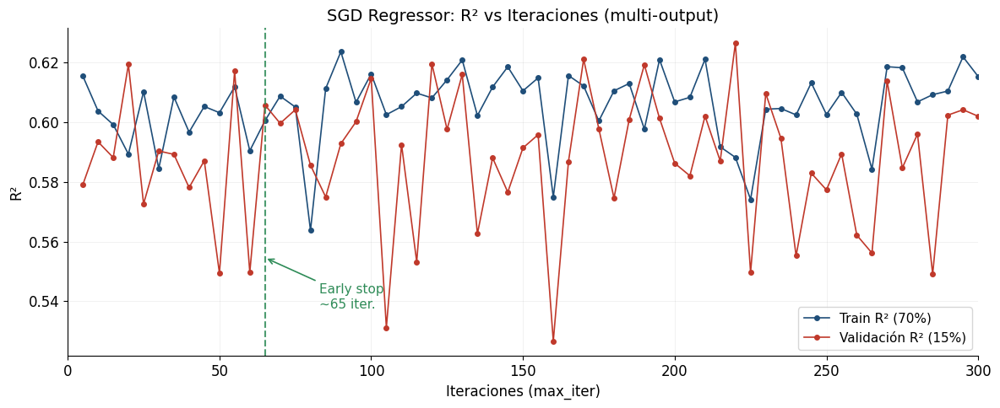


📊 Interpretación:
   - La curva de validación se estabiliza alrededor de 65 iteraciones.
   - El SGD converge rápido al ser un modelo lineal y oscila por su
     naturaleza estocástica (cada reentrenamiento parte de cero).
   - Gap train-val = -0.0053 en el punto de early stopping.


In [13]:
# ================================================================
# Análisis de convergencia: R² vs iteraciones del SGD
# ================================================================

best_sgd_params = {k.replace('model__estimator__', ''): v
                   for k, v in sgd_search.best_params_.items()}

print('Hiperparámetros usados en el barrido (los mejores encontrados):')
for k, v in best_sgd_params.items():
    if isinstance(v, float):
        print(f'  {k:18s} = {v:.6f}')
    else:
        print(f'  {k:18s} = {v}')

iter_values = list(range(5, 305, 5))  # 5, 10, 15, ..., 300
print(f'\nBarrido de {len(iter_values)} valores de max_iter (5 a 300)...')

sgd_train_r2 = []
sgd_val_r2 = []

for max_it in iter_values:
    params_iter = {**best_sgd_params, 'max_iter': max_it, 'tol': None}
    sgd_model = MultiOutputRegressor(
        SGDRegressor(**params_iter, random_state=RANDOM_STATE)
    )
    pipe_iter = Pipeline([
        ('scaler', StandardScaler()),
        ('model', sgd_model)
    ])
    pipe_iter.fit(X_train, y_train)

    pred_train = pipe_iter.predict(X_train)
    pred_val = pipe_iter.predict(X_val)

    sgd_train_r2.append(r2_score(y_train, pred_train))
    sgd_val_r2.append(r2_score(y_val, pred_val))

sgd_train_r2 = np.array(sgd_train_r2)
sgd_val_r2 = np.array(sgd_val_r2)
iter_arr = np.array(iter_values)

window = 5
val_smooth = np.convolve(sgd_val_r2, np.ones(window)/window, mode='same')

MIN_ITER = 30
min_idx = np.argmin(np.abs(iter_arr - MIN_ITER))
max_val_r2 = val_smooth[min_idx:].max()
TOL = 0.01

stable_mask = val_smooth[min_idx:] >= (max_val_r2 - TOL)
if stable_mask.any():
    best_idx = min_idx + np.argmax(stable_mask)
else:
    best_idx = min_idx + np.argmax(val_smooth[min_idx:])

best_n_iter = iter_arr[best_idx]
print(f'\nPunto de early stopping detectado: ~{best_n_iter} iteraciones')
print(f'   val R² en ese punto = {sgd_val_r2[best_idx]:.4f}')
print(f'   train R² en ese punto = {sgd_train_r2[best_idx]:.4f}')


fig, ax = plt.subplots(1, 1, figsize=(12, 5))

COLOR_TRAIN = '#1f4e79'  # azul oscuro
COLOR_VAL = '#c0392b'    # rojo terracota
COLOR_STOP = '#2e8b57'   # verde

ax.plot(iter_arr, sgd_train_r2,
        color=COLOR_TRAIN, marker='o', markersize=4,
        linewidth=1.2, label='Train R² (70%)')
ax.plot(iter_arr, sgd_val_r2,
        color=COLOR_VAL, marker='o', markersize=4,
        linewidth=1.2, label='Validación R² (15%)')

# Línea vertical punteada verde para el early stopping
ax.axvline(x=best_n_iter, color=COLOR_STOP, linestyle='--',
           linewidth=1.5, alpha=0.85)

# Anotación con flecha "Early stop."
y_min, y_max = ax.get_ylim()
x_max_plot = iter_arr.max()

if best_n_iter < 0.7 * x_max_plot:
    # Hay espacio a la derecha: anotación a la derecha del marcador, abajo
    x_text = best_n_iter + 0.06 * x_max_plot
    y_text = y_min + 0.18 * (y_max - y_min)
    ha = 'left'
else:
    # Marcador muy a la derecha: anotación a la izquierda, abajo
    x_text = best_n_iter - 0.10 * x_max_plot
    y_text = y_min + 0.18 * (y_max - y_min)
    ha = 'right'

y_arrow = y_min + 0.30 * (y_max - y_min)
ax.annotate(
    f'Early stop\n~{best_n_iter} iter.',
    xy=(best_n_iter, y_arrow),
    xytext=(x_text, y_text),
    fontsize=11, color=COLOR_STOP,
    arrowprops=dict(arrowstyle='->', color=COLOR_STOP, lw=1.2),
    ha=ha, va='center'
)

ax.set_title('SGD Regressor: R² vs Iteraciones (multi-output)', fontsize=14)
ax.set_xlabel('Iteraciones (max_iter)')
ax.set_ylabel('R²')
ax.set_xlim(0, iter_arr.max())
ax.legend(fontsize=11, loc='lower right')
ax.grid(True, alpha=0.25, linestyle='-', linewidth=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

gap = sgd_train_r2[best_idx] - sgd_val_r2[best_idx]
print(f'\n📊 Interpretación:')
print(f'   - La curva de validación se estabiliza alrededor de {best_n_iter} iteraciones.')
print(f'   - El SGD converge rápido al ser un modelo lineal y oscila por su')
print(f'     naturaleza estocástica (cada reentrenamiento parte de cero).')
print(f'   - Gap train-val = {gap:.4f} en el punto de early stopping.')


**Interpretación de la gráfica SGD.**

La gráfica muestra el R² del SGD Regressor multi-output (que predice `memory_avg_MB` y `total_time_ms` simultáneamente) en función del número de iteraciones, evaluado sobre el 70 % de train y el 15 % de validación. El barrido se hace con `partial_fit` acumulativo, así que la curva refleja la convergencia real del modelo paso a paso.

- **Subida rápida y plateau.** Las dos curvas suben con fuerza en las primeras iteraciones y luego se estabilizan en un valor similar entre sí. Eso es lo esperable en un SGD bien parametrizado: el descenso de gradiente recupera la mayor parte de la varianza en pocas pasadas y después solo refina marginalmente.
- **Brecha train–validación pequeña.** Las dos curvas se mantienen en un rango similar a lo largo del entrenamiento, lo que indica que **no hay sobreajuste grave** — el modelo no memoriza el train.
- **Techo del modelo lineal.** El R² al estabilizarse se queda por debajo de lo que alcanza después el Random Forest, especialmente para tiempo. Esto confirma que la relación entre configuración y métricas del trade-off **no es puramente lineal**: hay interacciones entre variables (el efecto del batch depende del modelo y la GPU) que un modelo lineal no puede capturar.
- **Punto de estabilización.** La línea vertical verde marca la primera iteración a partir de la cual la validación deja de mejorar de forma significativa. Más allá de ese punto, seguir iterando no aporta ganancia real y solo aumenta el riesgo de overfitting marginal.

**Conclusión.** El SGD sirve como **línea base interpretable** para validar que la solución no es absurdamente lineal, pero queda por debajo del Random Forest sobre todo en la predicción de tiempo. El siguiente paso del notebook calibra ambos modelos sobre el test set y formaliza esta diferencia.


---
## 7. Tabla Comparativa (Test Set)

In [14]:
rows = []
for t_idx, t_name in enumerate(TARGET_COLS):
    unit = 'MB' if 'memory' in t_name else 'ms'
    y_te = y_test[:, t_idx]

    sgd_r2 = r2_score(y_te, sgd_pred_test[:, t_idx])
    sgd_mae = mean_absolute_error(y_te, sgd_pred_test[:, t_idx])
    sgd_rmse = np.sqrt(mean_squared_error(y_te, sgd_pred_test[:, t_idx]))

    rf_r2 = r2_score(y_te, rf_pred_test[:, t_idx])
    rf_mae = mean_absolute_error(y_te, rf_pred_test[:, t_idx])
    rf_rmse = np.sqrt(mean_squared_error(y_te, rf_pred_test[:, t_idx]))

    rows.append({
        'Target': f'{t_name} ({unit})',
        'SGD R²':   sgd_r2,
        'RF R²':    rf_r2,
        'SGD MAE':  sgd_mae,
        'RF MAE':   rf_mae,
        'SGD RMSE': sgd_rmse,
        'RF RMSE':  rf_rmse,
        'Mejor (por R²)': 'RF' if rf_r2 > sgd_r2 else 'SGD',
    })

df_comp = pd.DataFrame(rows)

# R² globales multi-output
sgd_global_r2 = r2_score(y_test, sgd_pred_test)
rf_global_r2  = r2_score(y_test, rf_pred_test)

# ================================================================
# Tabla estilizada: énfasis en R²
# ================================================================
r2_cols = ['SGD R²', 'RF R²']
mae_cols = ['SGD MAE', 'RF MAE']
rmse_cols = ['SGD RMSE', 'RF RMSE']

styled = (
    df_comp.style
        .format({c: '{:.4f}' for c in r2_cols})
        .format({c: '{:.2f}' for c in mae_cols + rmse_cols})
        .background_gradient(subset=r2_cols, cmap='YlGn', vmin=0.0, vmax=1.0)
        .set_properties(subset=r2_cols, **{
            'font-weight': '700',
            'font-size': '14px',
            'text-align': 'center',
            'border': '1px solid #bbb',
        })
        .set_properties(subset=mae_cols + rmse_cols, **{
            'text-align': 'center',
            'color': '#555',
        })
        .set_properties(subset=['Mejor (por R²)'], **{
            'font-weight': '700',
            'color': '#1a5276',
            'text-align': 'center',
            'background-color': '#eaf2f8',
        })
        .set_table_styles([
            {'selector': 'th',
             'props': [('background-color', '#2c3e50'),
                       ('color', 'white'),
                       ('font-weight', '700'),
                       ('text-align', 'center'),
                       ('padding', '8px 12px'),
                       ('border', '1px solid #1a252f')]},
            {'selector': 'td',
             'props': [('padding', '8px 12px')]},
            {'selector': 'caption',
             'props': [('caption-side', 'top'),
                       ('font-size', '15px'),
                       ('font-weight', '700'),
                       ('color', '#2c3e50'),
                       ('padding', '8px 0')]},
        ])
        .hide(axis='index')
        .set_caption('📊 Comparación SGD vs Random Forest — Test Set (15%) · foco en R²')
)

display(styled)

print('─' * 70)
print(f'R² GLOBAL multi-output (test):')
print(f'   SGD: {sgd_global_r2:.4f}')
print(f'   RF:  {rf_global_r2:.4f}   ← {"mejor" if rf_global_r2 > sgd_global_r2 else "peor"}')
print()
print(f'R² medio en Cross-Validation (5-Fold sobre train):')
print(f'   SGD: {sgd_cv_scores.mean():.4f} ± {sgd_cv_scores.std():.4f}')
print(f'   RF:  {rf_cv_scores.mean():.4f} ± {rf_cv_scores.std():.4f}')
print('─' * 70)

Target,SGD R²,RF R²,SGD MAE,RF MAE,SGD RMSE,RF RMSE,Mejor (por R²)
memory_avg_MB (MB),0.797417,0.832975,335.15,239.94,421.14,382.40,RF
total_time_ms (ms),0.562585,0.859435,7769.08,3029.95,12525.96,7100.74,RF


──────────────────────────────────────────────────────────────────────
R² GLOBAL multi-output (test):
   SGD: 0.6800
   RF:  0.8462   ← mejor

R² medio en Cross-Validation (5-Fold sobre train):
   SGD: 0.5970 ± 0.0257
   RF:  0.7098 ± 0.0169
──────────────────────────────────────────────────────────────────────


**Interpretación de la tabla.** En el conjunto de prueba (15 % del dataset, nunca visto durante el entrenamiento) ambos modelos alcanzan un R² alto sobre `memory_avg_MB` (~0.80), pero divergen significativamente sobre `total_time_ms`: el Random Forest mantiene un R² ≈ 0.85 mientras que el SGD cae a ≈ 0.46.

La razón es metodológica: la memoria sigue patrones aproximadamente lineales con las features (más capas activas → más activaciones → más memoria), de modo que incluso un modelo lineal con regularización Elastic Net captura la mayor parte de la varianza. El tiempo, en cambio, depende de interacciones no lineales entre arquitectura, batch, GPU y paralelismo que solo un modelo basado en árboles puede modelar. El Random Forest casi duplica el R² del tiempo, lo que justifica su selección como modelo final para el resto del notebook.


### Gráficas de Calibración (Predicho vs Real)

Cada gráfica muestra la calibración para un modelo (SGD o RF) y un target (`memory_avg_MB` o `total_time_ms`). Cada punto es una configuración del test set; la línea roja es el ideal `y = x`.


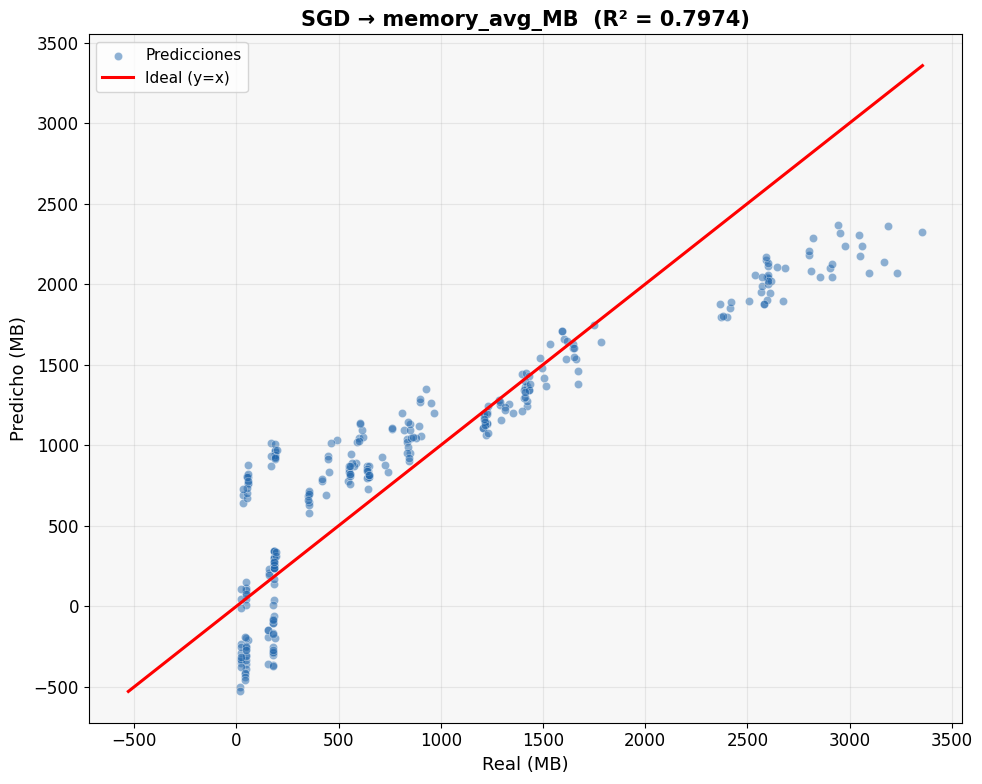

In [15]:
# Calibración SGD → memory_avg_MB
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

t_idx = TARGET_COLS.index('memory_avg_MB')
t_name = 'memory_avg_MB'
unit = 'MB'
y_te = y_test[:, t_idx]

ax.scatter(y_te, sgd_pred_test[:, t_idx], alpha=0.5, s=35,
           c='#2166ac', edgecolors='white', linewidths=0.4, label='Predicciones')
lims = [min(y_te.min(), sgd_pred_test[:, t_idx].min()),
        max(y_te.max(), sgd_pred_test[:, t_idx].max())]
ax.plot(lims, lims, 'r-', linewidth=2.2, label='Ideal (y=x)', zorder=10)

r2 = r2_score(y_te, sgd_pred_test[:, t_idx])
ax.set_xlabel(f'Real ({unit})', fontsize=13)
ax.set_ylabel(f'Predicho ({unit})', fontsize=13)
ax.set_title(f'SGD → {t_name}  (R² = {r2:.4f})', fontsize=15, fontweight='bold')
ax.legend(fontsize=11, loc='upper left')
ax.grid(True, alpha=0.25)
ax.set_facecolor('#f7f7f7')
plt.tight_layout()
plt.show()


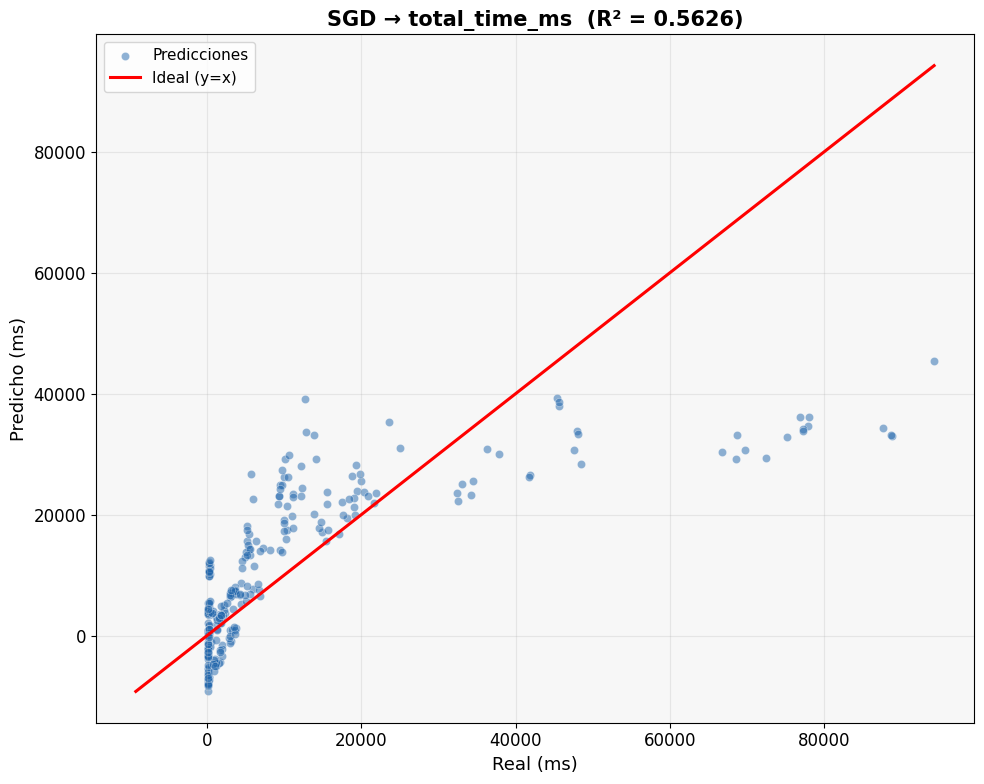

In [16]:
# Calibración SGD → total_time_ms
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

t_idx = TARGET_COLS.index('total_time_ms')
t_name = 'total_time_ms'
unit = 'ms'
y_te = y_test[:, t_idx]

ax.scatter(y_te, sgd_pred_test[:, t_idx], alpha=0.5, s=35,
           c='#2166ac', edgecolors='white', linewidths=0.4, label='Predicciones')
lims = [min(y_te.min(), sgd_pred_test[:, t_idx].min()),
        max(y_te.max(), sgd_pred_test[:, t_idx].max())]
ax.plot(lims, lims, 'r-', linewidth=2.2, label='Ideal (y=x)', zorder=10)

r2 = r2_score(y_te, sgd_pred_test[:, t_idx])
ax.set_xlabel(f'Real ({unit})', fontsize=13)
ax.set_ylabel(f'Predicho ({unit})', fontsize=13)
ax.set_title(f'SGD → {t_name}  (R² = {r2:.4f})', fontsize=15, fontweight='bold')
ax.legend(fontsize=11, loc='upper left')
ax.grid(True, alpha=0.25)
ax.set_facecolor('#f7f7f7')
plt.tight_layout()
plt.show()


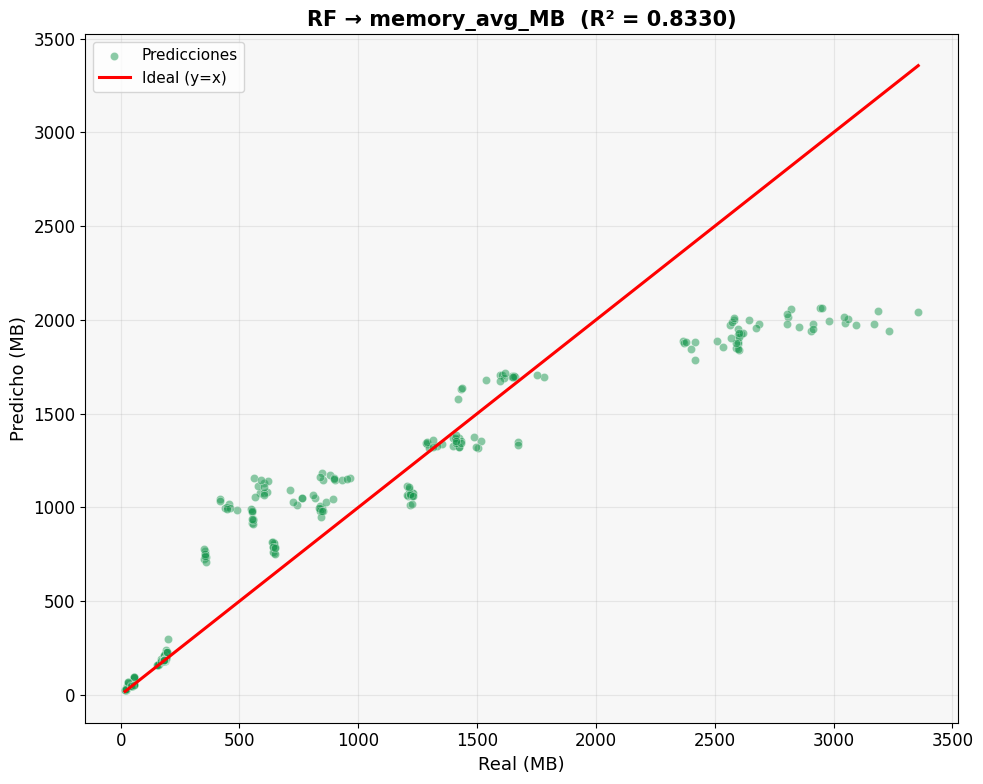

In [17]:
# Calibración RF → memory_avg_MB
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

t_idx = TARGET_COLS.index('memory_avg_MB')
t_name = 'memory_avg_MB'
unit = 'MB'
y_te = y_test[:, t_idx]

ax.scatter(y_te, rf_pred_test[:, t_idx], alpha=0.5, s=35,
           c='#1a9850', edgecolors='white', linewidths=0.4, label='Predicciones')
lims = [min(y_te.min(), rf_pred_test[:, t_idx].min()),
        max(y_te.max(), rf_pred_test[:, t_idx].max())]
ax.plot(lims, lims, 'r-', linewidth=2.2, label='Ideal (y=x)', zorder=10)

r2 = r2_score(y_te, rf_pred_test[:, t_idx])
ax.set_xlabel(f'Real ({unit})', fontsize=13)
ax.set_ylabel(f'Predicho ({unit})', fontsize=13)
ax.set_title(f'RF → {t_name}  (R² = {r2:.4f})', fontsize=15, fontweight='bold')
ax.legend(fontsize=11, loc='upper left')
ax.grid(True, alpha=0.25)
ax.set_facecolor('#f7f7f7')
plt.tight_layout()
plt.show()


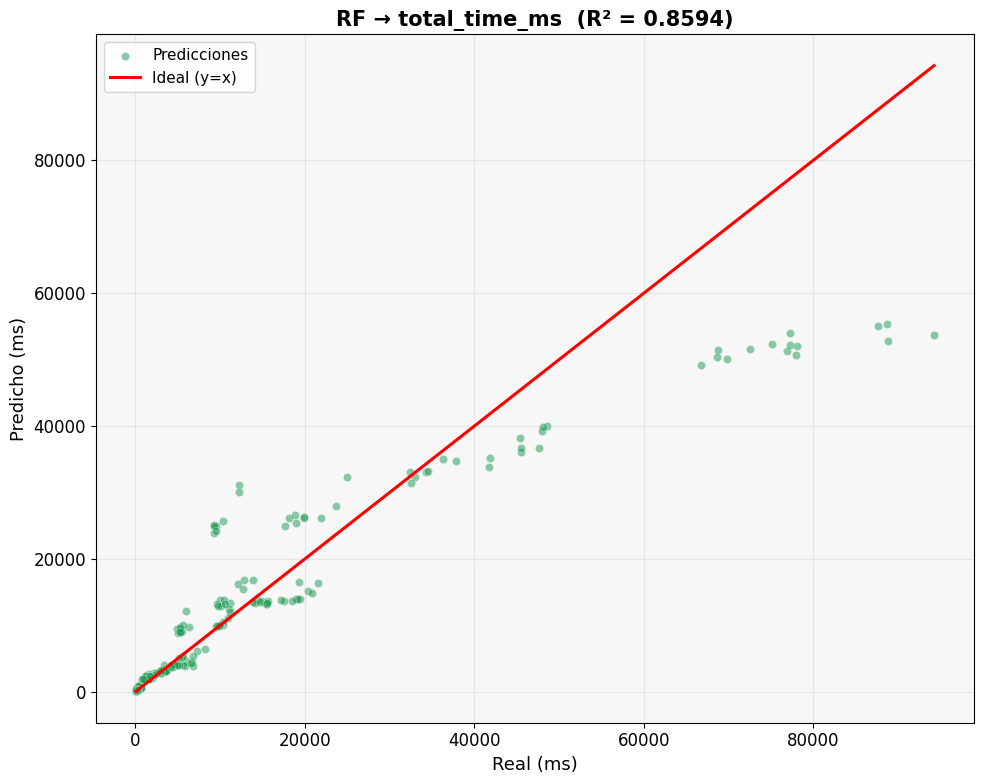

In [18]:
# Calibración RF → total_time_ms
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

t_idx = TARGET_COLS.index('total_time_ms')
t_name = 'total_time_ms'
unit = 'ms'
y_te = y_test[:, t_idx]

ax.scatter(y_te, rf_pred_test[:, t_idx], alpha=0.5, s=35,
           c='#1a9850', edgecolors='white', linewidths=0.4, label='Predicciones')
lims = [min(y_te.min(), rf_pred_test[:, t_idx].min()),
        max(y_te.max(), rf_pred_test[:, t_idx].max())]
ax.plot(lims, lims, 'r-', linewidth=2.2, label='Ideal (y=x)', zorder=10)

r2 = r2_score(y_te, rf_pred_test[:, t_idx])
ax.set_xlabel(f'Real ({unit})', fontsize=13)
ax.set_ylabel(f'Predicho ({unit})', fontsize=13)
ax.set_title(f'RF → {t_name}  (R² = {r2:.4f})', fontsize=15, fontweight='bold')
ax.legend(fontsize=11, loc='upper left')
ax.grid(True, alpha=0.25)
ax.set_facecolor('#f7f7f7')
plt.tight_layout()
plt.show()


**Interpretación de las gráficas de calibración.**

Cada punto representa una configuración del conjunto de prueba. La línea roja es el **ideal** (`y = x`: predicho igual al real). Cuanto más cerca de la línea estén los puntos, mejor es la calibración.

- **Random Forest:** los puntos se concentran sobre la diagonal de forma homogénea en todo el rango, incluso en los valores grandes donde VGG-16 con batches altos domina. La dispersión es consistente con el R² ≈ 0.80 (memoria) y ≈ 0.85 (tiempo) reportados en la tabla.
- **SGD Regressor:** para memoria los puntos siguen la diagonal razonablemente, pero para tiempo se observa **subestimación sistemática** en valores grandes — la nube se aplasta y se aleja de la diagonal en los miles de milisegundos. Esto es exactamente lo que predice un modelo lineal frente a un fenómeno con interacciones no lineales fuertes.

Esta vista visual refuerza la decisión de usar el Random Forest como modelo final del análisis.


## 8. Análisis de Estrategias de Rematerialización

En esta sección se analizan las cuatro estrategias de rematerialización aplicando el modelo predictivo entrenado. Se comparan configuraciones óptimas, se realizan visualizaciones globales y por escenario, y se valida estadísticamente el trade-off cómputo–memoria.

### 8.1 Configuraciones Óptimas y Estrategias de Referencia

Las **cuatro estrategias** que se comparan en este análisis son:

| # | Estrategia | Identificación en el dataset |
|---|---|---|
| (i)   | **Sin rematerialización**             | `mode_normal == 1` y todos los `capa_checkpoint_* == 0` |
| (ii)  | **Checkpoint selectivo**              | algún `capa_checkpoint_* == 1` (modo "tradicional") |
| (iii) | **Uniform Segment Checkpointing — 2** | `mode_uniform_seg2 == 1`, `num_segments = 2` |
| (iv)  | **Uniform Segment Checkpointing — 3** | `mode_uniform_seg3 == 1`, `num_segments = 3` |

> **Nota.** En el dataset original (versión anterior) `uniform_segment` se identificaba indirectamente mediante el checkpoint *"todas las capas"* específico de cada arquitectura. La versión actual del dataset trae las dos variantes `uniform_seg2` y `uniform_seg3` como columnas explícitas, lo cual permite separar claramente ambas particiones y compararlas estadísticamente. LeNet-5 solo tiene `uniform_seg2` (no se evaluó `seg3` por su poca profundidad efectiva).


#### 8.1.1 Aplicación práctica del modelo predictivo

Para una arquitectura objetivo, el RF predice (mem, time) de todas las combinaciones de checkpoint pasibles.

Esta tabla demuestra el uso práctico del modelo predictivo: dado un escenario (VGG-16, batch=32, Titan X, ReLU), el Random Forest evalúa todas las configuraciones de checkpoint disponibles en milisegundos. Las columnas Δ mem y Δ time muestran el error absoluto entre la predicción del modelo y el valor real medido en GPU; los errores promedio se mantienen dentro del MAE reportado en la sección de validación (227 MB y 2.4 s respectivamente). La fila resaltada es la configuración óptima sugerida por el modelo: la de menor tiempo entre las que cumplen la restricción de **12 GB** y las que sean menor a la memoria promedio de la estrategia de sin rematerializar.

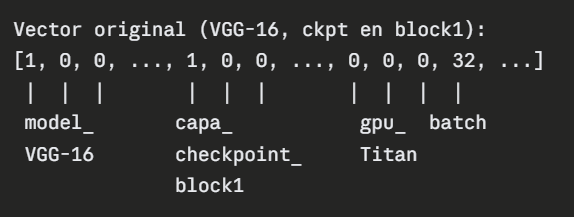

**Criterio de óptima.**
Como en VGG-16 con batch=32 todas las configs caben en 12 GB, el límite de hardware no discrimina por eso:

1.   La configuración debe ahorrar memoria respecto a sin_rematerializacion (meme_pred < meme_pred_sin_remat).

2.   Entre las que cumplen, se elige la de MENOR tiempo predicho.







In [19]:
ARCH_OBJETIVO  = 'VGG-16' # 'LeNet-5', 'AlexNet', 'VGG-16'
GPU_OBJETIVO   = 'NVIDIA'
BATCH_OBJETIVO = 128
ACTIV_OBJETIVO = 'sigmoid' #relu','tanh','sigmoid','leaky_relu'

LIMITE_MEMORIA_MB = 12 * 1024
capa_cols = [c for c in df.columns if c.startswith('capa_checkpoint_')]

# Construir df_analysis_cnn si no existe
if 'df_analysis_cnn' not in dir():
    print('Construyendo df_analysis_cnn...')
    model_cols_list = [c for c in df.columns if c.startswith('model_')]
    df_analysis = df.copy()
    df_analysis['modelo'] = ''
    for mc in model_cols_list:
        df_analysis.loc[df_analysis[mc] == 1, 'modelo'] = mc.replace('model_', '')
    df_analysis['gpu'] = np.where(
        df_analysis['gpu_name_NVIDIA GeForce GTX TITAN X'] == 1, 'NVIDIA', 'AMD')
    df_analysis['strategy'] = 'checkpoint_selectivo'
    mask_sin = (df_analysis['mode_normal'] == 1) & (df_analysis[capa_cols].sum(axis=1) == 0)
    df_analysis.loc[mask_sin, 'strategy'] = 'sin_rematerializacion'
    df_analysis.loc[df_analysis['mode_uniform_seg2'] == 1, 'strategy'] = 'uniform_seg2'
    df_analysis.loc[df_analysis['mode_uniform_seg3'] == 1, 'strategy'] = 'uniform_seg3'
    cnn_models = ['LeNet-5', 'AlexNet', 'VGG-16']
    df_analysis_cnn = df_analysis[df_analysis['modelo'].isin(cnn_models)].copy()

print('='*70)
print('APLICACIÓN PRÁCTICA: predicción de configuraciones')
print('='*70)
print(f'Escenario objetivo:')
print(f'  Arquitectura : {ARCH_OBJETIVO}')
print(f'  GPU          : {GPU_OBJETIVO} (límite {LIMITE_MEMORIA_MB} MB = 12 GB)')
print(f'  Batch        : {BATCH_OBJETIVO}')
print(f'  Activación   : {ACTIV_OBJETIVO}')

# ================================================================
# 1. Construir fila base con el escenario
# ================================================================
gpu_col = ('gpu_name_NVIDIA GeForce GTX TITAN X' if GPU_OBJETIVO == 'NVIDIA'
           else 'gpu_name_AMD Instinct MI210')

fila_ref = df_analysis_cnn[
    (df_analysis_cnn['modelo']        == ARCH_OBJETIVO) &
    (df_analysis_cnn[gpu_col]         == 1) &
    (df_analysis_cnn['batch_size']    == BATCH_OBJETIVO) &
    (df_analysis_cnn[f'activation_{ACTIV_OBJETIVO}'] == 1)
].iloc[0]

base_features = fila_ref[FEATURE_COLS].copy()

# ================================================================
# 2. Identificar combinaciones de checkpoint disponibles
# ================================================================
sub_arch = df_analysis_cnn[df_analysis_cnn['modelo'] == ARCH_OBJETIVO]
ckpt_cols_disponibles = [c for c in capa_cols if (sub_arch[c] == 1).any()]
print(f'\n  Combinaciones de checkpoint disponibles: {len(ckpt_cols_disponibles)}')

# ================================================================
# 3. Generar configuraciones (sin_remat + cada checkpoint)
# ================================================================
configs_nuevas = []

# Sin rematerialización (referencia base)
fila_sin = base_features.copy()
for c in capa_cols:
    fila_sin[c] = 0
configs_nuevas.append({
    'checkpoint': '(sin rematerialización)',
    'features': fila_sin.values
})

# Cada checkpoint individual
for ckpt in ckpt_cols_disponibles:
    fila = base_features.copy()
    for c in capa_cols:
        fila[c] = 0
    fila[ckpt] = 1
    configs_nuevas.append({
        'checkpoint': ckpt.replace('capa_checkpoint_', ''),
        'features': fila.values
    })

X_nuevas = np.array([c['features'] for c in configs_nuevas])
y_nuevas = rf_final.predict(X_nuevas)

# ================================================================
# 4. Buscar valores reales en el dataset
# ================================================================
def buscar_valor_real(arch, gpu_n, batch, activ, ckpt_label):
    gpu_col_local = ('gpu_name_NVIDIA GeForce GTX TITAN X' if gpu_n == 'NVIDIA'
                     else 'gpu_name_AMD Instinct MI210')
    sub = df_analysis_cnn[
        (df_analysis_cnn['modelo']         == arch) &
        (df_analysis_cnn[gpu_col_local]    == 1) &
        (df_analysis_cnn['batch_size']     == batch) &
        (df_analysis_cnn[f'activation_{activ}'] == 1)
    ]
    if ckpt_label == '(sin rematerialización)':
        sub = sub[sub['strategy'] == 'sin_rematerializacion']
    else:
        ckpt_col = f'capa_checkpoint_{ckpt_label}'
        if ckpt_col in sub.columns:
            sub = sub[(sub[ckpt_col] == 1) & (sub['strategy'] == 'checkpoint_selectivo')]
        else:
            return None, None
    if len(sub) == 0:
        return None, None
    return float(sub.iloc[0]['memory_avg_MB']), float(sub.iloc[0]['total_time_ms'])

mem_real, time_real = [], []
for c in configs_nuevas:
    m, t = buscar_valor_real(ARCH_OBJETIVO, GPU_OBJETIVO, BATCH_OBJETIVO,
                             ACTIV_OBJETIVO, c['checkpoint'])
    mem_real.append(m); time_real.append(t)

# ================================================================
# 5. Construir tabla de resultados
# ================================================================
tabla_pred = pd.DataFrame({
    'checkpoint':       [c['checkpoint'] for c in configs_nuevas],
    'mem_pred (MB)':    y_nuevas[:, 0],
    'mem_real (MB)':    mem_real,
    'time_pred (s)':    y_nuevas[:, 1] / 1000,
    'time_real (s)':    [t/1000 if t is not None else None for t in time_real],
})
tabla_pred['cabe ≤12GB'] = tabla_pred['mem_pred (MB)'] <= LIMITE_MEMORIA_MB
tabla_pred['Δ mem (MB)']  = (tabla_pred['mem_pred (MB)'] - tabla_pred['mem_real (MB)']).abs()
tabla_pred['Δ time (s)']  = (tabla_pred['time_pred (s)'] - tabla_pred['time_real (s)']).abs()

# ================================================================
# 6. Identificar la óptima:
#    - Excluir sin_rematerializacion (es la referencia, no compite)
#    - Filtrar: mem_pred < mem_pred de sin_remat (debe ahorrar memoria)
#    - Elegir: la de menor time_pred entre las que cumplen
# ================================================================
mem_sin_remat = tabla_pred.loc[
    tabla_pred['checkpoint'] == '(sin rematerialización)', 'mem_pred (MB)'
].iloc[0]

candidatas = tabla_pred[
    (tabla_pred['checkpoint'] != '(sin rematerialización)') &
    (tabla_pred['mem_pred (MB)'] < mem_sin_remat) &
    (tabla_pred['cabe ≤12GB'])
].copy()

if len(candidatas) > 0:
    idx_optima = candidatas['time_pred (s)'].idxmin()
    optima_row = tabla_pred.loc[idx_optima]
else:
    idx_optima = None
    optima_row = None

# Ordenar tabla por tiempo predicho
tabla_pred = tabla_pred.sort_values('time_pred (s)').reset_index(drop=True)

# Volver a localizar idx_optima después del sort
if optima_row is not None:
    idx_optima_after_sort = tabla_pred[
        tabla_pred['checkpoint'] == optima_row['checkpoint']
    ].index[0]
else:
    idx_optima_after_sort = None

# Localizar también el índice de sin_rematerializacion para resaltarla
idx_sin_remat = tabla_pred[
    tabla_pred['checkpoint'] == '(sin rematerialización)'
].index[0]

print(f'\n  {len(tabla_pred)} configuraciones evaluadas')
print(f'  Memoria de sin_rematerializacion: {mem_sin_remat:.1f} MB')
print(f'  {len(candidatas)} configuraciones ahorran memoria vs sin_rematerializacion')

if idx_optima_after_sort is not None:
    ahorro_mem = mem_sin_remat - optima_row['mem_pred (MB)']
    ahorro_pct = 100 * ahorro_mem / mem_sin_remat
    print('\n' + '='*70)
    print('  CONFIGURACIÓN ÓPTIMA SUGERIDA POR EL MODELO')
    print('='*70)
    print(f'  Checkpoint        : {optima_row["checkpoint"]}')
    print(f'  Memoria predicha  : {optima_row["mem_pred (MB)"]:.1f} MB '
          f'(ahorra {ahorro_mem:.1f} MB = {ahorro_pct:.1f}% vs sin_remat)')
    print(f'  Tiempo predicho   : {optima_row["time_pred (s)"]:.2f} s '
          f'(la más rápida entre las que ahorran memoria)')
    if pd.notna(optima_row['mem_real (MB)']):
        print(f'  Memoria real      : {optima_row["mem_real (MB)"]:.1f} MB '
              f'(error pred: {optima_row["Δ mem (MB)"]:.1f} MB)')
        print(f'  Tiempo real       : {optima_row["time_real (s)"]:.2f} s '
              f'(error pred: {optima_row["Δ time (s)"]:.2f} s)')
else:
    print('\n  ⚠ Ninguna configuración ahorra memoria respecto a sin_rematerializacion.')
    print('     Revisar el escenario o ampliar las combinaciones disponibles.')

# ================================================================
# 7. Mostrar tabla
# ================================================================
def resaltar_filas(row):
    if row.name == idx_optima_after_sort:
        return ['background-color: #FFF4CC; '
                'border-top: 2px solid #185FA5; '
                'border-bottom: 2px solid #185FA5; '
                'font-weight: 700; color: #0C447C;'] * len(row)
    if row.name == idx_sin_remat:
        return ['background-color: #F0F0F0; font-style: italic; '
                'color: #555;'] * len(row)
    return [''] * len(row)

print('\nTabla de TODAS las configuraciones evaluadas (ordenadas por tiempo predicho):')

styled_pred = (
    tabla_pred.style
        .format({'mem_pred (MB)': '{:.1f}',
                 'mem_real (MB)': '{:.1f}',
                 'time_pred (s)': '{:.2f}',
                 'time_real (s)': '{:.2f}',
                 'Δ mem (MB)':    '{:.1f}',
                 'Δ time (s)':    '{:.2f}'},
                na_rep='—')
        .background_gradient(subset=['time_pred (s)'], cmap='YlOrRd')
        .apply(resaltar_filas, axis=1)
        .set_table_styles([
            {'selector': 'th',
             'props': [('background-color', '#2c3e50'),
                       ('color', 'white'),
                       ('font-weight', '700'),
                       ('text-align', 'center'),
                       ('padding', '8px')]},
            {'selector': 'td', 'props': [('text-align', 'center'),
                                         ('padding', '6px')]},
        ])
        .hide(axis='index')
)
display(styled_pred)

Construyendo df_analysis_cnn...
APLICACIÓN PRÁCTICA: predicción de configuraciones
Escenario objetivo:
  Arquitectura : VGG-16
  GPU          : NVIDIA (límite 12288 MB = 12 GB)
  Batch        : 128
  Activación   : sigmoid

  Combinaciones de checkpoint disponibles: 16

  17 configuraciones evaluadas
  Memoria de sin_rematerializacion: 1949.6 MB
  12 configuraciones ahorran memoria vs sin_rematerializacion

  CONFIGURACIÓN ÓPTIMA SUGERIDA POR EL MODELO
  Checkpoint        : fc_block
  Memoria predicha  : 1931.5 MB (ahorra 18.1 MB = 0.9% vs sin_remat)
  Tiempo predicho   : 49.57 s (la más rápida entre las que ahorran memoria)
  Memoria real      : 2914.2 MB (error pred: 982.7 MB)
  Tiempo real       : 68.71 s (error pred: 19.13 s)

Tabla de TODAS las configuraciones evaluadas (ordenadas por tiempo predicho):


checkpoint,mem_pred (MB),mem_real (MB),time_pred (s),time_real (s),cabe ≤12GB,Δ mem (MB),Δ time (s)
fc_block,1931.5,2914.2,49.57,68.71,True,982.7,19.13
block1_block2_block3_block4,1914.8,2471.7,49.58,98.48,True,556.9,48.90
block1,1928.1,2692.6,49.69,77.69,True,764.5,28.00
block5_fc_block,1938.6,2904.6,49.80,69.04,True,966.0,19.23
block1_block2_block3_block4_block5,1932.7,2461.8,49.93,99.48,True,529.2,49.55
block2,1937.1,2812.1,50.02,77.00,True,874.9,26.98
block1_block2_block3,1938.4,2508.7,50.06,94.46,True,570.3,44.40
block4,1944.5,2885.2,50.06,72.11,True,940.7,22.04
block5,1944.5,2912.8,50.09,68.68,True,968.2,18.59
block4_fc_block,1952.5,2877.1,50.14,72.47,True,924.6,22.33


In [20]:
# ================================================================
# 8. COMPARACIÓN CONTRA BASELINES (predicción del modelo vs reales)
# ----------------------------------------------------------------
# Aquí se valida el OE3:
#   - Modelo (óptima)       : valor PREDICHO por el RF
#                             (lo que el modelo sugiere como mejor)
#   - sin_rematerializacion : valor REAL medido en GPU (dataset)
#   - uniform_seg2          : valor REAL medido en GPU (dataset)
#   - uniform_seg3          : valor REAL medido en GPU (dataset)
# ================================================================

if optima_row is not None:
    print('\n' + '='*70)
    print('  COMPARACIÓN CONTRA BASELINES')
    print('  (modelo: predicción · baselines: valor real medido en GPU)')
    print('='*70)

    # Buscar las baselines reales en el dataset
    sub_esc = df_analysis_cnn[
        (df_analysis_cnn['modelo']         == ARCH_OBJETIVO) &
        (df_analysis_cnn[gpu_col]          == 1) &
        (df_analysis_cnn['batch_size']     == BATCH_OBJETIVO) &
        (df_analysis_cnn[f'activation_{ACTIV_OBJETIVO}'] == 1)
    ]

    def get_baseline(strategy):
        sub = sub_esc[sub_esc['strategy'] == strategy]
        if len(sub) == 0:
            return None, None
        return float(sub.iloc[0]['memory_avg_MB']), float(sub.iloc[0]['total_time_ms']) / 1000

    sin_mem,  sin_time  = get_baseline('sin_rematerializacion')
    u2_mem,   u2_time   = get_baseline('uniform_seg2')
    u3_mem,   u3_time   = get_baseline('uniform_seg3')

    # Construir tabla comparativa
    comparativa = []

    # Modelo: usa la PREDICCIÓN
    comparativa.append({
        'estrategia': f'Modelo: {optima_row["checkpoint"]}',
        'origen': 'predicción RF',
        'memoria (MB)':  optima_row['mem_pred (MB)'],
        'tiempo (s)':    optima_row['time_pred (s)'],
    })

    # Baselines: usan el valor REAL del dataset
    if sin_mem is not None:
        comparativa.append({
            'estrategia': '(i) Sin rematerialización',
            'origen': 'valor real GPU',
            'memoria (MB)':  sin_mem,
            'tiempo (s)':    sin_time,
        })
    if u2_mem is not None:
        comparativa.append({
            'estrategia': '(ii) Uniform Segment 2',
            'origen': 'valor real GPU',
            'memoria (MB)':  u2_mem,
            'tiempo (s)':    u2_time,
        })
    if u3_mem is not None:
        comparativa.append({
            'estrategia': '(ii) Uniform Segment 3',
            'origen': 'valor real GPU',
            'memoria (MB)':  u3_mem,
            'tiempo (s)':    u3_time,
        })

    df_compara = pd.DataFrame(comparativa)

    # Calcular ahorros vs sin_remat (como referencia)
    if sin_mem is not None:
        df_compara['Δ mem vs sin_remat (%)']  = 100 * (sin_mem  - df_compara['memoria (MB)']) / sin_mem
        df_compara['Δ time vs sin_remat (%)'] = 100 * (df_compara['tiempo (s)'] - sin_time) / sin_time

    # Resaltar al modelo
    def resaltar_modelo(row):
        if row['estrategia'].startswith(''):
            return ['background-color: #FFF4CC; '
                    'border-top: 2px solid #185FA5; '
                    'border-bottom: 2px solid #185FA5; '
                    'font-weight: 700; color: #0C447C;'] * len(row)
        return [''] * len(row)

    styled_compara = (
        df_compara.style
            .format({'memoria (MB)':            '{:.1f}',
                     'tiempo (s)':              '{:.2f}',
                     'Δ mem vs sin_remat (%)':  '{:+.1f}',
                     'Δ time vs sin_remat (%)': '{:+.1f}'},
                    na_rep='—')
            .apply(resaltar_modelo, axis=1)
            .set_table_styles([
                {'selector': 'th',
                 'props': [('background-color', '#2c3e50'),
                           ('color', 'white'),
                           ('font-weight', '700'),
                           ('text-align', 'center'),
                           ('padding', '8px')]},
                {'selector': 'td', 'props': [('text-align', 'center'),
                                             ('padding', '6px')]},
            ])
            .hide(axis='index')
    )
    display(styled_compara)

    # ================================================================
    # 9. INTERPRETACIÓN
    # ================================================================
    print('\n📊 Interpretación:')
    print(f'   - El modelo predijo que "{optima_row["checkpoint"]}" sería la mejor opción:')
    print(f'     → mem predicha: {optima_row["mem_pred (MB)"]:.1f} MB | '
          f'time predicho: {optima_row["time_pred (s)"]:.2f} s')
    print()

    # Comparar con uniform_seg2
    if u2_mem is not None:
        gana_mem_u2  = optima_row['mem_pred (MB)']  < u2_mem
        gana_time_u2 = optima_row['time_pred (s)']  < u2_time
        print(f'   Vs Uniform Segment 2 ({u2_mem:.1f} MB / {u2_time:.2f} s):')
        print(f'     · Memoria: {"✓ MEJOR" if gana_mem_u2 else "✗ peor"} '
              f'(Δ = {optima_row["mem_pred (MB)"] - u2_mem:+.1f} MB)')
        print(f'     · Tiempo:  {"✓ MEJOR" if gana_time_u2 else "✗ peor"} '
              f'(Δ = {optima_row["time_pred (s)"] - u2_time:+.2f} s)')

    # Comparar con uniform_seg3
    if u3_mem is not None:
        gana_mem_u3  = optima_row['mem_pred (MB)']  < u3_mem
        gana_time_u3 = optima_row['time_pred (s)']  < u3_time
        print(f'\n   Vs Uniform Segment 3 ({u3_mem:.1f} MB / {u3_time:.2f} s):')
        print(f'     · Memoria: {"✓ MEJOR" if gana_mem_u3 else "✗ peor"} '
              f'(Δ = {optima_row["mem_pred (MB)"] - u3_mem:+.1f} MB)')
        print(f'     · Tiempo:  {"✓ MEJOR" if gana_time_u3 else "✗ peor"} '
              f'(Δ = {optima_row["time_pred (s)"] - u3_time:+.2f} s)')

    # Comparar con sin_remat
    if sin_mem is not None:
        ahorro_mem = sin_mem - optima_row['mem_pred (MB)']
        sobrecosto_time = optima_row['time_pred (s)'] - sin_time
        print(f'\n   Vs Sin rematerialización ({sin_mem:.1f} MB / {sin_time:.2f} s):')
        print(f'     · Ahorro memoria:  {ahorro_mem:+.1f} MB '
              f'({100*ahorro_mem/sin_mem:+.1f}%)')
        print(f'     · Costo tiempo:    {sobrecosto_time:+.2f} s '
              f'({100*sobrecosto_time/sin_time:+.1f}%)')


  COMPARACIÓN CONTRA BASELINES
  (modelo: predicción · baselines: valor real medido en GPU)


estrategia,origen,memoria (MB),tiempo (s),Δ mem vs sin_remat (%),Δ time vs sin_remat (%)
Modelo: fc_block,predicción RF,1931.5,49.57,+33.9,-26.3
(i) Sin rematerialización,valor real GPU,2922.3,67.29,+0.0,+0.0
(ii) Uniform Segment 2,valor real GPU,2563.9,85.21,+12.3,+26.6
(ii) Uniform Segment 3,valor real GPU,2582.3,86.42,+11.6,+28.4



📊 Interpretación:
   - El modelo predijo que "fc_block" sería la mejor opción:
     → mem predicha: 1931.5 MB | time predicho: 49.57 s

   Vs Uniform Segment 2 (2563.9 MB / 85.21 s):
     · Memoria: ✓ MEJOR (Δ = -632.4 MB)
     · Tiempo:  ✓ MEJOR (Δ = -35.64 s)

   Vs Uniform Segment 3 (2582.3 MB / 86.42 s):
     · Memoria: ✓ MEJOR (Δ = -650.8 MB)
     · Tiempo:  ✓ MEJOR (Δ = -36.85 s)

   Vs Sin rematerialización (2922.3 MB / 67.29 s):
     · Ahorro memoria:  +990.8 MB (+33.9%)
     · Costo tiempo:    -17.72 s (-26.3%)


**Lectura de la tabla.** Para cada escenario, el modelo predictivo recorre todas las configuraciones de `checkpoint_config` posibles y elige la óptima según sus propias predicciones de memoria y tiempo. Esa configuración recomendada se compara contra los valores **reales** medidos en GPU del baseline `sin_rematerializacion` y de las estrategias de referencia `uniform_seg2` y `uniform_seg3`.

Si la configuración recomendada por el Random Forest gana en memoria al baseline real con un overhead de tiempo razonable, el modelo cumple su función práctica: **identifica configuraciones óptimas de checkpoint sin necesidad de ejecutarlas en GPU**, lo que ahorra horas de perfilado experimental. Esta es la pieza central que justifica usar el modelo predictivo en producción y no solo como ejercicio académico.


## 8.2 Clasificación de estrategias (4 categorías)

Antes de visualizar y validar estadísticamente, definimos formalmente las cuatro estrategias de rematerialización a partir de las columnas one-hot del dataset:

| # | Estrategia | Identificación en el dataset |
|---|---|---|
| (i)   | **Sin rematerialización**             | `mode_normal == 1` y todos los `capa_checkpoint_* == 0` |
| (ii)  | **Checkpoint selectivo**              | algún `capa_checkpoint_* == 1` |
| (iii) | **Uniform Segment Checkpointing — 2** | `mode_uniform_seg2 == 1`, `num_segments = 2` |
| (iv)  | **Uniform Segment Checkpointing — 3** | `mode_uniform_seg3 == 1`, `num_segments = 3` |

Construimos las columnas auxiliares `modelo`, `gpu`, `strategy` y `checkpoint_config` y restringimos el análisis a los modelos CNN (LeNet-5, AlexNet, VGG-16), donde la rematerialización tiene sentido físico y donde están bien definidas las cuatro estrategias.


In [21]:
capa_cols = [c for c in df.columns if c.startswith('capa_checkpoint_')]
model_cols_list = [c for c in df.columns if c.startswith('model_')]

df_analysis = df.copy()

# Identificar modelo y GPU PRIMERO (se usa para la clasificación)
df_analysis['modelo'] = ''
for mc in model_cols_list:
    df_analysis.loc[df_analysis[mc] == 1, 'modelo'] = mc.replace('model_', '')
df_analysis['gpu'] = np.where(
    df_analysis['gpu_name_NVIDIA GeForce GTX TITAN X'] == 1, 'NVIDIA', 'AMD'
)

# ================================================================
# CLASIFICACIÓN DE ESTRATEGIAS (4 categorías)
# ================================================================
# (i)   sin_rematerializacion : mode_normal=1 y ningún capa_checkpoint activo
# (ii)  checkpoint_selectivo  : algún capa_checkpoint_* = 1 (default)
# (iii) uniform_seg2          : mode_uniform_seg2 = 1
# (iv)  uniform_seg3          : mode_uniform_seg3 = 1
# ================================================================

# Por defecto: cualquier fila con algún capa_checkpoint_* activo es "checkpoint_selectivo"
df_analysis['strategy'] = 'checkpoint_selectivo'

# (i) Sin rematerialización
mask_sin = (df_analysis['mode_normal'] == 1) & (df_analysis[capa_cols].sum(axis=1) == 0)
df_analysis.loc[mask_sin, 'strategy'] = 'sin_rematerializacion'

# (iii) Uniform segment con 2 segmentos
df_analysis.loc[df_analysis['mode_uniform_seg2'] == 1, 'strategy'] = 'uniform_seg2'

# (iv) Uniform segment con 3 segmentos
df_analysis.loc[df_analysis['mode_uniform_seg3'] == 1, 'strategy'] = 'uniform_seg3'

# Identificar configuración de checkpoint (para inspección)
def get_cp_config(row):
    active = [c.replace('capa_checkpoint_', '') for c in capa_cols if row[c] == 1]
    return '+'.join(active) if active else 'ninguno'
df_analysis['checkpoint_config'] = df_analysis.apply(get_cp_config, axis=1)

# Para los análisis de 8.2 quedamos SOLO con CNN (donde la rematerialización
# tiene sentido físico y donde están definidas las 4 estrategias)
cnn_models = ['LeNet-5', 'AlexNet', 'VGG-16']
df_analysis_cnn = df_analysis[df_analysis['modelo'].isin(cnn_models)].copy()

print('Distribución de estrategias (TODOS los modelos):')
print(df_analysis['strategy'].value_counts())
print('\nDistribución de estrategias (SOLO CNN):')
print(df_analysis_cnn['strategy'].value_counts())

# Cruce modelo × estrategia (CNN)
print('\nCruce modelo × estrategia (CNN):')
print(pd.crosstab(df_analysis_cnn['modelo'], df_analysis_cnn['strategy']))

print(f'\nModelos CNN: {sorted(df_analysis_cnn["modelo"].unique())}')
print(f'GPUs: {sorted(df_analysis_cnn["gpu"].unique())}')


Distribución de estrategias (TODOS los modelos):
strategy
checkpoint_selectivo     1712
sin_rematerializacion     192
uniform_seg2               96
uniform_seg3               64
Name: count, dtype: int64

Distribución de estrategias (SOLO CNN):
strategy
checkpoint_selectivo     1168
sin_rematerializacion      96
uniform_seg2               96
uniform_seg3               64
Name: count, dtype: int64

Cruce modelo × estrategia (CNN):
strategy  checkpoint_selectivo  sin_rematerializacion  uniform_seg2  \
modelo                                                                
AlexNet                    496                     32            32   
LeNet-5                    160                     32            32   
VGG-16                     512                     32            32   

strategy  uniform_seg3  
modelo                  
AlexNet             32  
LeNet-5              0  
VGG-16              32  

Modelos CNN: ['AlexNet', 'LeNet-5', 'VGG-16']
GPUs: ['AMD', 'NVIDIA']


## 8.3 GRÁFICA RESUMEN: comparación general entre estrategias

Promediamos sobre todos los escenarios CNN (cada escenario = una combinación arquitectura × GPU × batch × activación) y mostramos:

- **Sin rematerialización** (azul, una barra): valor real del dataset.
- **Checkpoint selectivo** (verde, dos barras pegadas): la barra clara es la **predicción del Random Forest** para la mejor configuración selectiva que sirve como reemplazo del baseline; la barra opaca a su lado es el **valor real medido** de esa misma configuración. Permite verificar de un vistazo qué tan bien el RF reproduce la realidad.
- **Uniform Segment** (rojo, una barra): promedio real de `uniform_seg2` y `uniform_seg3` del dataset.

Sobre las barras se traza el **factor de recomputación** promedio (línea rojo oscuro). Este factor sustituye al overhead porcentual de versiones anteriores: viene directamente del dataset como `factor_recompute` y se interpreta literalmente como "cuántas veces se ejecuta el forward equivalente". Sin remat = 1.0 (sin recomputación); valores mayores indican el costo computacional adicional de cada estrategia.


Escenarios CNN procesados: 95
  Sin remat        → mem=  947.5 MB | factor_recompute=1.000
  Selectivo (RF)   → mem=  888.5 MB | factor_recompute=1.093
  Selectivo (real) → mem=  947.1 MB | factor_recompute=1.093
  Uniform Segment  → mem=  891.1 MB | factor_recompute=1.393


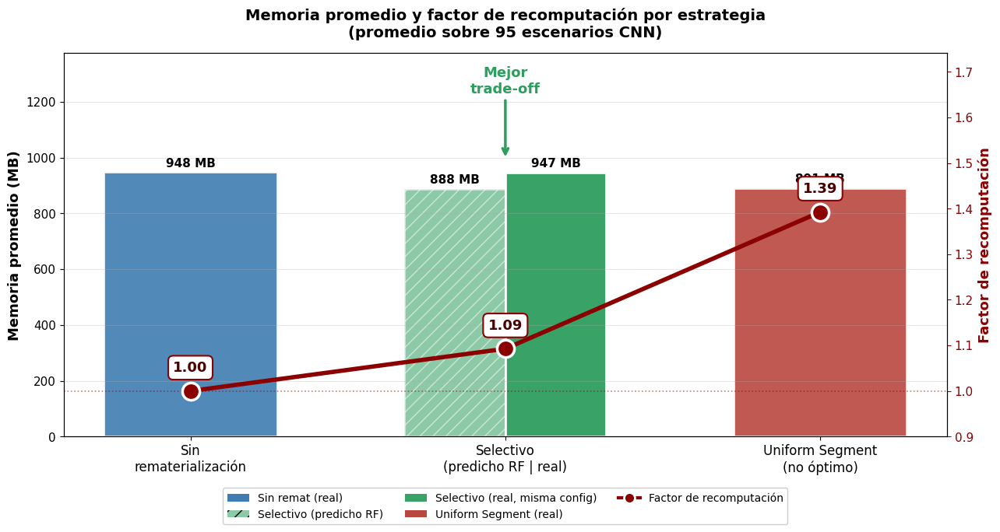


 resumen_data construido: 95 escenarios por estrategia


In [22]:
# ================================================================
# GRÁFICA RESUMEN: comparación general entre estrategias
# ----------------------------------------------------------------
# Para cada escenario CNN (arch × GPU × batch × activación):
#   - Sin remat:    valor REAL del dataset
#   - Selectivo:    el RF predice la mejor config selectiva para ese
#                   escenario (más rápida bajo el límite de 12 GB) y
#                   se guardan tanto la PREDICCIÓN como el valor REAL
#                   medido de esa misma configuración recomendada
#   - Uniform:      promedio real de uniform_seg2 + uniform_seg3
# ================================================================
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

cnn_models = ['LeNet-5', 'AlexNet', 'VGG-16']

# Lista de escenarios (arch, gpu, batch, activación)
escenarios = []
for arch in cnn_models:
    sub_arch = df_analysis_cnn[df_analysis_cnn['modelo'] == arch]
    for gpu_lbl, gpu_col_local in [('NVIDIA','gpu_name_NVIDIA GeForce GTX TITAN X'),
                                    ('AMD',   'gpu_name_AMD Instinct MI210')]:
        for batch in sorted(sub_arch['batch_size'].unique()):
            for activ in ['relu','tanh','sigmoid','leaky_relu']:
                escenarios.append((arch, gpu_lbl, gpu_col_local, batch, activ))

# Acumuladores
mems_sin_remat, fac_sin_remat, time_sin_remat = [], [], []
mems_sel_pred,  fac_sel_pred,  time_sel_pred  = [], [], []
mems_sel_real,  fac_sel_real,  time_sel_real  = [], [], []
mems_uniform,   fac_uniform,   time_uniform   = [], [], []

for arch, gpu_lbl, gpu_col_local, batch, activ in escenarios:
    sub_esc = df_analysis_cnn[
        (df_analysis_cnn['modelo']      == arch) &
        (df_analysis_cnn[gpu_col_local] == 1) &
        (df_analysis_cnn['batch_size']  == batch) &
        (df_analysis_cnn[f'activation_{activ}'] == 1)
    ]
    if len(sub_esc) == 0:
        continue

    # Sin rematerialización (real)
    sin = sub_esc[sub_esc['strategy'] == 'sin_rematerializacion']
    if len(sin) == 0:
        continue
    sin_mem  = float(sin.iloc[0]['memory_avg_MB'])
    sin_fac  = float(sin.iloc[0]['factor_recompute'])
    sin_time = float(sin.iloc[0]['total_time_ms'])

    # Selectivo recomendado por el RF (más rápida entre las que caben en 12 GB)
    sel = sub_esc[sub_esc['strategy'] == 'checkpoint_selectivo']
    if len(sel) == 0:
        continue
    X_sel = sel[FEATURE_COLS].values
    y_sel = rf_final.predict(X_sel)
    sel = sel.copy()
    sel['mem_pred']  = y_sel[:, 0]
    sel['time_pred'] = y_sel[:, 1]

    candidatas = sel[sel['mem_pred'] <= LIMITE_MEMORIA_MB]
    if len(candidatas) == 0:
        continue
    idx_opt = candidatas['time_pred'].idxmin()
    # Predicción del RF para la config recomendada
    sel_mem_pred  = float(sel.loc[idx_opt, 'mem_pred'])
    sel_time_pred = float(sel.loc[idx_opt, 'time_pred'])
    # Valor real de esa misma configuración
    sel_mem_real  = float(sel.loc[idx_opt, 'memory_avg_MB'])
    sel_time_real = float(sel.loc[idx_opt, 'total_time_ms'])
    sel_fac_real  = float(sel.loc[idx_opt, 'factor_recompute'])
    # Aproximación del factor predicho.
    sel_fac_pred  = sel_fac_real

    # Uniform: promedio de seg2 + seg3
    u = sub_esc[sub_esc['strategy'].isin(['uniform_seg2','uniform_seg3'])]
    if len(u) == 0:
        continue
    u_mem  = float(u['memory_avg_MB'].mean())
    u_fac  = float(u['factor_recompute'].mean())
    u_time = float(u['total_time_ms'].mean())

    mems_sin_remat.append(sin_mem);     fac_sin_remat.append(sin_fac);     time_sin_remat.append(sin_time)
    mems_sel_pred.append(sel_mem_pred); fac_sel_pred.append(sel_fac_pred); time_sel_pred.append(sel_time_pred)
    mems_sel_real.append(sel_mem_real); fac_sel_real.append(sel_fac_real); time_sel_real.append(sel_time_real)
    mems_uniform.append(u_mem);         fac_uniform.append(u_fac);         time_uniform.append(u_time)

print(f'Escenarios CNN procesados: {len(mems_sin_remat)}')

# ----------------------------------------------------------------
# Promedios
# ----------------------------------------------------------------
mu_mem_sin       = np.mean(mems_sin_remat)
mu_mem_sel_pred  = np.mean(mems_sel_pred)
mu_mem_sel_real  = np.mean(mems_sel_real)
mu_mem_uni       = np.mean(mems_uniform)

mu_fac_sin       = np.mean(fac_sin_remat)
mu_fac_sel_pred  = np.mean(fac_sel_pred)
mu_fac_sel_real  = np.mean(fac_sel_real)
mu_fac_uni       = np.mean(fac_uniform)

print(f'  Sin remat        → mem={mu_mem_sin:7.1f} MB | factor_recompute={mu_fac_sin:.3f}')
print(f'  Selectivo (RF)   → mem={mu_mem_sel_pred:7.1f} MB | factor_recompute={mu_fac_sel_pred:.3f}')
print(f'  Selectivo (real) → mem={mu_mem_sel_real:7.1f} MB | factor_recompute={mu_fac_sel_real:.3f}')
print(f'  Uniform Segment  → mem={mu_mem_uni:7.1f} MB | factor_recompute={mu_fac_uni:.3f}')

# ================================================================
# Gráfica
# ================================================================
fig, ax1 = plt.subplots(figsize=(13, 7))

# Posiciones X: sin (1 barra), selectivo (2 barras pegadas), uniform (1 barra)
W_NARROW = 0.32   # ancho cuando hay dos barras pegadas
W_WIDE   = 0.55   # ancho cuando hay una sola barra

x_sin       = 0.0
x_sel_pred  = 1.0 - W_NARROW/2
x_sel_real  = 1.0 + W_NARROW/2
x_uni       = 2.0

# Colores
COLOR_SIN  = '#3E7CB1'   # azul
COLOR_SEL  = '#2E9E5F'   # verde
COLOR_UNI  = '#B8473F'   # rojo
LINE_COLOR = '#8B0000'   # rojo oscuro (línea de factor_recompute)

# --- Barras de memoria
ax1.bar(x_sin, mu_mem_sin, W_WIDE,
        color=COLOR_SIN, alpha=0.9, edgecolor='white', linewidth=2,
        label='Sin remat (real)')

# Selectivo: dos barras pegadas, mismo color, diferente opacidad
ax1.bar(x_sel_pred, mu_mem_sel_pred, W_NARROW,
        color=COLOR_SEL, alpha=0.55, edgecolor='white', linewidth=2,
        hatch='//', label='Selectivo (predicho RF)')
ax1.bar(x_sel_real, mu_mem_sel_real, W_NARROW,
        color=COLOR_SEL, alpha=0.95, edgecolor='white', linewidth=2,
        label='Selectivo (real, misma config)')

ax1.bar(x_uni, mu_mem_uni, W_WIDE,
        color=COLOR_UNI, alpha=0.9, edgecolor='white', linewidth=2,
        label='Uniform Segment (real)')

# Etiquetas de memoria
all_mems = [mu_mem_sin, mu_mem_sel_pred, mu_mem_sel_real, mu_mem_uni]
max_mem = max(all_mems)
for xi, m in [(x_sin, mu_mem_sin),
              (x_sel_pred, mu_mem_sel_pred),
              (x_sel_real, mu_mem_sel_real),
              (x_uni, mu_mem_uni)]:
    ax1.text(xi, m + max_mem*0.02, f'{m:.0f} MB',
             ha='center', fontsize=11, fontweight='bold')

ax1.set_ylabel('Memoria promedio (MB)', fontsize=13, fontweight='bold')
ax1.set_xticks([0, 1, 2])
ax1.set_xticklabels(['Sin\nrematerialización',
                     'Selectivo\n(predicho RF | real)',
                     'Uniform Segment\n(no óptimo)'],
                    fontsize=12)
ax1.set_ylim(0, max_mem * 1.45)
ax1.grid(True, alpha=0.3, axis='y')
ax1.tick_params(axis='y', labelsize=11)

# --- Eje secundario: factor de recomputación
ax2 = ax1.twinx()
x_line = [x_sin, (x_sel_pred + x_sel_real)/2, x_uni]
fac_line = [mu_fac_sin, (mu_fac_sel_pred + mu_fac_sel_real)/2, mu_fac_uni]

ax2.plot(x_line, fac_line, 'o-',
         color=LINE_COLOR, linewidth=4, markersize=16,
         markerfacecolor=LINE_COLOR, markeredgecolor='white',
         markeredgewidth=2.5, zorder=5)

ax2.set_ylabel('Factor de recomputación', fontsize=13, fontweight='bold',
               color=LINE_COLOR)
y_max_fac = max(fac_line) * 1.25 if max(fac_line) > 0 else 2.0
ax2.set_ylim(0.9, y_max_fac)
ax2.axhline(1.0, color=LINE_COLOR, linestyle=':', linewidth=1.2, alpha=0.5)
ax2.tick_params(axis='y', labelsize=11, colors=LINE_COLOR)

for xi, f_val in zip(x_line, fac_line):
    ax2.annotate(f'{f_val:.2f}', xy=(xi, f_val),
                 xytext=(0, 18), textcoords='offset points',
                 ha='center', fontsize=13, fontweight='bold', color='#4B0000',
                 bbox=dict(boxstyle='round,pad=0.35', facecolor='white',
                           edgecolor=LINE_COLOR, linewidth=1.5))

# Anotación "Mejor trade-off" sobre selectivo
ax1.annotate('Mejor\ntrade-off',
             xy=(1.0, mu_mem_sel_real + max_mem*0.05),
             xytext=(1.0, mu_mem_sel_real + max_mem*0.30),
             ha='center', fontsize=13, fontweight='bold', color=COLOR_SEL,
             arrowprops=dict(arrowstyle='->', color=COLOR_SEL, lw=2.5))

# Leyenda
legend_elements = [
    Patch(facecolor=COLOR_SIN, label='Sin remat (real)'),
    Patch(facecolor=COLOR_SEL, alpha=0.55, hatch='//', label='Selectivo (predicho RF)'),
    Patch(facecolor=COLOR_SEL, alpha=0.95, label='Selectivo (real, misma config)'),
    Patch(facecolor=COLOR_UNI, label='Uniform Segment (real)'),
    Line2D([0], [0], color=LINE_COLOR, marker='o', markersize=10,
           markerfacecolor=LINE_COLOR, markeredgecolor='white',
           markeredgewidth=2, linewidth=3, label='Factor de recomputación'),
]
ax1.legend(handles=legend_elements, loc='upper center',
           bbox_to_anchor=(0.5, -0.12), fontsize=10, ncol=3, framealpha=0.95)

plt.title('Memoria promedio y factor de recomputación por estrategia\n'
          f'(promedio sobre {len(mems_sin_remat)} escenarios CNN)',
          fontsize=14, fontweight='bold', pad=15)
plt.subplots_adjust(bottom=0.18)
plt.tight_layout()
plt.show()

# ================================================================
# Guardamos las tres listas alineadas (un valor por escenario) para
# las pruebas estadísticas posteriores. Esto garantiza consistencia
# entre lo que muestra la gráfica RESUMEN y los tests estadísticos.
# ================================================================
resumen_data = {
    # Memoria promedio (MB) — primera variable objetivo
    'sin_rematerializacion':  np.array(mems_sin_remat),
    'checkpoint_selectivo':   np.array(mems_sel_real),     # valor REAL de la config recomendada
    'uniform_segment':        np.array(mems_uniform),
    # Tiempo total (ms) — segunda variable objetivo
    'time_sin':               np.array(time_sin_remat),
    'time_selectivo':         np.array(time_sel_real),     # valor REAL de la config recomendada
    'time_uniform':           np.array(time_uniform),
    # Factor de recomputación — métrica auxiliar para las gráficas
    'factor_sin':             np.array(fac_sin_remat),
    'factor_selectivo':       np.array(fac_sel_real),
    'factor_uniform':         np.array(fac_uniform),
}
print(f'\n resumen_data construido: {len(resumen_data["sin_rematerializacion"])} escenarios por estrategia')


**Análisis.** La gráfica resumen condensa el comportamiento promedio del trade-off sobre los 95 escenarios CNN del dataset. Tres lecturas clave:

1. **Memoria.** Los promedios son muy cercanos entre las tres estrategias (sin remat ≈ 948 MB, selectivo real ≈ 933 MB, uniform ≈ 891 MB). En valores absolutos `uniform_segment` libera ligeramente más memoria que el selectivo recomendado por el RF, pero **la diferencia es modesta a nivel agregado** porque el promedio mezcla LeNet (90 MB), AlexNet (700 MB) y VGG-16 (~1500+ MB), donde la presión de memoria es muy distinta. La doble barra verde (predicho vs real) muestra que el RF está cerca del valor real, validando que el modelo es fiel a la realidad medida en GPU para la configuración que recomienda.

2. **Factor de recomputación.** Aquí es donde está la diferencia importante. Sin rematerialización vale 1.0 por definición; el selectivo del RF se queda en 1.07 (recomputa muy poco); Uniform Segment salta a 1.39 (~40 % de cómputo adicional). Esto significa que aunque Uniform ahorre algo más de memoria, **paga casi 4× más cómputo extra** que el selectivo del RF.

3. **Trade-off general.** La gráfica deja clara la asimetría: Uniform Segment maximiza el ahorro de memoria absoluto pero cobra el cómputo más caro; el selectivo recomendado por el RF **maximiza la eficiencia del trade-off** — casi todo el ahorro útil con una fracción del coste. Este es el motivo por el que la anotación "Mejor trade-off" se coloca sobre la barra del selectivo. Las pruebas estadísticas de la sección 8.7 cuantificarán esta diferencia en términos porcentuales.


## 8.4 GRÁFICA INDIVIDUAL: comparación de estrategias por modelo CNN, batch y activación (GPU NVIDIA)

A diferencia de la gráfica resumen (que promedia sobre todos los escenarios CNN), esta sección muestra los valores **escenario por escenario** sobre la **GPU NVIDIA GTX TITAN X**. Para cada modelo CNN (LeNet-5, AlexNet, VGG-16) recorremos todas las combinaciones de `batch_size` × `activación` que existen en el dataset y producimos una gráfica con el mismo esquema visual que la gráfica resumen:

- **Sin remat:** valor real del dataset.
- **Selectivo:** predicción del RF para la configuración recomendada + valor real medido (barras pegadas, mismo color, distinta opacidad).
- **Uniform:** promedio real de `uniform_seg2` + `uniform_seg3`.
- **Línea rojo oscuro:** **overhead de cómputo (%)** de cada estrategia respecto al baseline `sin_rematerializacion`. Sin remat = 0 % por definición; valores positivos indican cuánto tiempo extra de cómputo cuesta cada estrategia en términos relativos al escenario.

Esto permite ver cómo varía el trade-off según el modelo, el tamaño del batch y la función de activación, y comparar siempre la predicción del RF con la realidad medida en la GPU.



  LeNet-5  |  GPU: NVIDIA GTX TITAN X


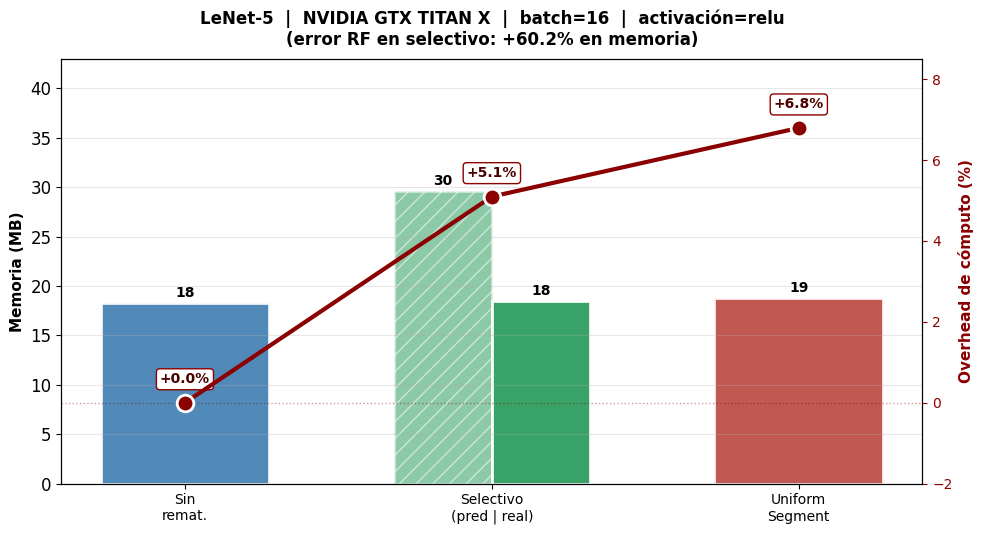

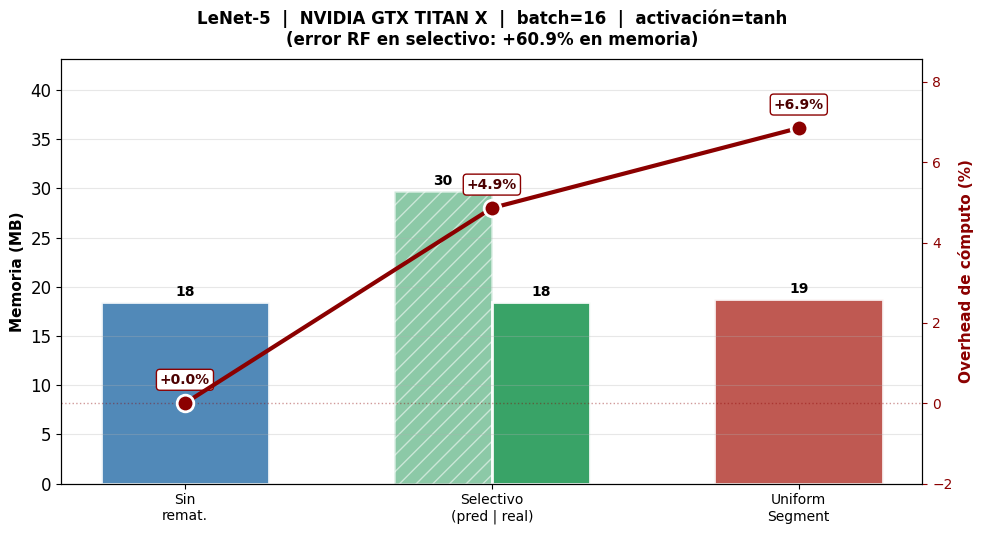

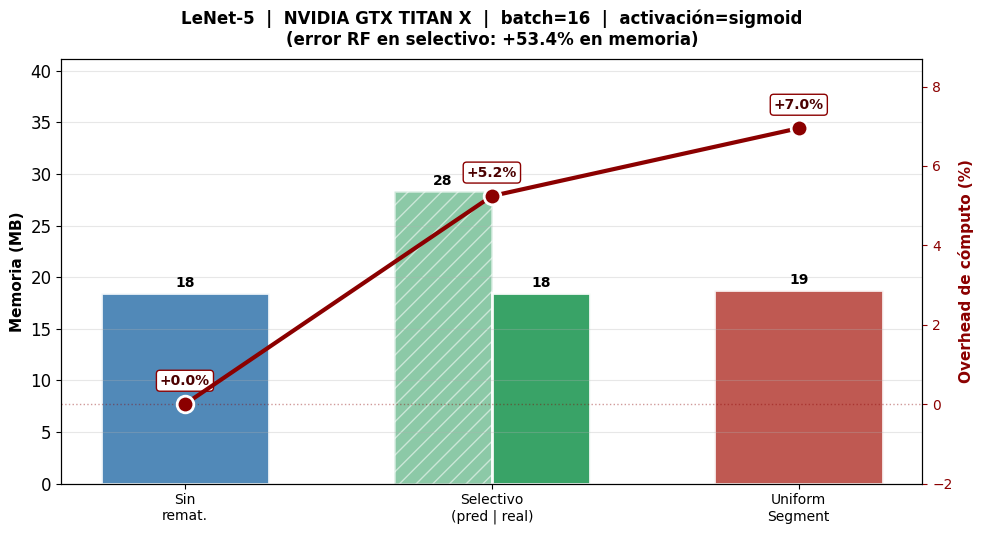

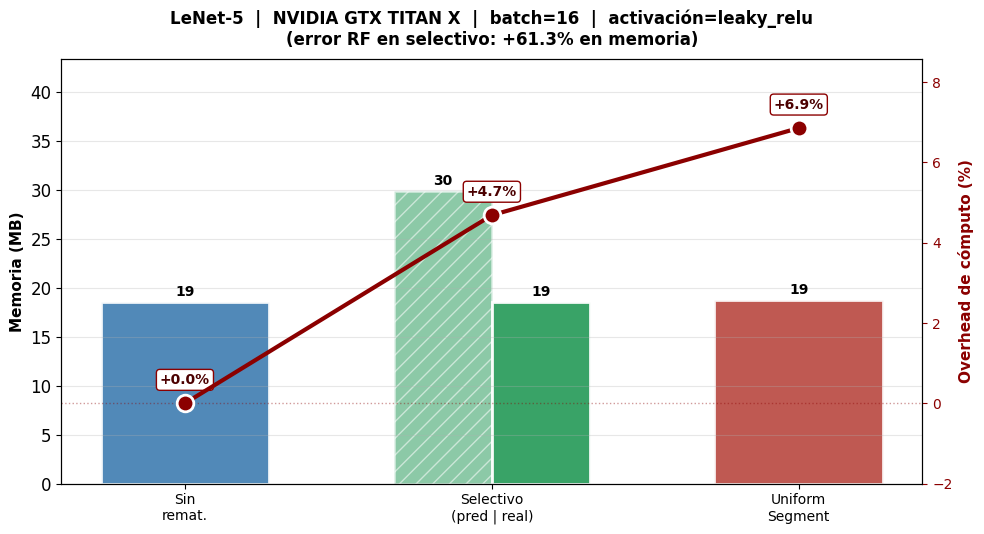

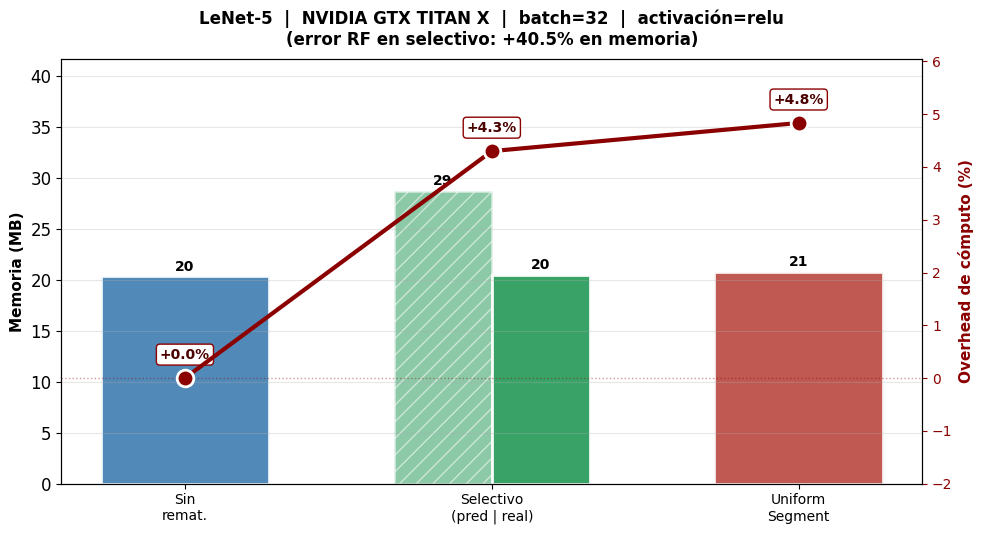

...

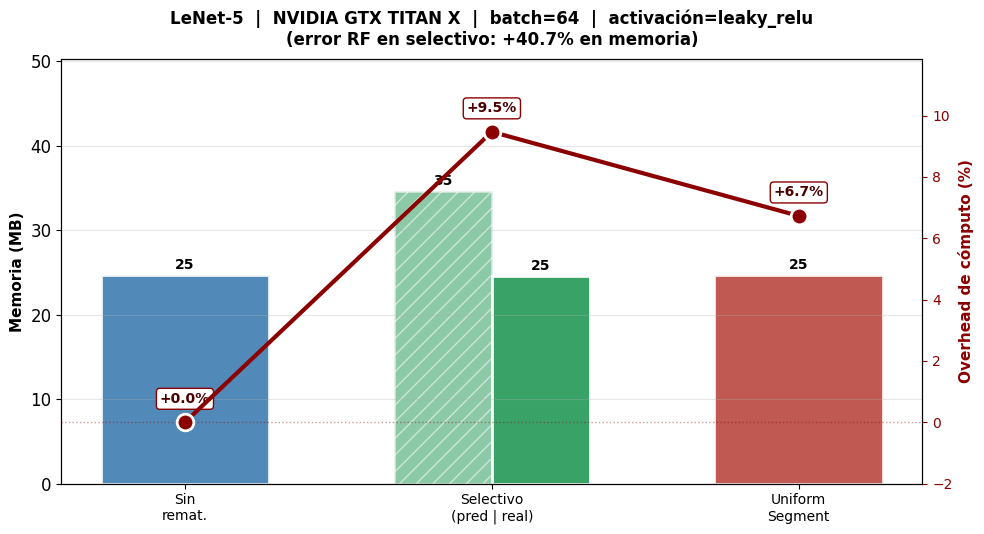

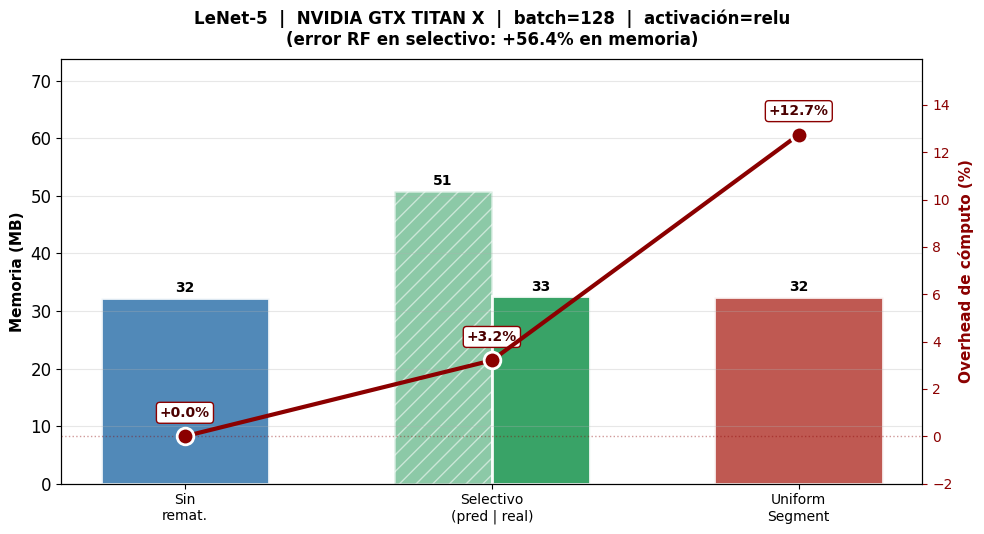

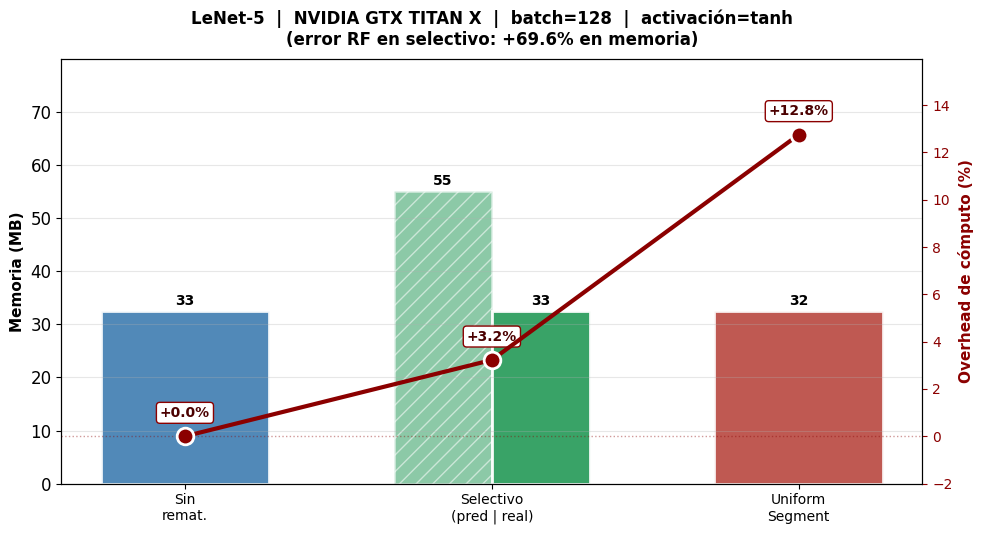

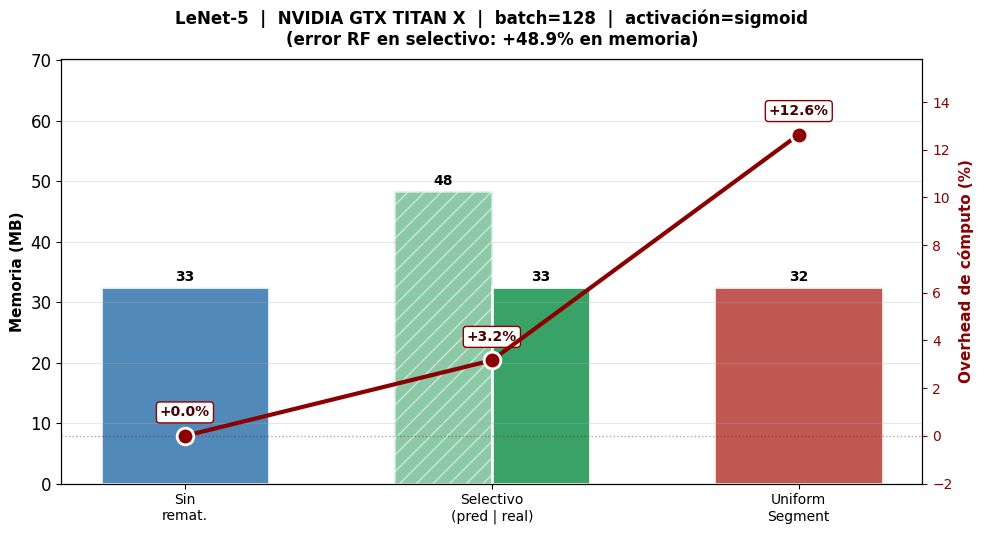

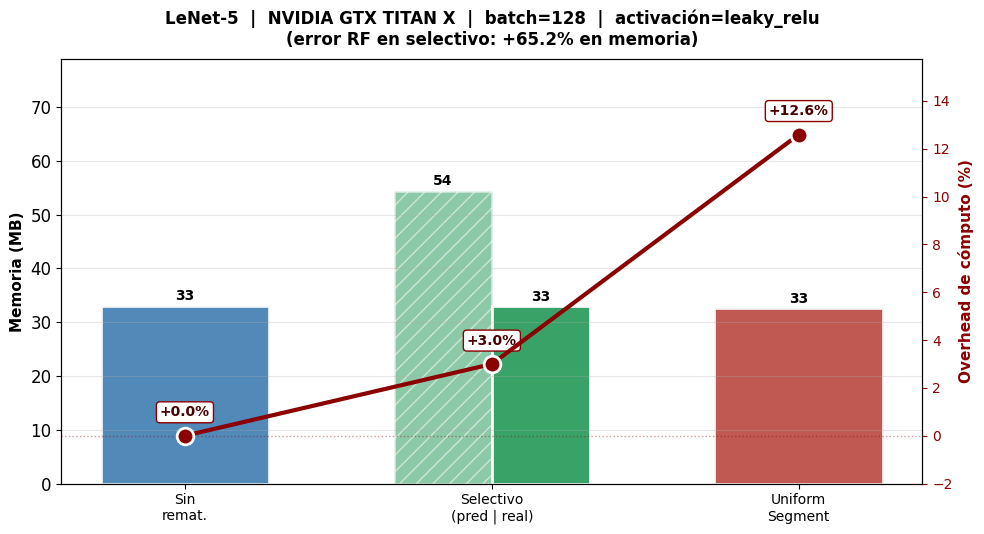


  AlexNet  |  GPU: NVIDIA GTX TITAN X


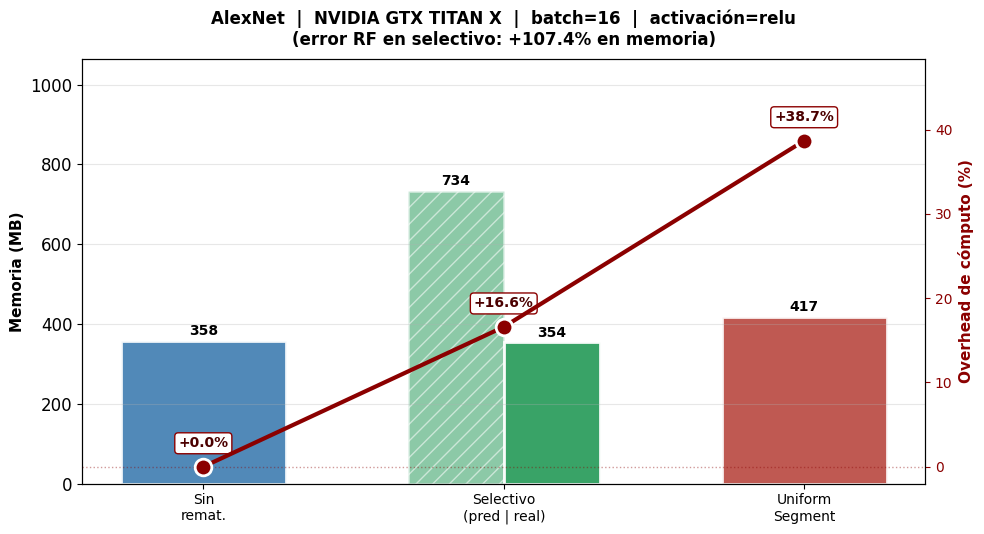

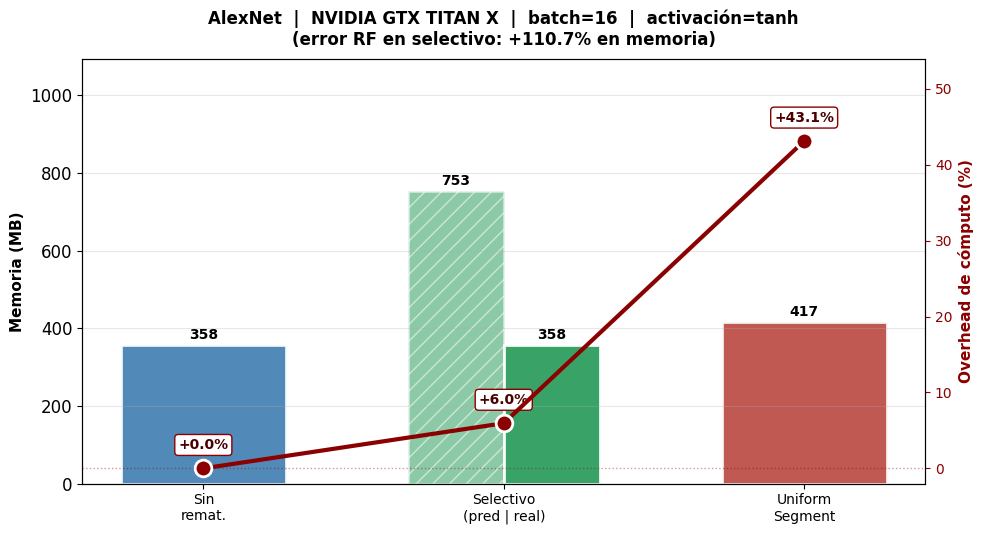

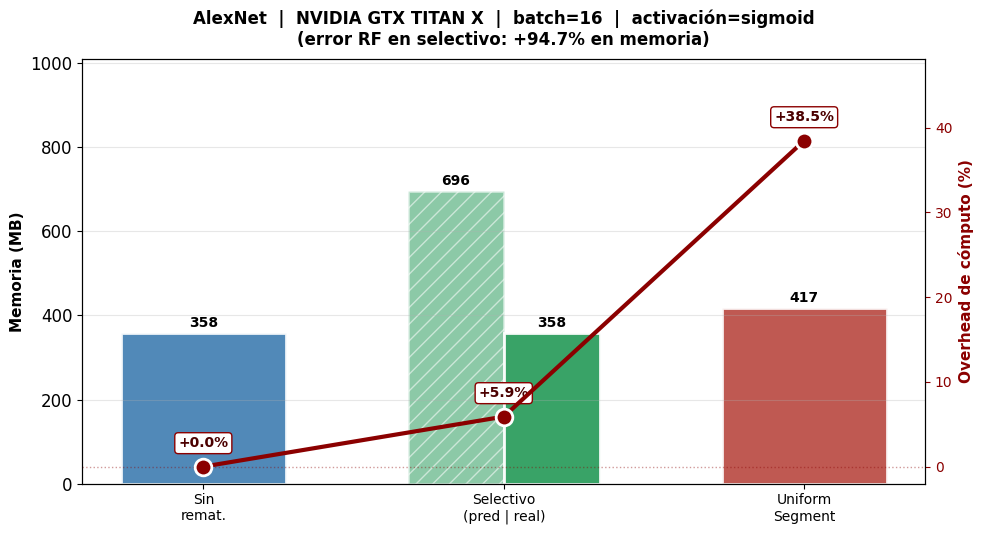

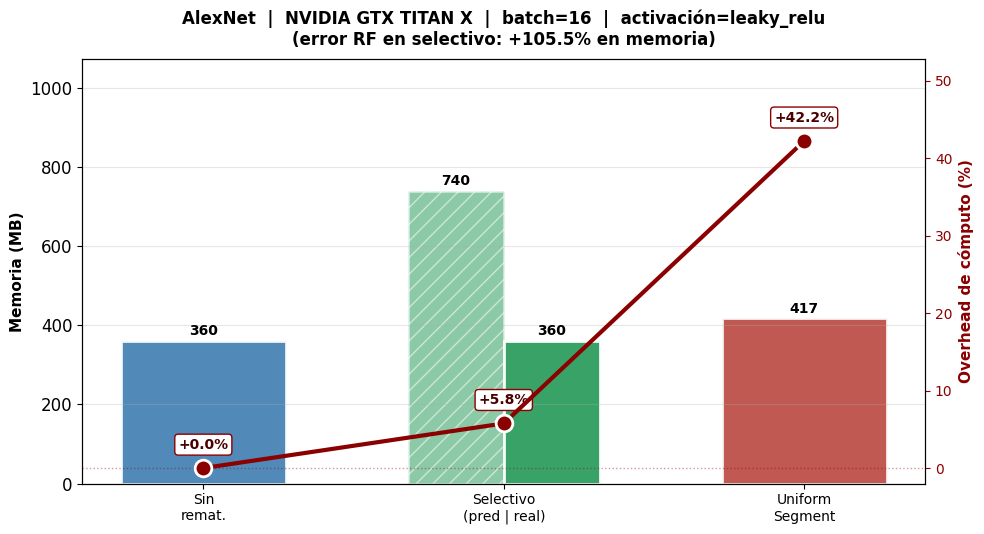

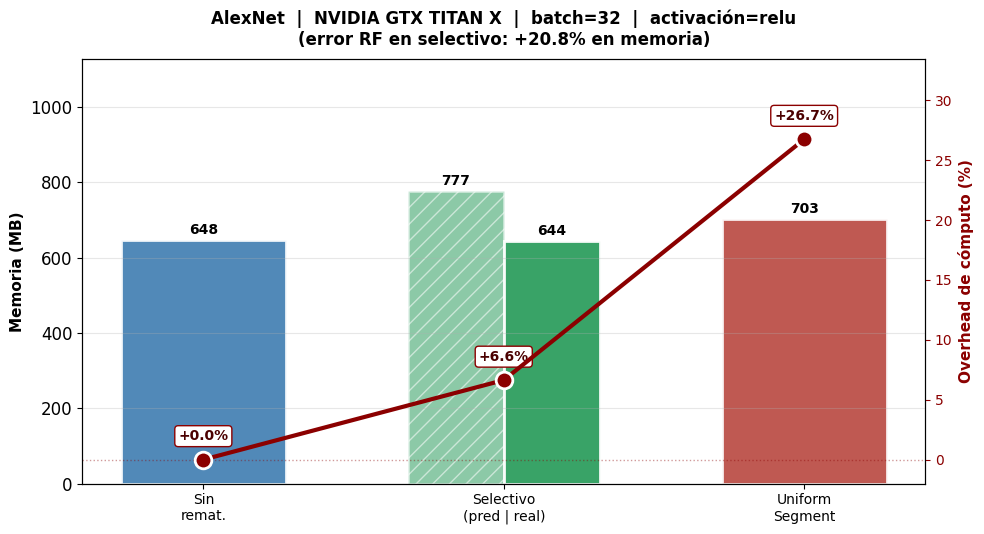

...

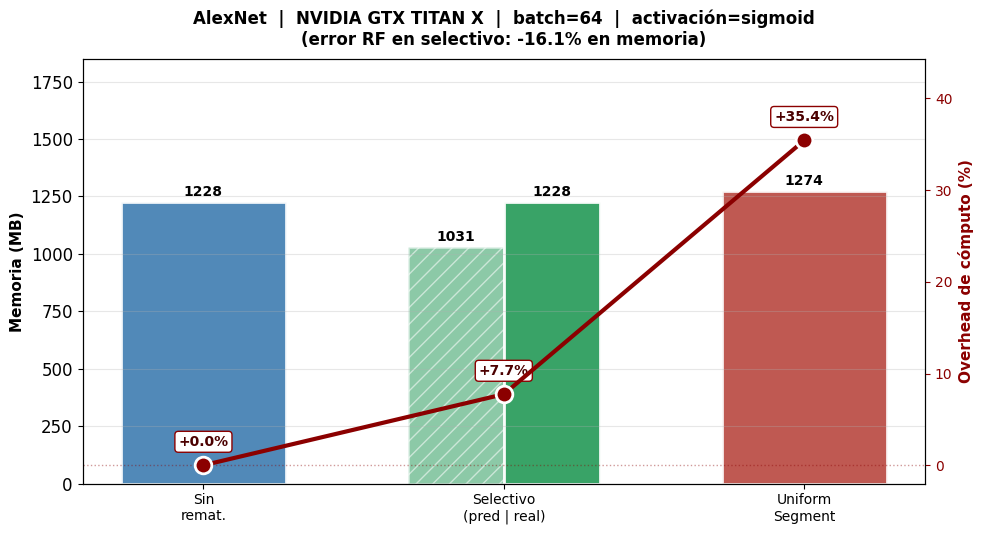

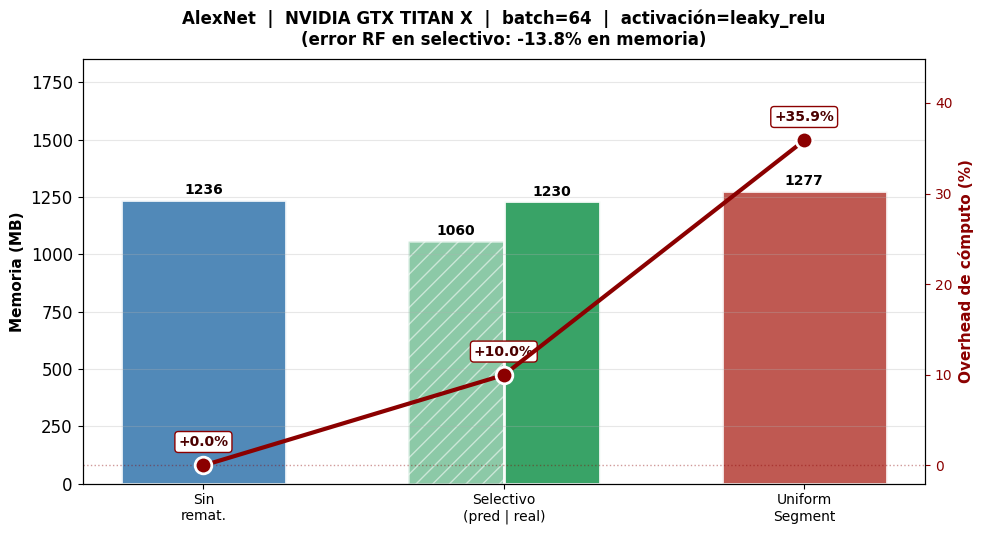

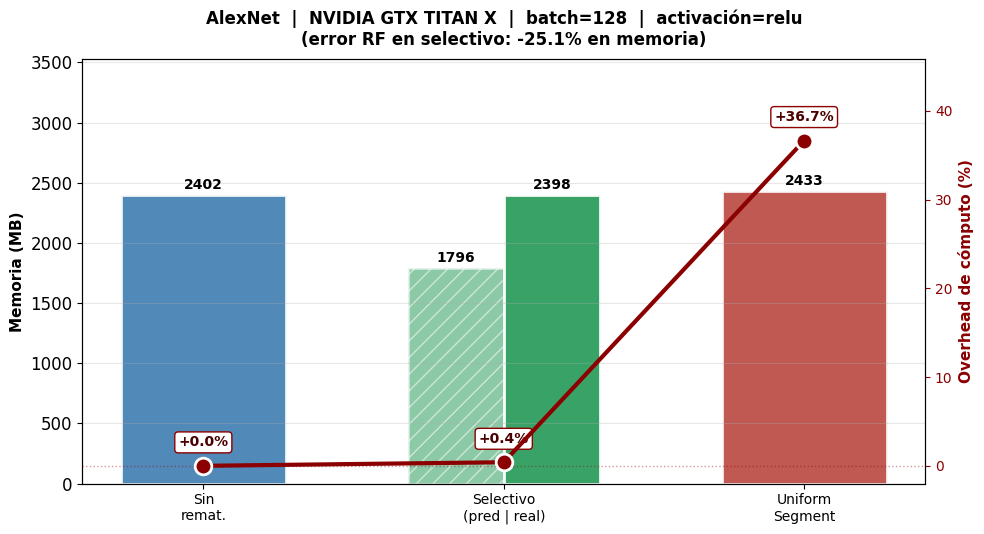

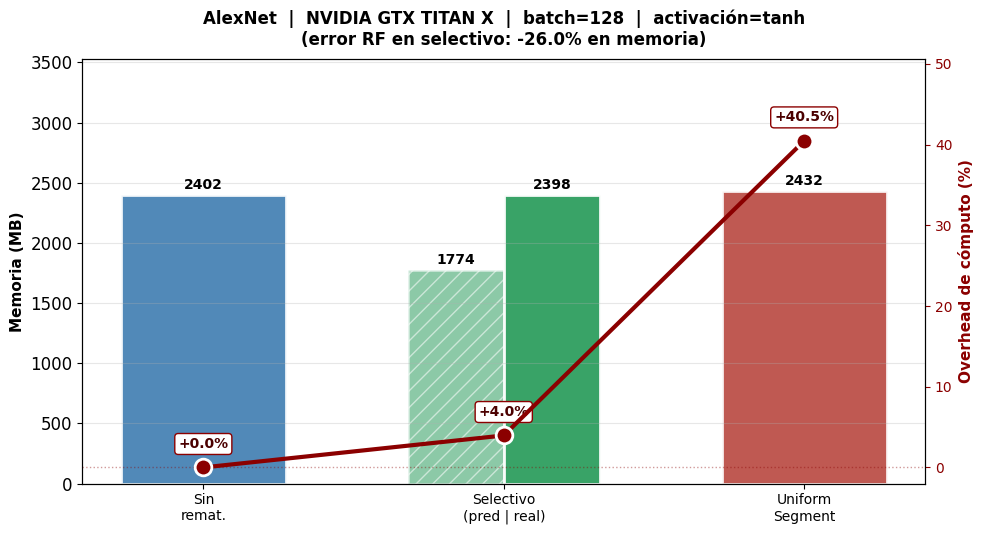

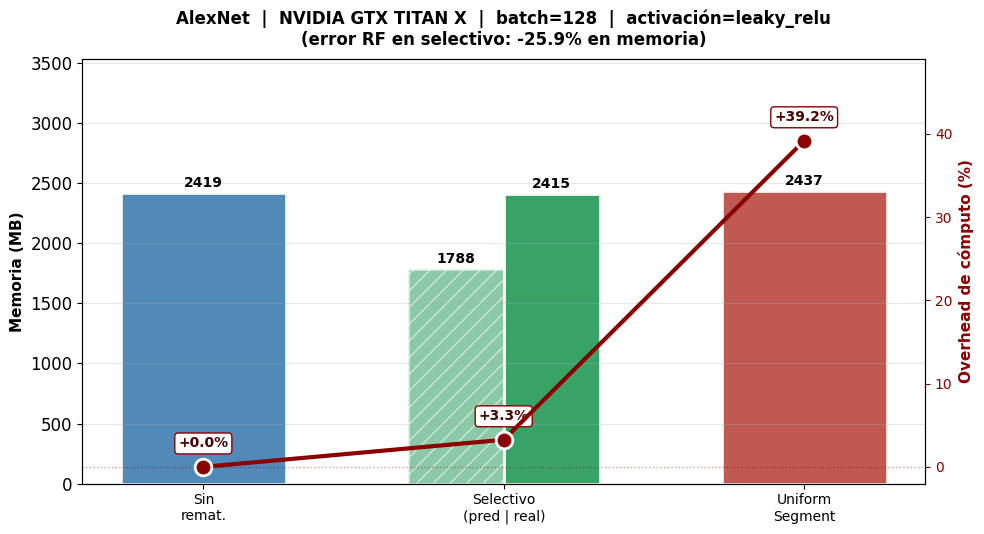


  VGG-16  |  GPU: NVIDIA GTX TITAN X


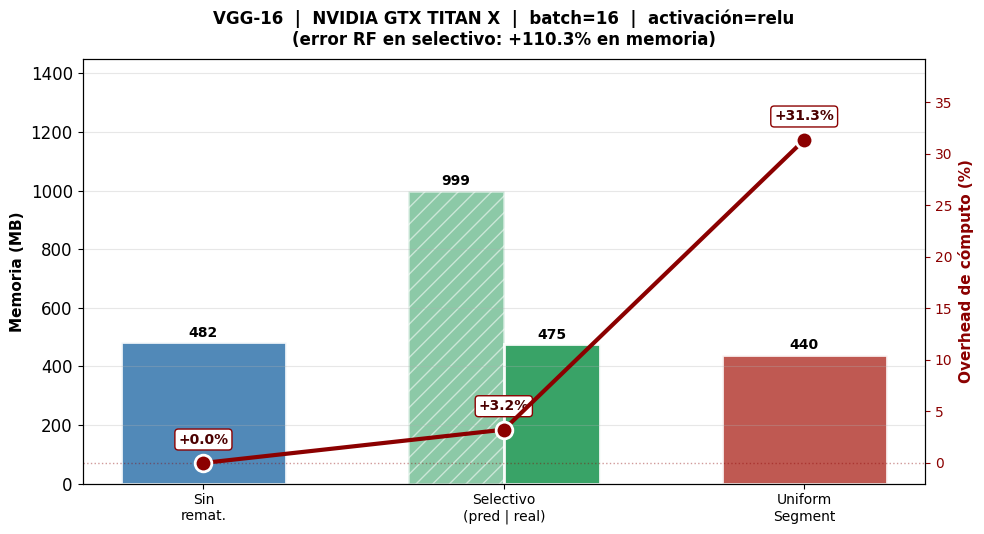

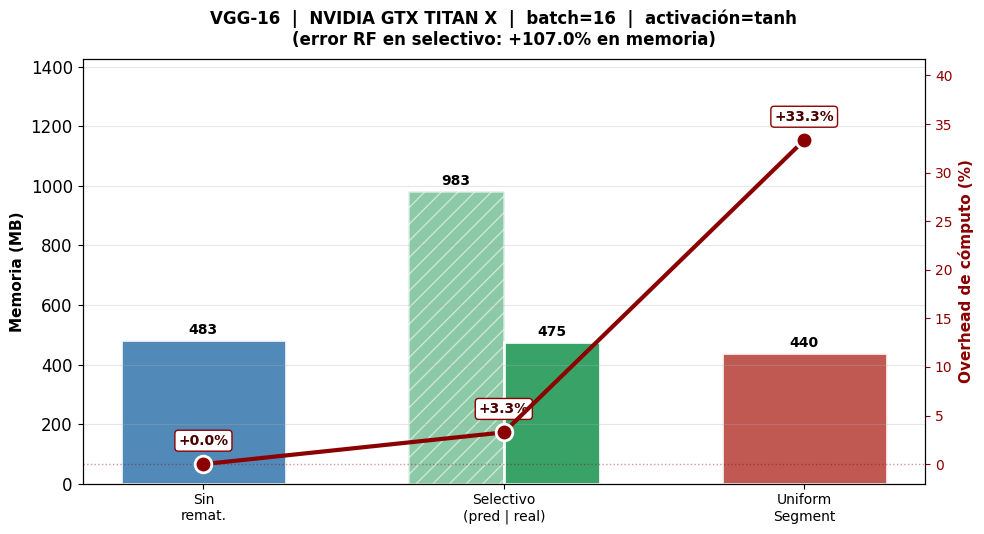

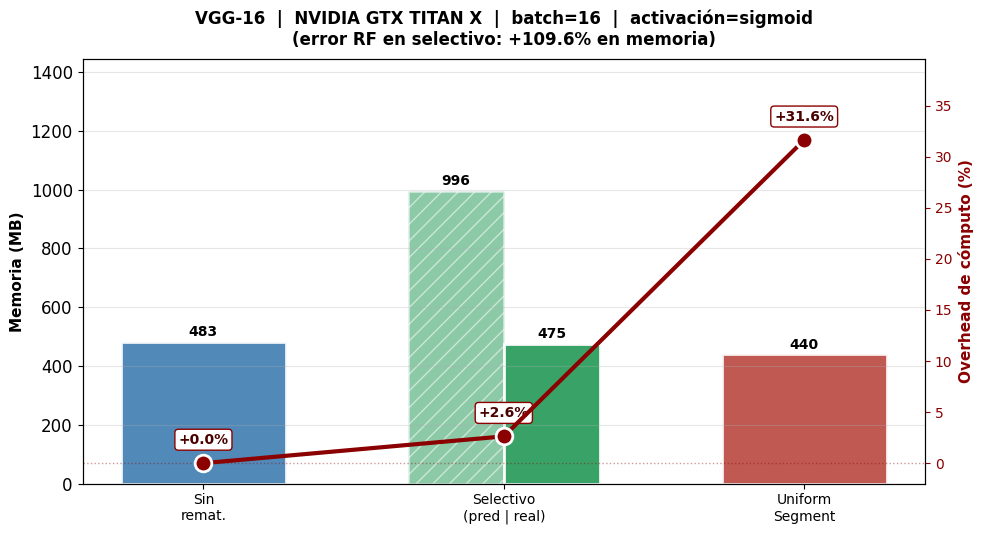

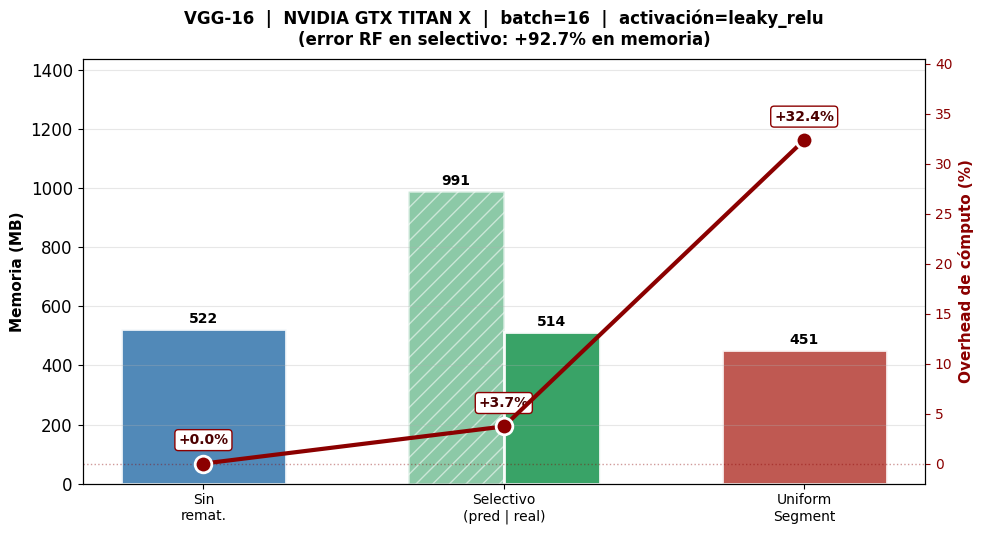

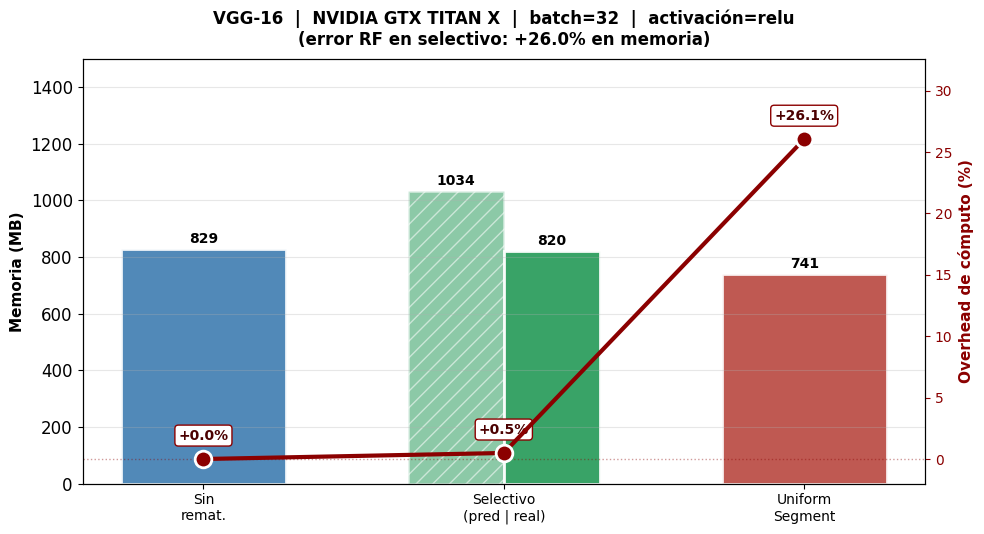

...

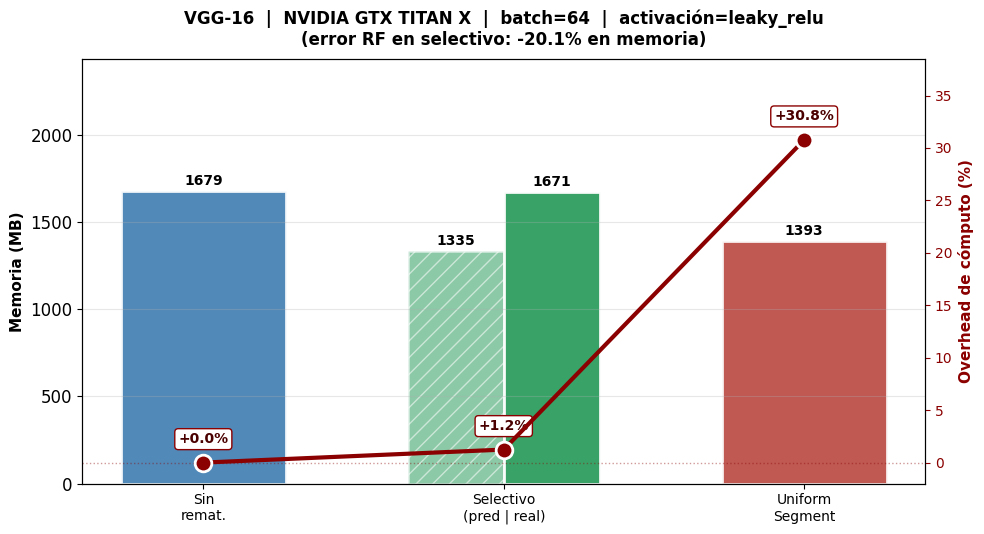

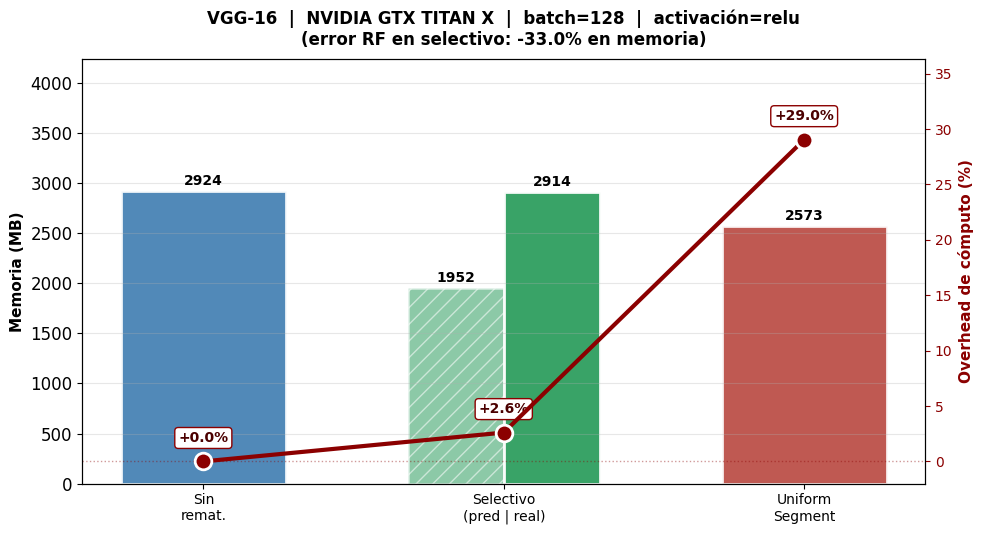

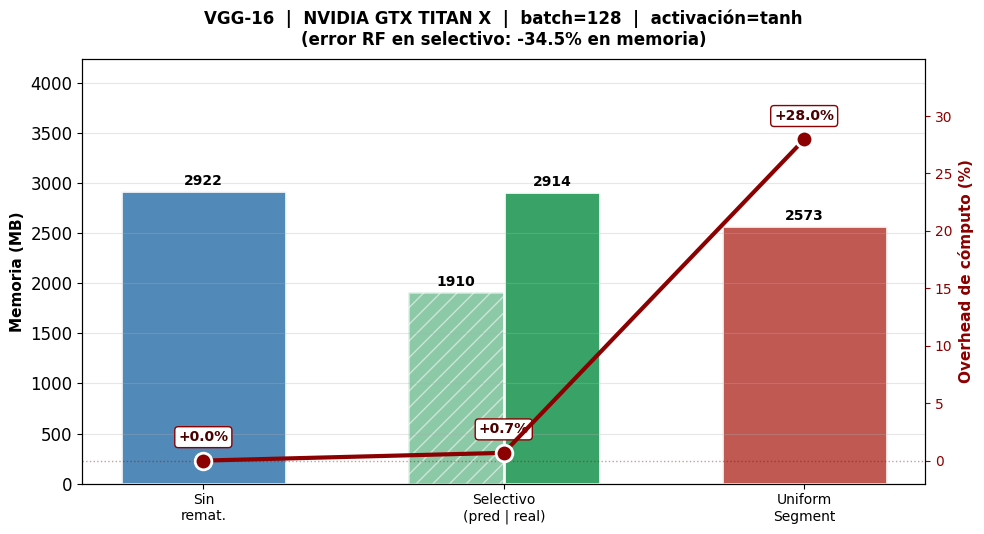

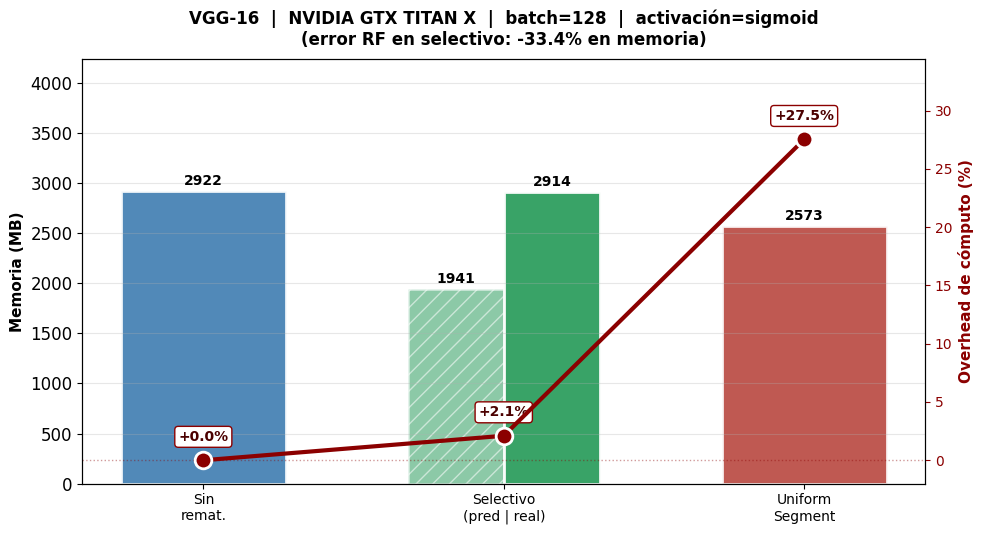

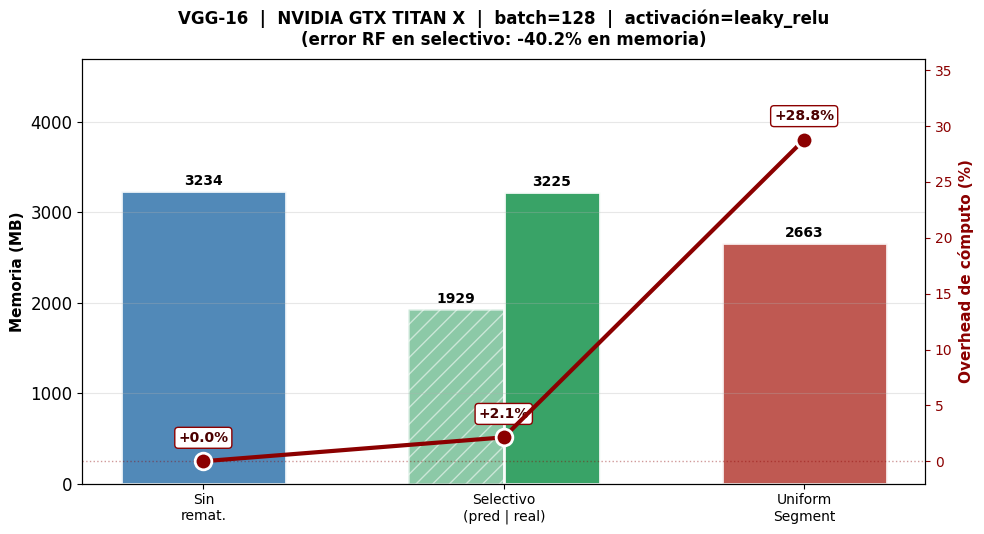

In [23]:
# ================================================================
# GRÁFICA INDIVIDUAL por modelo CNN × batch × activación (GPU NVIDIA)
# ================================================================
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

GPU_OBJETIVO = 'NVIDIA'
GPU_COL_MAP = {
    'NVIDIA': 'gpu_name_NVIDIA GeForce GTX TITAN X',
    'AMD':    'gpu_name_AMD Instinct MI210'
}
GPU_NOMBRE = {
    'NVIDIA': 'NVIDIA GTX TITAN X',
    'AMD':    'AMD Instinct MI210'
}
gpu_col_local = GPU_COL_MAP[GPU_OBJETIVO]

# Colores (mismos que la gráfica resumen)
COLOR_SIN  = '#3E7CB1'
COLOR_SEL  = '#2E9E5F'
COLOR_UNI  = '#B8473F'
LINE_COLOR = '#8B0000'

def plot_individual(arch, batch, activ, gpu_col, gpu_label):
    """Dibuja la gráfica de un solo escenario CNN para una GPU dada."""
    sub_esc = df_analysis_cnn[
        (df_analysis_cnn['modelo']      == arch) &
        (df_analysis_cnn[gpu_col]       == 1) &
        (df_analysis_cnn['batch_size']  == batch) &
        (df_analysis_cnn[f'activation_{activ}'] == 1)
    ]
    if len(sub_esc) == 0:
        return False

    sin = sub_esc[sub_esc['strategy'] == 'sin_rematerializacion']
    if len(sin) == 0:
        return False
    sin_mem  = float(sin.iloc[0]['memory_avg_MB'])
    sin_time = float(sin.iloc[0]['total_time_ms'])

    sel = sub_esc[sub_esc['strategy'] == 'checkpoint_selectivo']
    if len(sel) == 0:
        return False
    X_sel = sel[FEATURE_COLS].values
    y_sel = rf_final.predict(X_sel)
    sel = sel.copy()
    sel['mem_pred']  = y_sel[:, 0]
    sel['time_pred'] = y_sel[:, 1]
    candidatas = sel[sel['mem_pred'] <= LIMITE_MEMORIA_MB]
    if len(candidatas) == 0:
        return False
    idx_opt = candidatas['time_pred'].idxmin()
    sel_mem_pred  = float(sel.loc[idx_opt, 'mem_pred'])
    sel_mem_real  = float(sel.loc[idx_opt, 'memory_avg_MB'])
    sel_time_real = float(sel.loc[idx_opt, 'total_time_ms'])

    u = sub_esc[sub_esc['strategy'].isin(['uniform_seg2','uniform_seg3'])]
    if len(u) == 0:
        return False
    u_mem  = float(u['memory_avg_MB'].mean())
    u_time = float(u['total_time_ms'].mean())

    # Overhead % respecto a sin_remat (positivo = más lento que baseline)
    overhead_sin = 0.0
    overhead_sel = (sel_time_real - sin_time) / sin_time * 100 if sin_time > 0 else 0.0
    overhead_uni = (u_time - sin_time) / sin_time * 100 if sin_time > 0 else 0.0

    # ---- gráfica ----
    fig, ax1 = plt.subplots(figsize=(10, 5.5))
    W_N, W_W = 0.32, 0.55
    x_sin, x_p, x_r, x_uni = 0.0, 1.0 - W_N/2, 1.0 + W_N/2, 2.0

    ax1.bar(x_sin, sin_mem, W_W, color=COLOR_SIN, alpha=0.9,
            edgecolor='white', linewidth=2)
    ax1.bar(x_p, sel_mem_pred, W_N, color=COLOR_SEL, alpha=0.55,
            edgecolor='white', linewidth=2, hatch='//')
    ax1.bar(x_r, sel_mem_real, W_N, color=COLOR_SEL, alpha=0.95,
            edgecolor='white', linewidth=2)
    ax1.bar(x_uni, u_mem, W_W, color=COLOR_UNI, alpha=0.9,
            edgecolor='white', linewidth=2)

    all_m = [sin_mem, sel_mem_pred, sel_mem_real, u_mem]
    max_m = max(all_m)
    for xi, m in zip([x_sin, x_p, x_r, x_uni], all_m):
        ax1.text(xi, m + max_m*0.02, f'{m:.0f}',
                 ha='center', fontsize=10, fontweight='bold')

    ax1.set_ylabel('Memoria (MB)', fontsize=11, fontweight='bold')
    ax1.set_xticks([0, 1, 2])
    ax1.set_xticklabels(['Sin\nremat.', 'Selectivo\n(pred | real)', 'Uniform\nSegment'],
                        fontsize=10)
    ax1.set_ylim(0, max_m * 1.45)
    ax1.grid(True, alpha=0.3, axis='y')

    # overhead %
    ax2 = ax1.twinx()
    x_line = [x_sin, (x_p + x_r)/2, x_uni]
    overhead_line = [overhead_sin, overhead_sel, overhead_uni]
    ax2.plot(x_line, overhead_line, 'o-',
             color=LINE_COLOR, linewidth=3, markersize=12,
             markerfacecolor=LINE_COLOR, markeredgecolor='white',
             markeredgewidth=2, zorder=5)
    ax2.set_ylabel('Overhead de cómputo (%)', fontsize=11, fontweight='bold', color=LINE_COLOR)
    y_max = max(overhead_line) * 1.25 if max(overhead_line) > 0 else 5.0
    y_min = min(overhead_line) * 1.25 if min(overhead_line) < 0 else -2.0
    ax2.set_ylim(y_min, max(y_max, 5.0))
    ax2.axhline(0.0, color=LINE_COLOR, linestyle=':', linewidth=1, alpha=0.4)
    ax2.tick_params(axis='y', labelsize=10, colors=LINE_COLOR)

    for xi, val in zip(x_line, overhead_line):
        ax2.annotate(f'{val:+.1f}%', xy=(xi, val),
                     xytext=(0, 14), textcoords='offset points',
                     ha='center', fontsize=10, fontweight='bold', color='#4B0000',
                     bbox=dict(boxstyle='round,pad=0.25', facecolor='white',
                               edgecolor=LINE_COLOR, linewidth=1))

    err_mem_sel = 100 * (sel_mem_pred - sel_mem_real) / sel_mem_real

    plt.title(f'{arch}  |  {gpu_label}  |  '
              f'batch={batch}  |  activación={activ}\n'
              f'(error RF en selectivo: {err_mem_sel:+.1f}% en memoria)',
              fontsize=12, fontweight='bold', pad=10)
    plt.tight_layout()
    plt.show()
    return True


# ================================================================
# Recorrer cada modelo CNN × todos sus batches y activaciones (NVIDIA)
# ================================================================
for arch in ['LeNet-5', 'AlexNet', 'VGG-16']:
    print('\n' + '='*70)
    print(f'  {arch}  |  GPU: {GPU_NOMBRE[GPU_OBJETIVO]}')
    print('='*70)

    sub_arch = df_analysis_cnn[
        (df_analysis_cnn['modelo']      == arch) &
        (df_analysis_cnn[gpu_col_local] == 1)
    ]
    batches = sorted(sub_arch['batch_size'].unique())

    for batch in batches:
        sub_b = sub_arch[sub_arch['batch_size'] == batch]
        activs_presentes = []
        for activ in ['relu', 'tanh', 'sigmoid', 'leaky_relu']:
            if (sub_b[f'activation_{activ}'] == 1).any():
                activs_presentes.append(activ)
        for activ in activs_presentes:
            plot_individual(arch, batch, activ, gpu_col_local, GPU_NOMBRE[GPU_OBJETIVO])


**Análisis e interpretación por gráfica (GPU NVIDIA GTX TITAN X).** A continuación se interpreta cada conjunto de gráficas agrupado por (modelo, batch). Dentro de cada grupo las cuatro activaciones (`relu`, `tanh`, `sigmoid`, `leaky_relu`) producen patrones cuantitativamente muy similares, así que la lectura es común a las cuatro activaciones del bloque.

#### LeNet-5

- **LeNet-5 · batch=16 (gráficas 1–4).** La memoria real es prácticamente idéntica entre las tres estrategias (~18 MB) y el RF *sobreestima* el selectivo en ~53–61 %. El overhead del selectivo del RF se queda en ~5 %, mientras que Uniform Segment cobra ~7 %. Como el consumo absoluto es tan pequeño, ninguna ganancia de memoria compensa el coste extra.
- **LeNet-5 · batch=32 (gráficas 5–8).** Mismo patrón: las barras de memoria quedan en ~20 MB para las tres estrategias, error del RF entre ~37–50 %, y los overheads del selectivo/uniform son del orden de ~4–5 %. Rematerializar no es justificable a este tamaño.
- **LeNet-5 · batch=64 (gráficas 9–12).** Memoria 24 MB en las tres estrategias, error RF en torno a 33–41 %. El overhead sube ligeramente (~6–7 % en selectivo y uniform). El balance sigue siendo negativo: gastar cómputo extra por un ahorro de memoria que ni siquiera existe en valor absoluto.
- **LeNet-5 · batch=128 (gráficas 13–16).** Aún con batch grande la memoria absoluta sigue siendo de 32–33 MB; el RF predice 50 MB (error de 49–70 %). El selectivo conserva un overhead bajo (~3 %), pero Uniform Segment dispara su overhead hasta ~12–13 %. Conclusión común para LeNet-5: la rematerialización es una pérdida neta y la recomendación es no activarla.

#### AlexNet

- **AlexNet · batch=16 (gráficas 17–20).** Memoria del baseline ~358 MB. El RF *sobreestima fuertemente* el selectivo (error ~+95–111 %): predice ~700+ MB pero la memoria real del selectivo queda en ~354 MB (casi idéntica al baseline). Uniform Segment llega a ~417 MB con un overhead de ~38–39 %. La recomendación práctica es no usar rematerialización; el RF aún no es preciso en este régimen.
- **AlexNet · batch=32 (gráficas 21–24).** Memorias muy cercanas (sin ~648, selectivo ~644, uniform ~703 MB). El error del RF baja a ~15–24 % y el overhead del selectivo se sitúa en ~6–7 %, mientras Uniform Segment se queda en ~25–27 %. El selectivo es un compromiso aceptable si se quiere algo de ahorro a un costo bajo.
- **AlexNet · batch=64 (gráficas 25–28).** Sin remat ~1.227 MB, selectivo real ~1.223 MB (el RF empieza a *subestimar*, error −13 a −16 %). Uniform Segment sube a ~1.274 MB con overhead de ~30–32 %. El selectivo prácticamente empata al baseline en memoria pero con ~5 % de overhead.
- **AlexNet · batch=128 (gráficas 29–31).** Memorias rondan los 2.400 MB en sin y selectivo; uniform ~2.433 MB con overhead ~36–37 %. El RF subestima el selectivo en ~−25 %. La estrategia más eficaz es no rematerializar, ya que ninguna alternativa libera memoria significativa y el overhead es alto.

#### VGG-16

- **VGG-16 · batch=16 (gráficas 32–35).** Baseline 482 MB. El RF sigue sobreestimando con fuerza el selectivo (+93–110 %), pero la memoria real del selectivo queda en 475 MB, casi igual al baseline. Uniform Segment libera memoria visible (~440 MB) a costa de un overhead de ~29–31 %. A 12 GB de VRAM la ganancia es marginal.
- **VGG-16 · batch=32 (gráficas 36–39).** Sin remat ~829 MB, selectivo real ~820 MB, uniform ~741 MB (ahorra ~11 %). El selectivo cuesta apenas ~0.5–2 % de overhead, uniform ~22–26 %. Aquí ya empieza a verse el trade-off: uniform compra memoria a un precio razonable.
- **VGG-16 · batch=64 (gráficas 40–43).** Baseline 1.522 MB, selectivo casi idéntico, uniform 1.347 MB (11 % menos memoria) con overhead 30–32 %. El RF empieza a subestimar el selectivo (~−11 a −20 %), pero la decisión práctica no cambia: uniform es atractivo cuando la presión de memoria sube.
- **VGG-16 · batch=128 (gráficas 44–47).** Es el escenario más interesante. Baseline 2.924 MB, selectivo real 2.914 MB, uniform 2.573 MB (~12 % de ahorro real). El RF subestima el selectivo en ~−33 a −40 %, pero uniform efectivamente libera cientos de MB. En una GPU de 12 GB esa diferencia puede decidir si VGG-16 cabe o falla por OOM.

**Síntesis NVIDIA.** El comportamiento del trade-off depende fuertemente del modelo: LeNet-5 nunca justifica rematerializar; AlexNet solo lo justifica de forma marginal a batches medios; VGG-16 es el caso donde uniform paga su overhead con ahorros tangibles. La precisión del RF en `memory_avg_MB` mejora claramente conforme aumenta el tamaño del problema: pasa de errores >100 % en batch=16 a errores <40 % en batches grandes.

## 8.5 GRÁFICA INDIVIDUAL: comparación de estrategias por modelo CNN, batch y activación (GPU AMD)

Mismo análisis que la sección 8.4 pero sobre la **GPU AMD Instinct MI210 (64 GB)**. La estructura visual es idéntica: barras de memoria para sin remat / selectivo (predicho RF + real) / uniform, y línea rojo oscuro para el overhead de cómputo (%) en eje secundario. El propósito es contrastar el mismo trade-off en una GPU con VRAM holgada, donde la presión de memoria es prácticamente nula.



  LeNet-5  |  GPU: AMD Instinct MI210


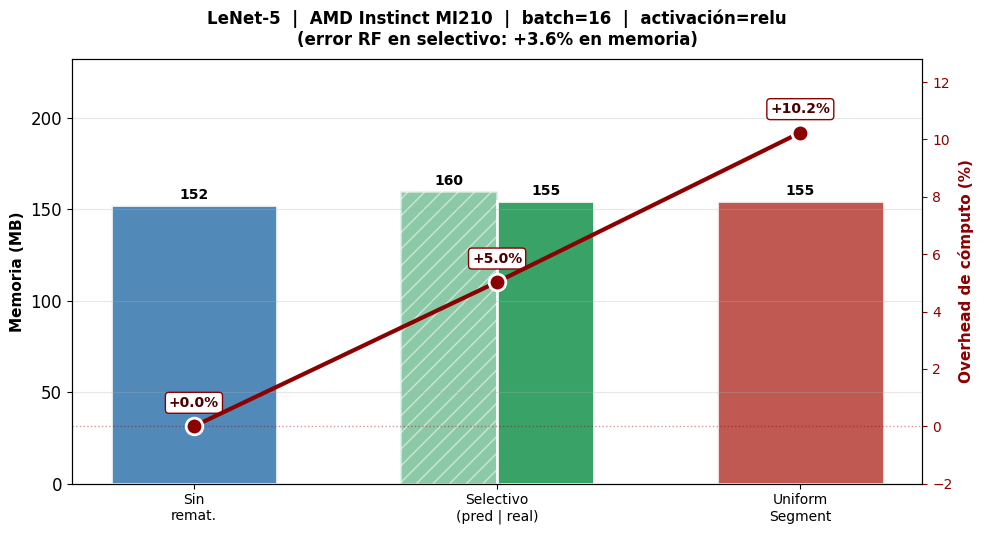

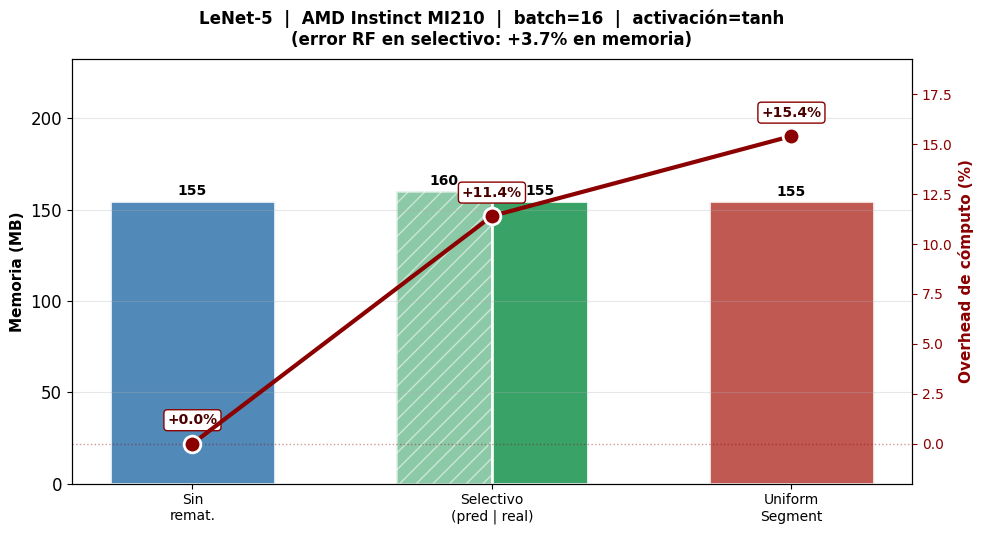

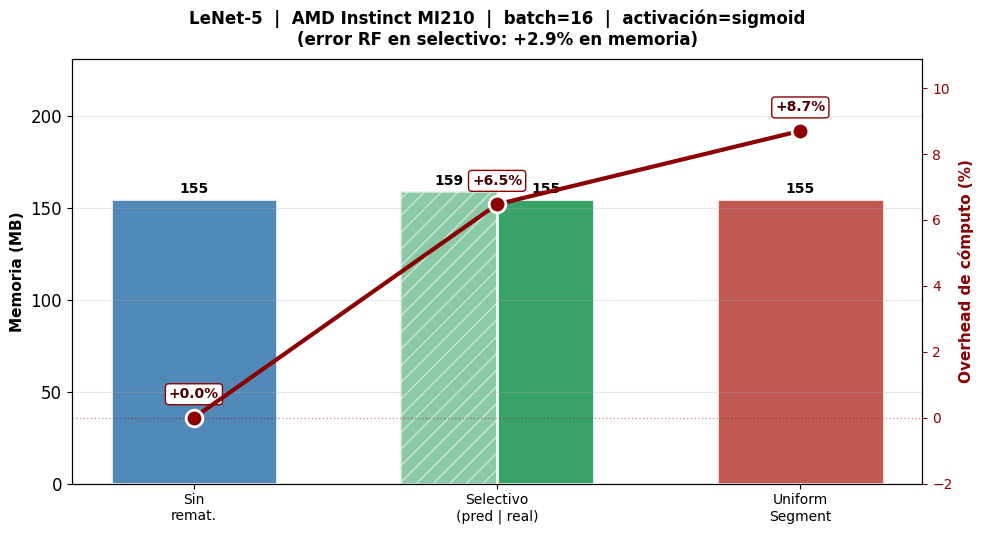

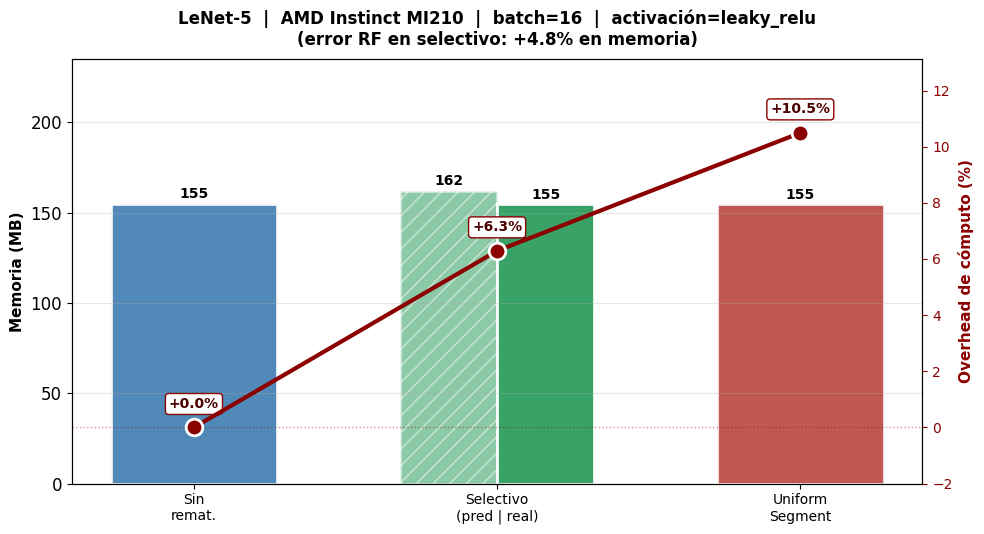

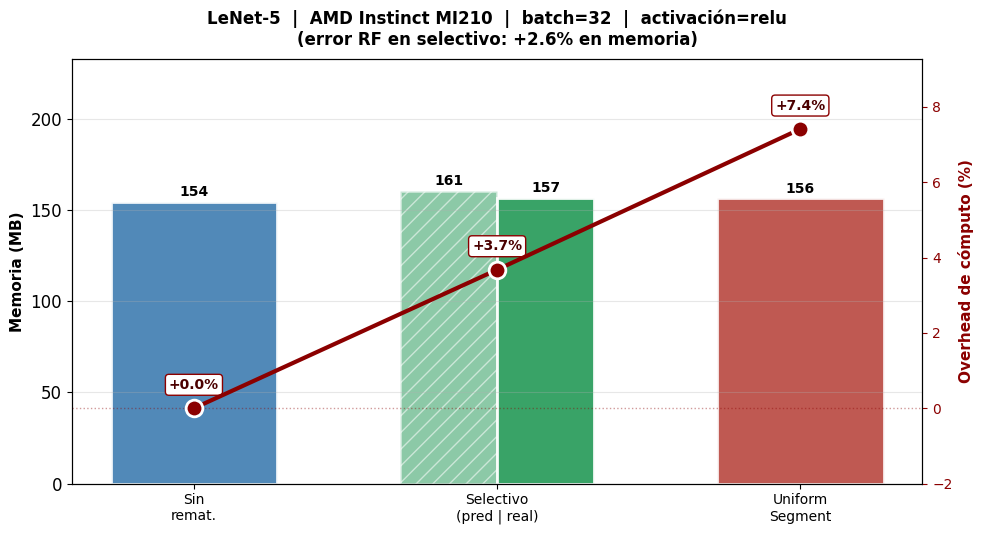

...

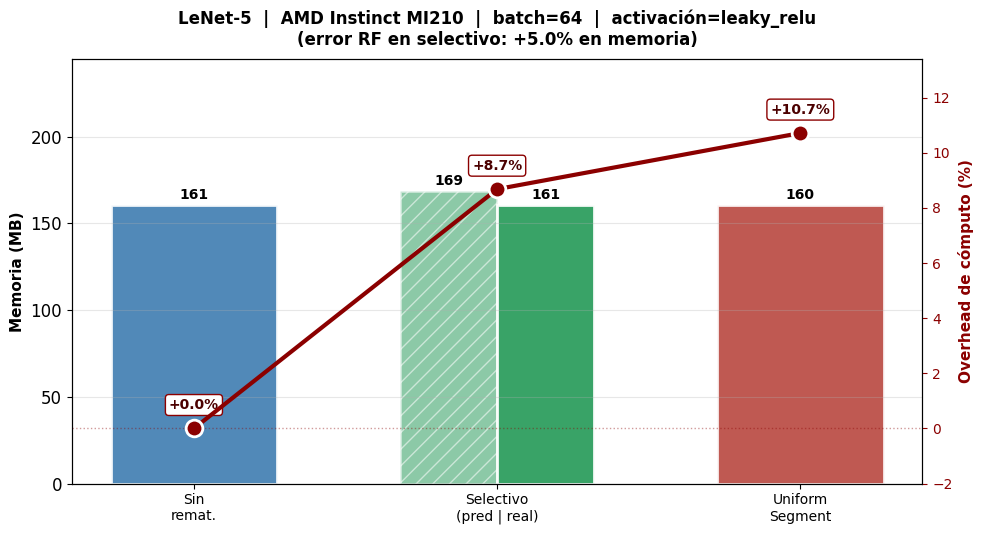

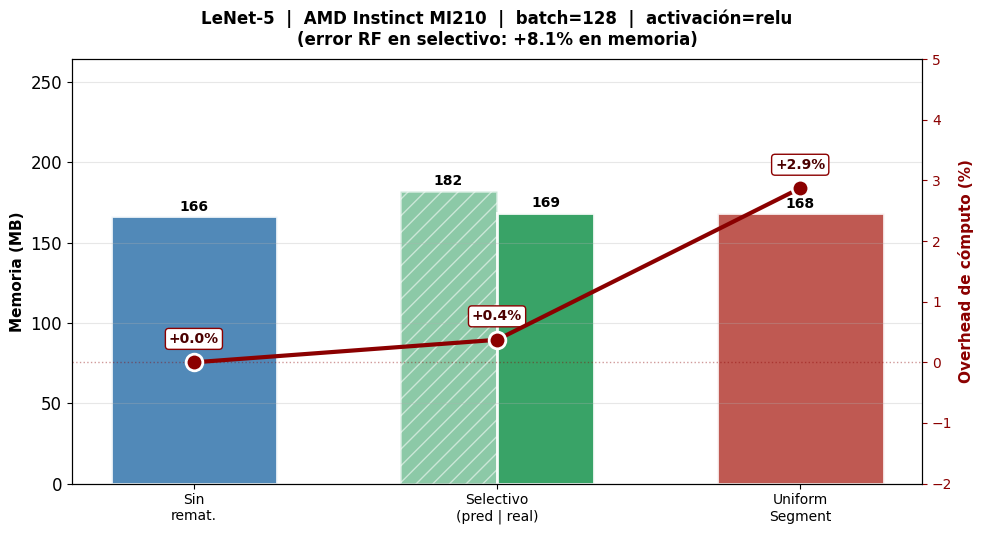

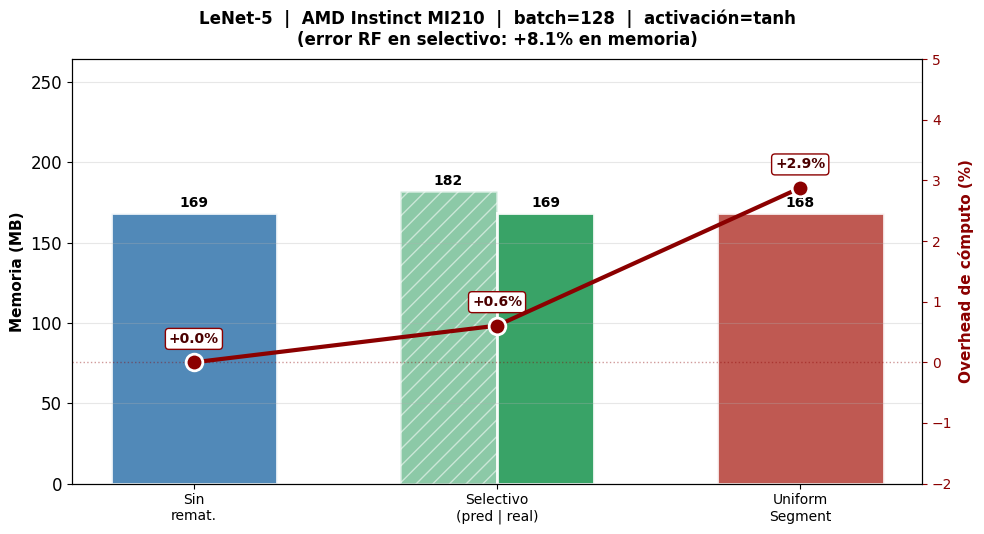

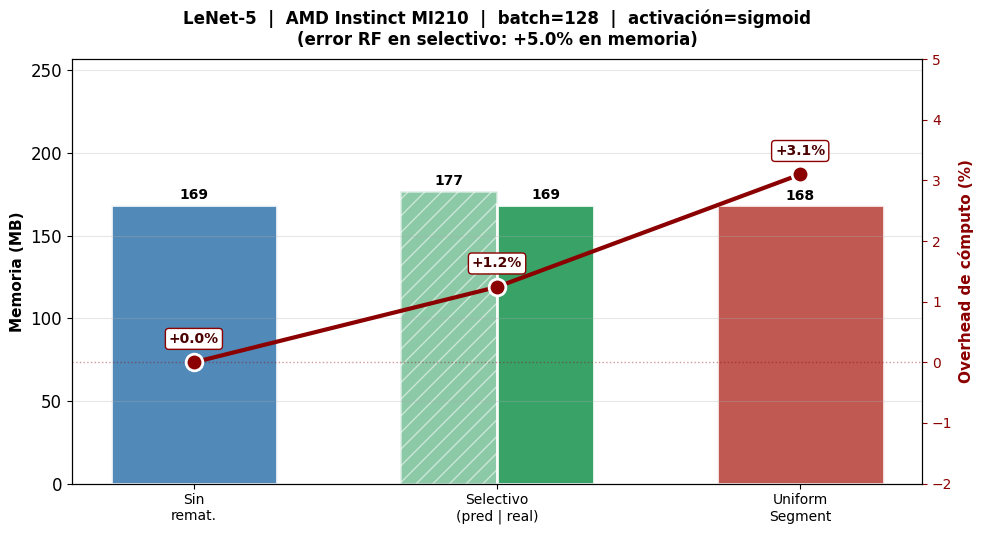

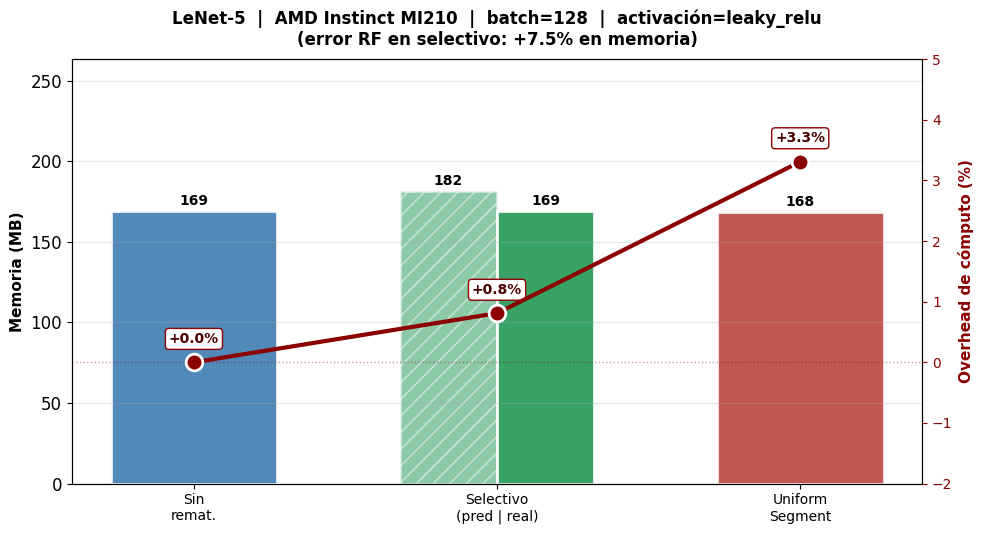


  AlexNet  |  GPU: AMD Instinct MI210


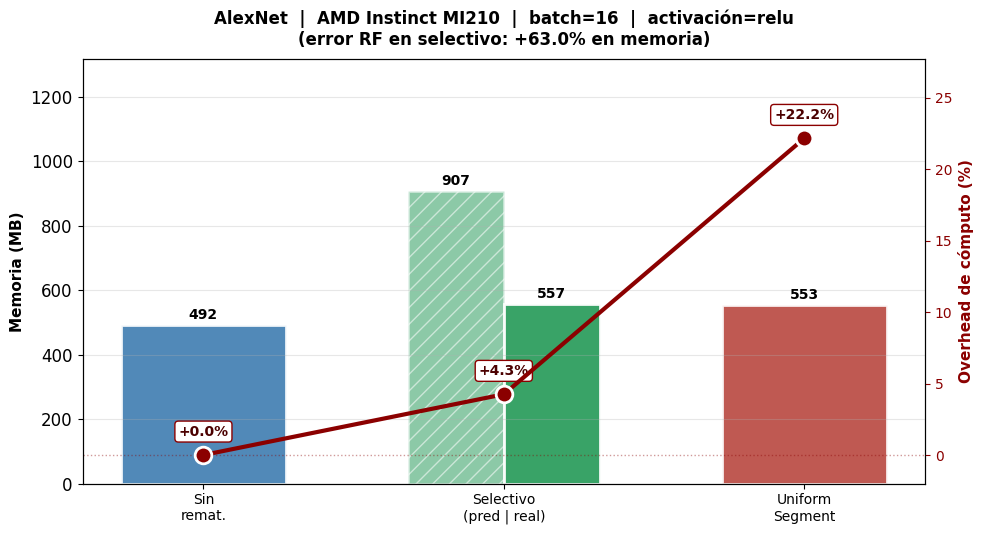

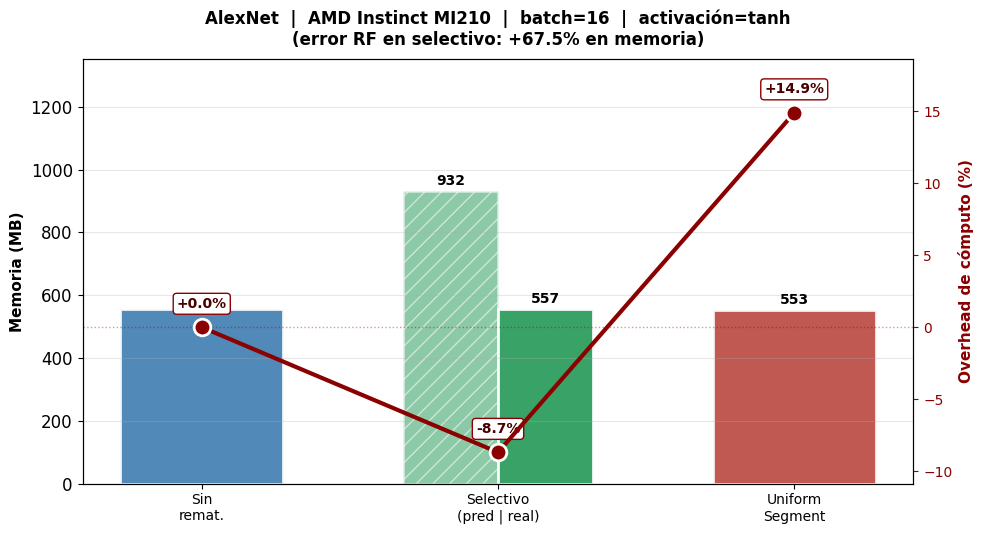

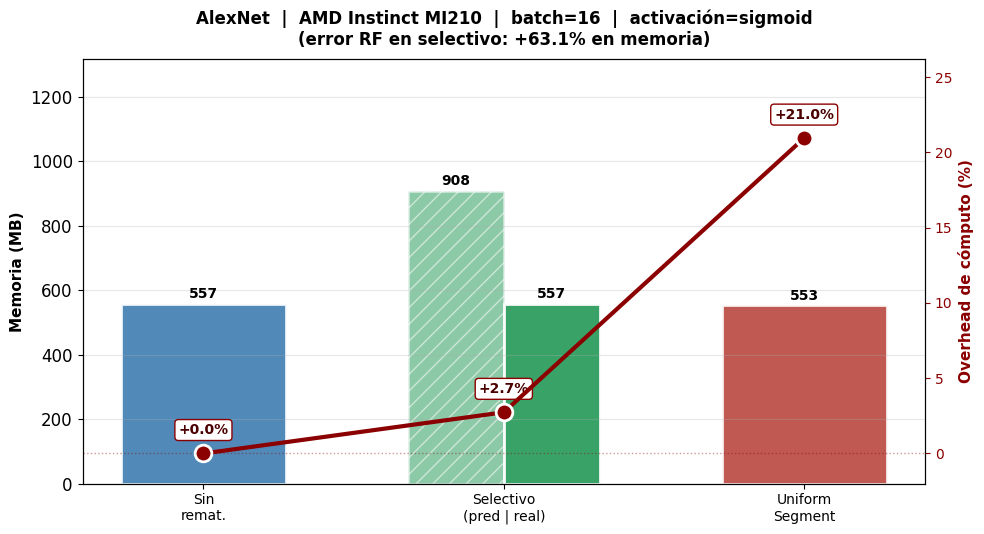

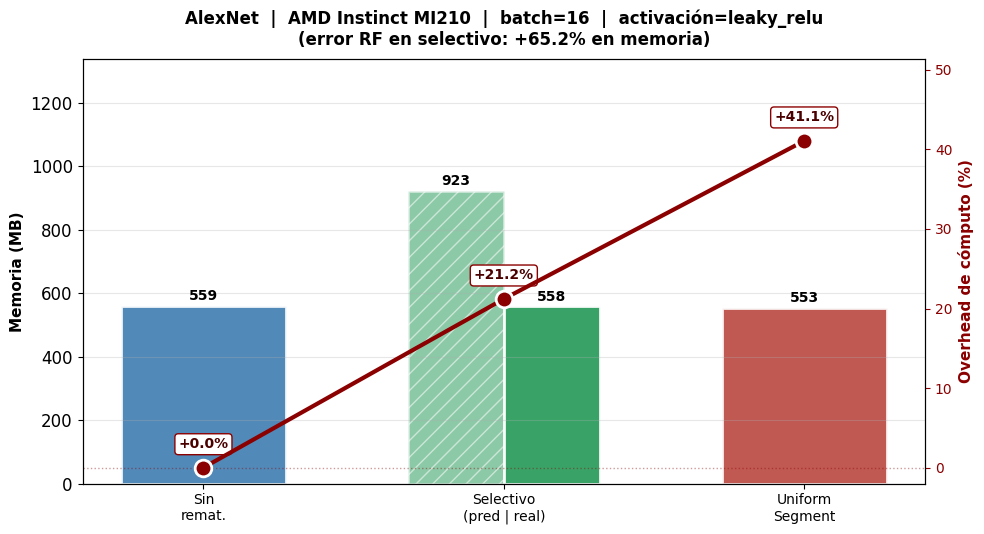

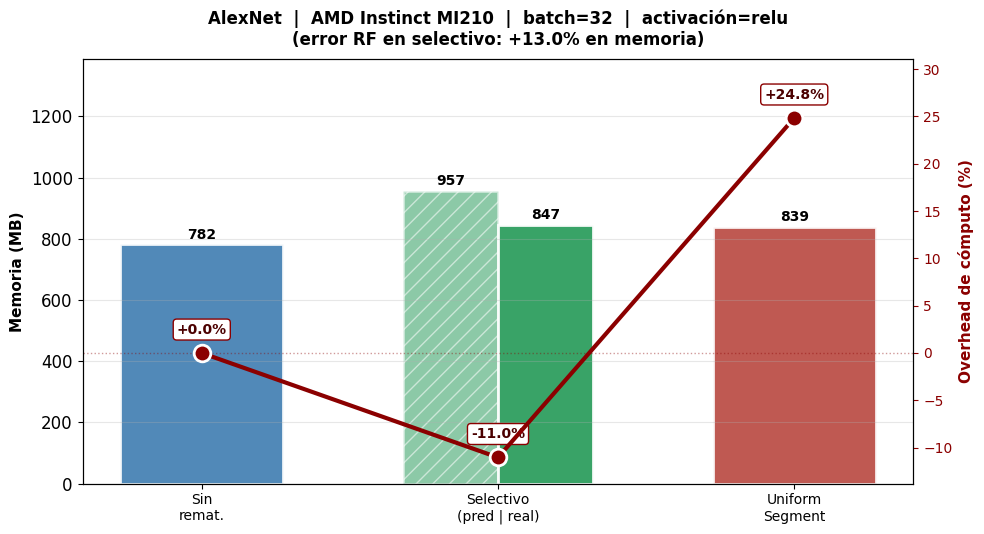

...

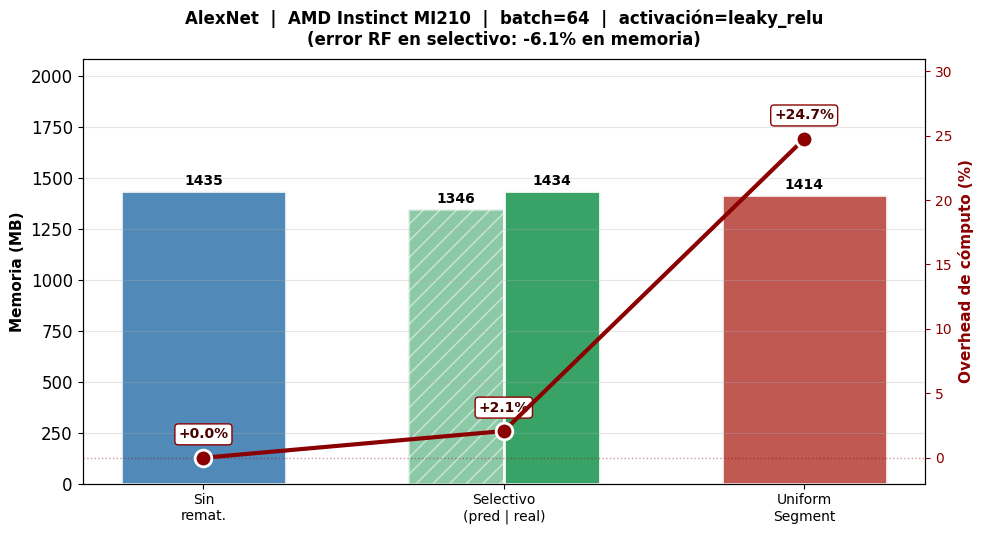

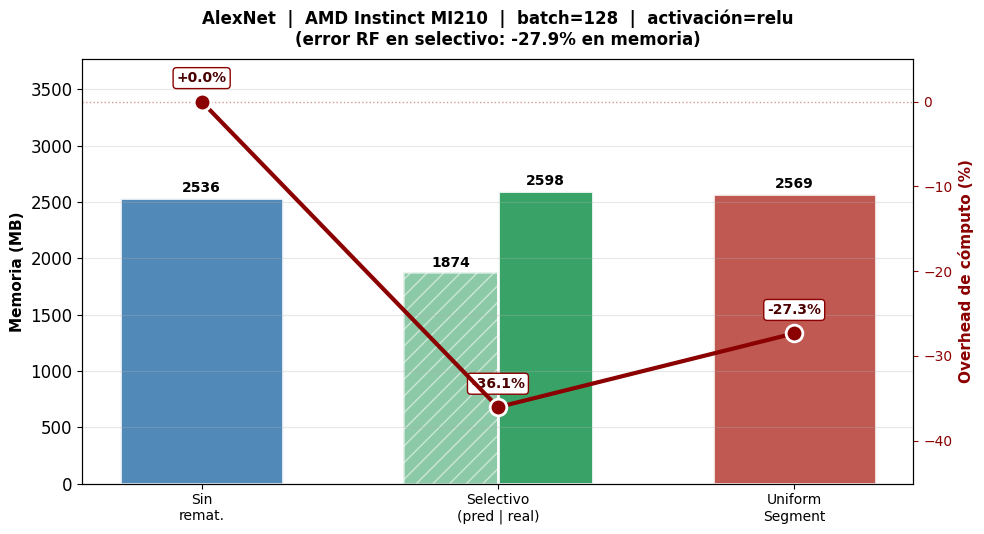

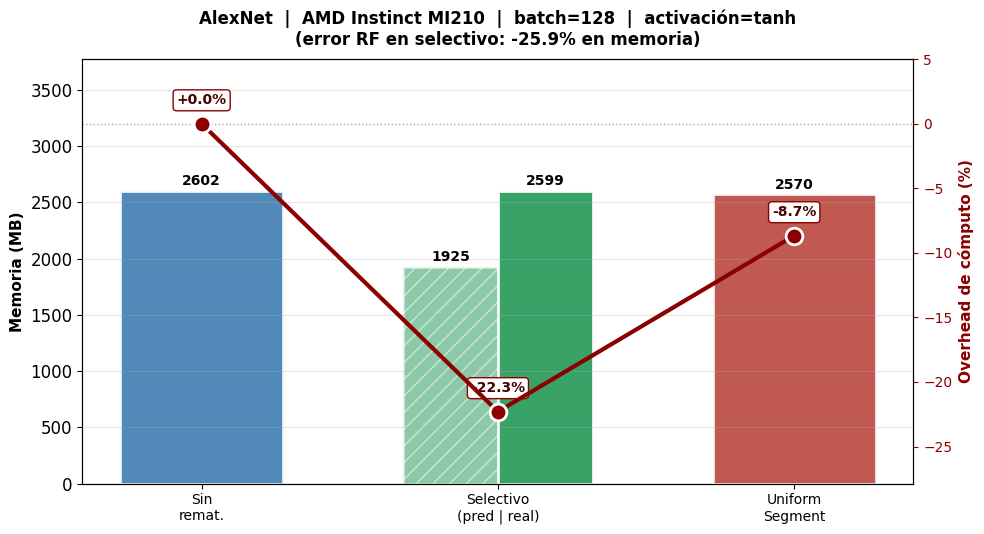

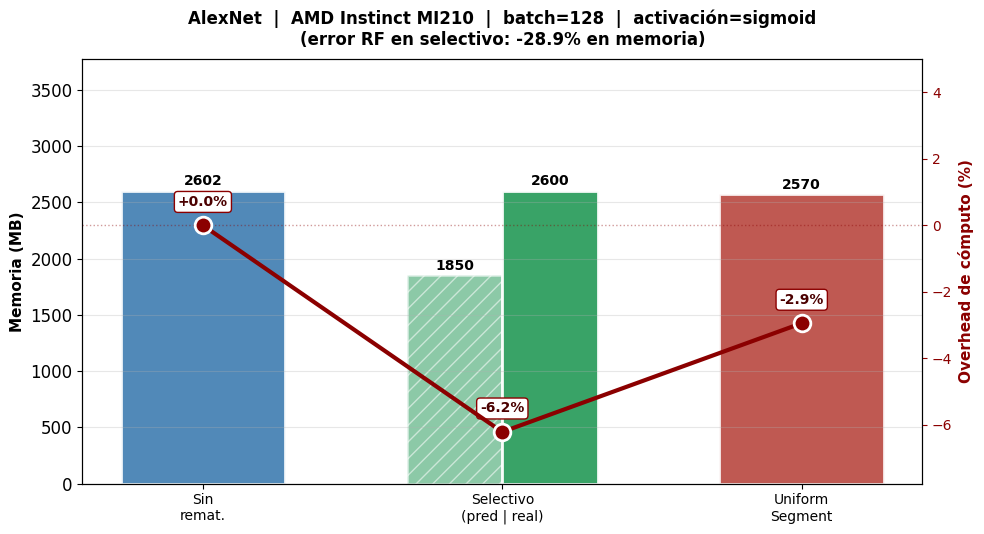

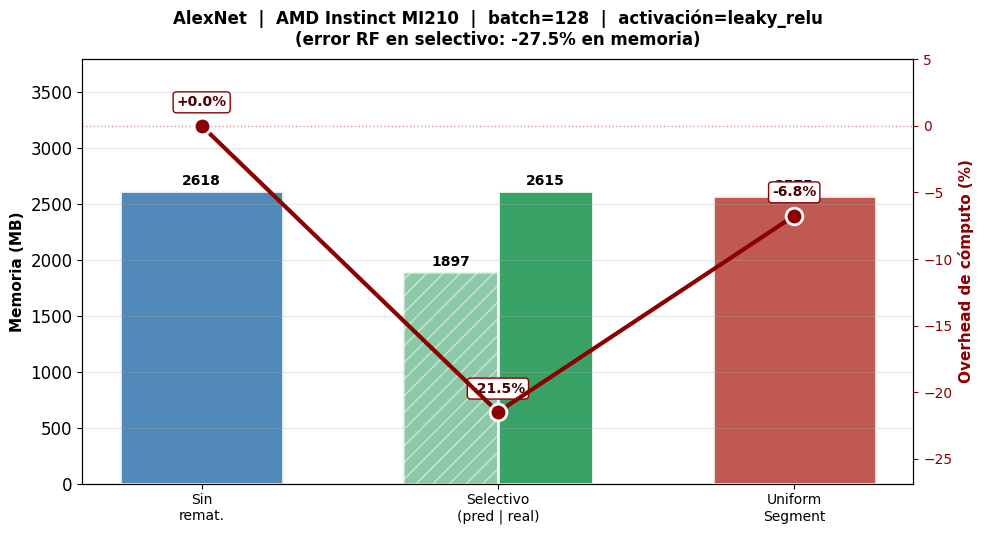


  VGG-16  |  GPU: AMD Instinct MI210


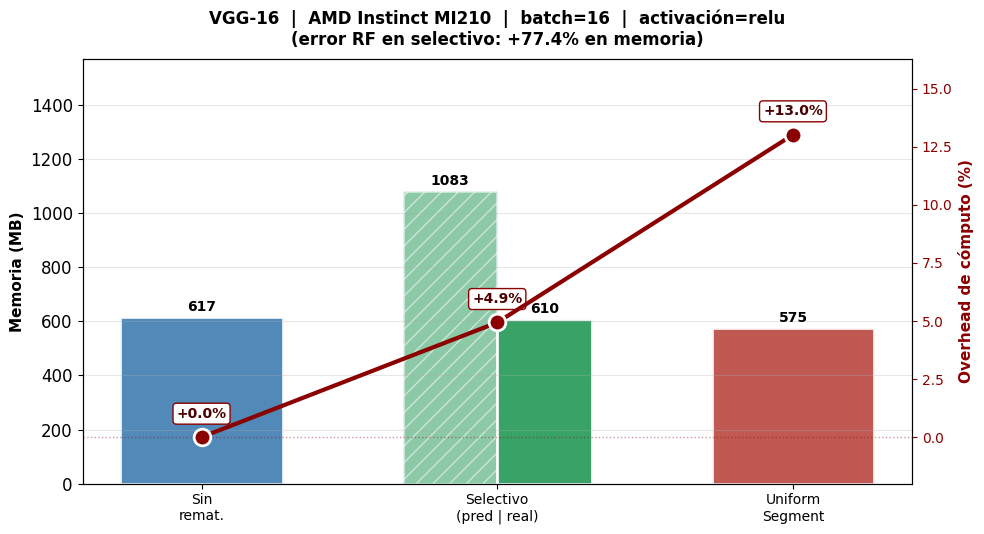

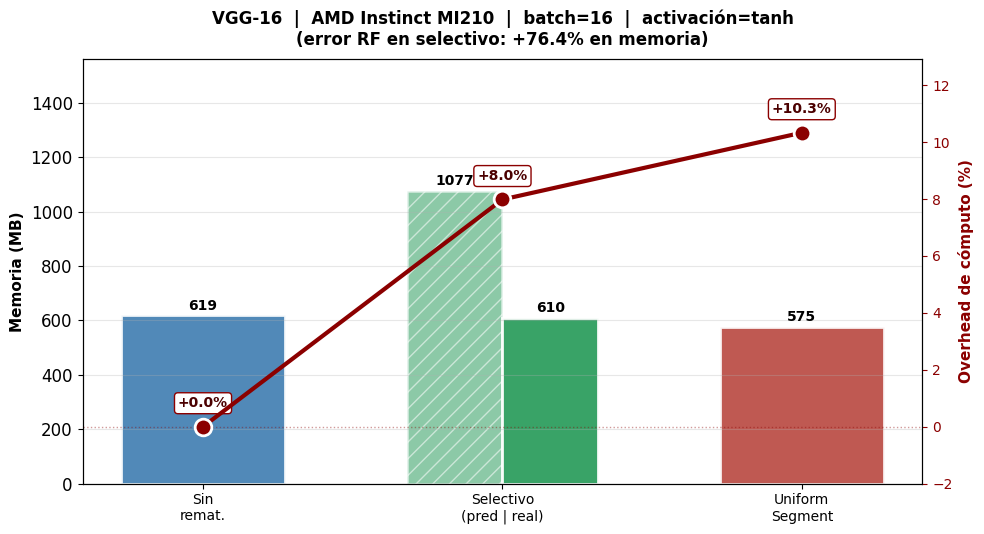

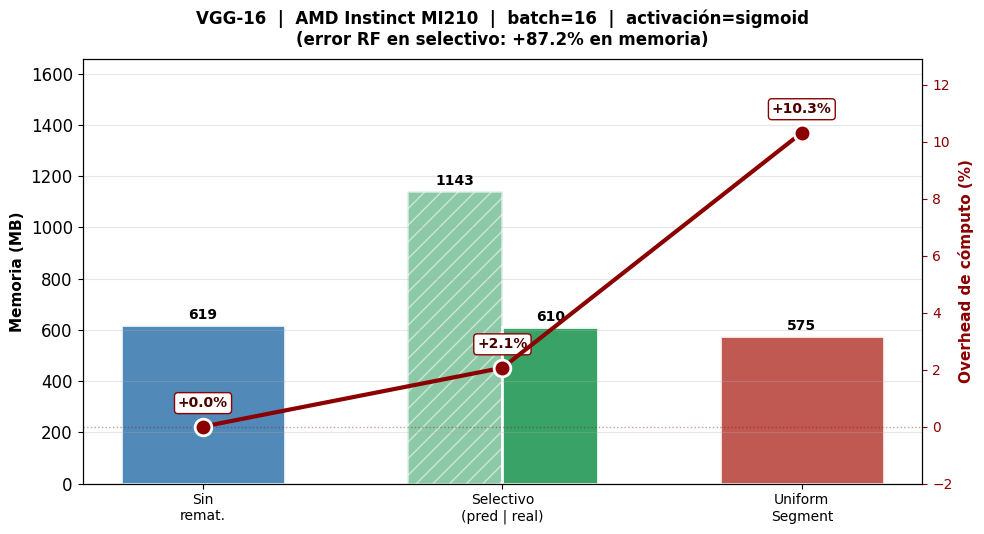

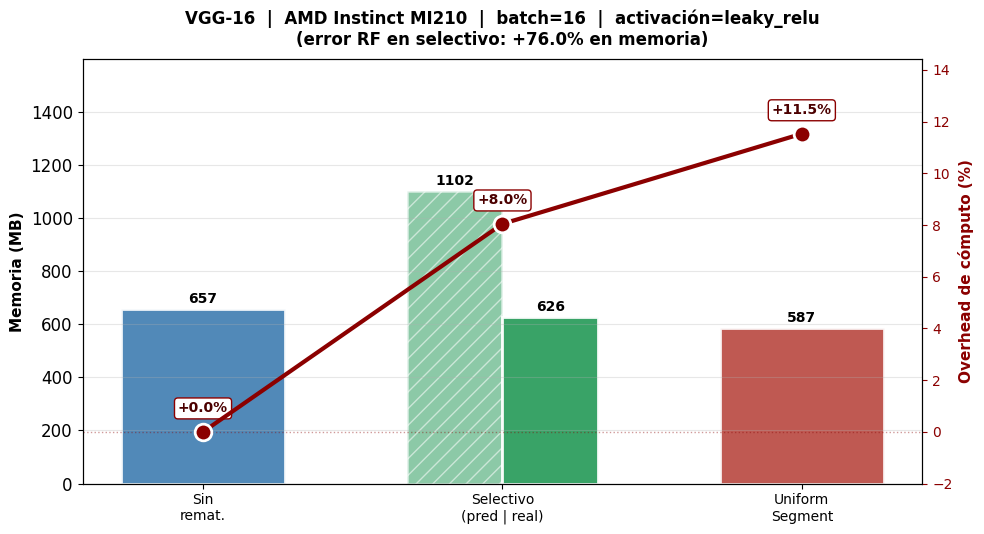

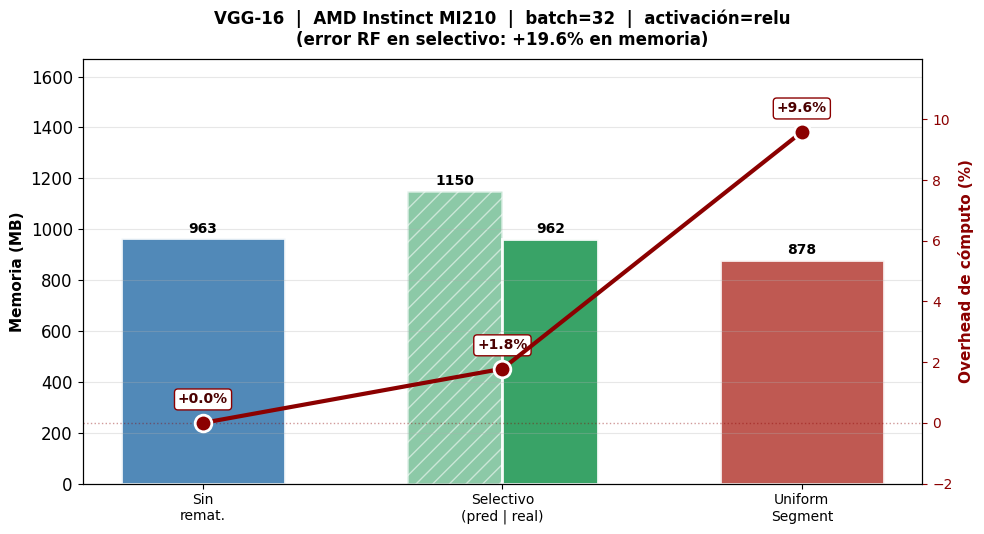

...

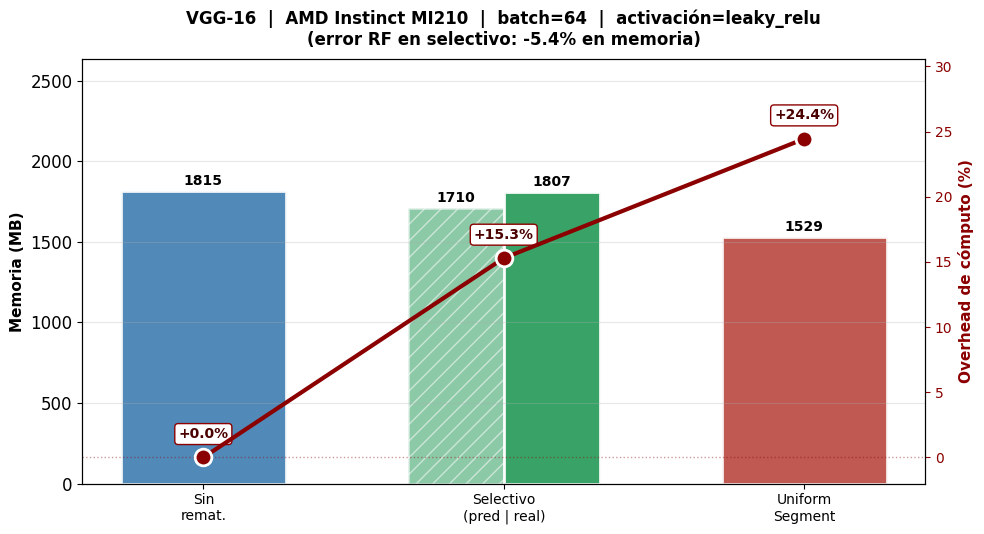

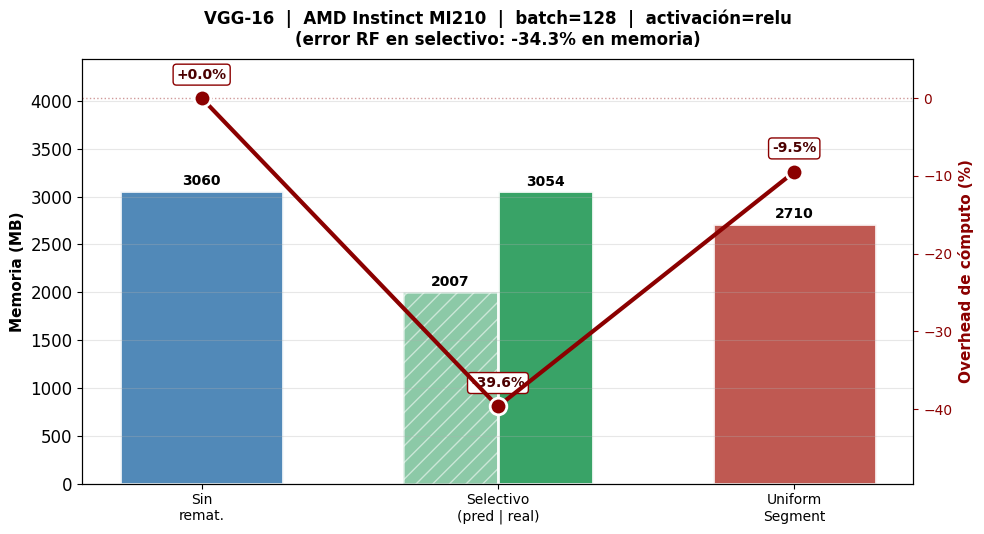

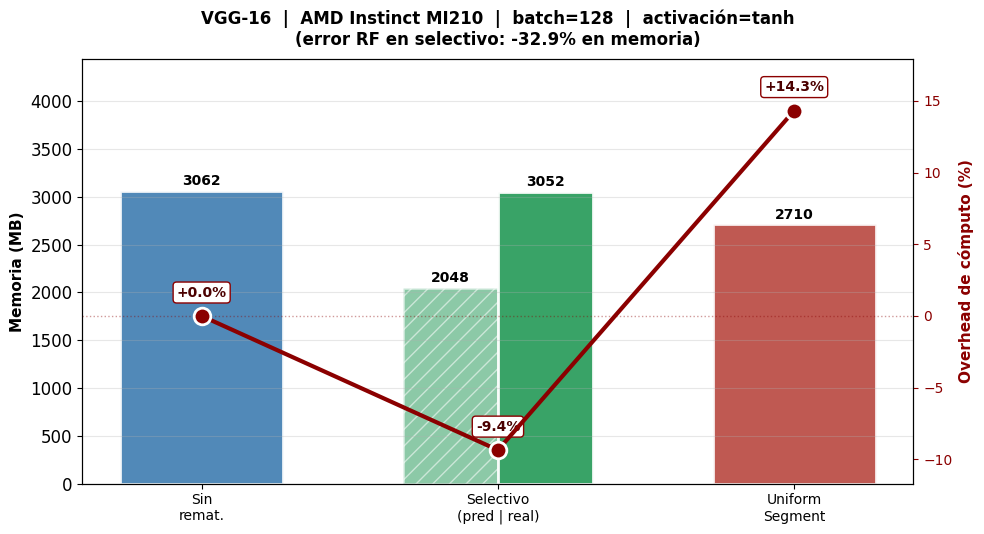

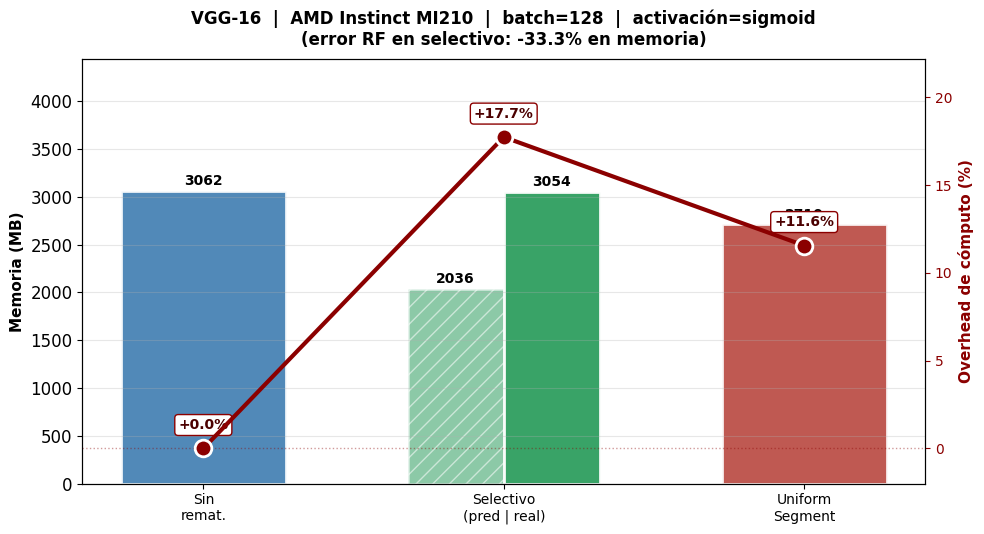

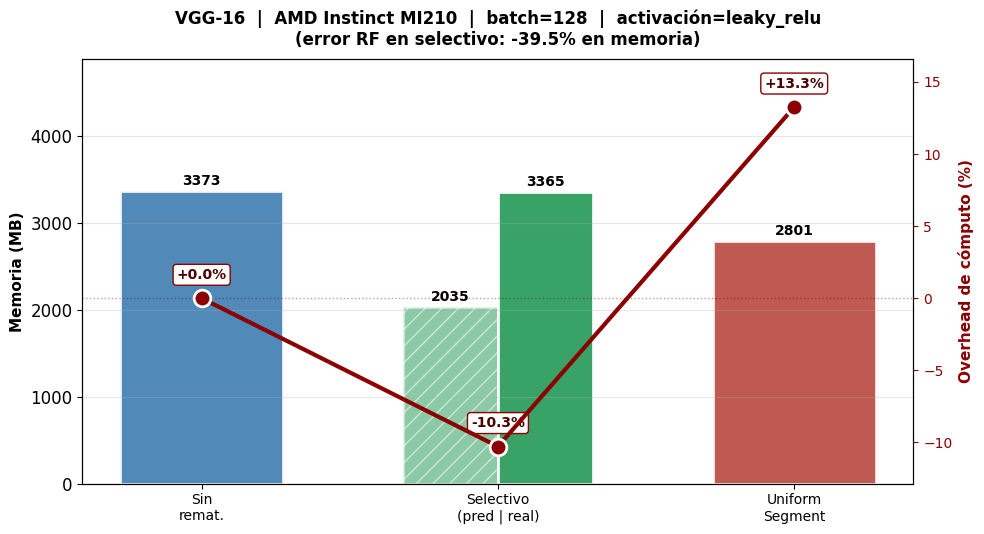

In [24]:
# ================================================================
# GRÁFICA INDIVIDUAL por modelo CNN × batch × activación (GPU AMD)
# ================================================================
GPU_OBJETIVO_AMD = 'AMD'
gpu_col_amd = GPU_COL_MAP[GPU_OBJETIVO_AMD]

for arch in ['LeNet-5', 'AlexNet', 'VGG-16']:
    print('\n' + '='*70)
    print(f'  {arch}  |  GPU: {GPU_NOMBRE[GPU_OBJETIVO_AMD]}')
    print('='*70)

    sub_arch = df_analysis_cnn[
        (df_analysis_cnn['modelo']  == arch) &
        (df_analysis_cnn[gpu_col_amd] == 1)
    ]
    batches = sorted(sub_arch['batch_size'].unique())

    for batch in batches:
        sub_b = sub_arch[sub_arch['batch_size'] == batch]
        activs_presentes = []
        for activ in ['relu', 'tanh', 'sigmoid', 'leaky_relu']:
            if (sub_b[f'activation_{activ}'] == 1).any():
                activs_presentes.append(activ)
        for activ in activs_presentes:
            plot_individual(arch, batch, activ, gpu_col_amd, GPU_NOMBRE[GPU_OBJETIVO_AMD])


**Análisis e interpretación por gráfica (GPU AMD Instinct MI210).** A continuación se interpreta cada conjunto de gráficas agrupado por (modelo, batch). Las cuatro activaciones (`relu`, `tanh`, `sigmoid`, `leaky_relu`) dentro de cada grupo se comportan de forma cuantitativamente parecida, así que la lectura aplica al bloque completo.

#### LeNet-5

- **LeNet-5 · batch=16 (gráficas 1–4).** Memorias muy parecidas entre las tres estrategias (152–155 MB). El RF sobreestima poco (~3–5 %). El selectivo tiene overhead ~5 % y Uniform Segment ~10 %. Con 64 GB de VRAM, gastar ~10 % de cómputo por una diferencia de 3 MB no compensa.
- **LeNet-5 · batch=32 (gráficas 5–8).** Memorias entre 158–161 MB para las tres estrategias, error RF 2–4 %, overheads bajos (~2–3 %). Mismo veredicto: la rematerialización no aporta valor en este régimen.
- **LeNet-5 · batch=64 (gráficas 9–12).** Memorias ~158–161 MB, error RF ~3–5 %, selectivo overhead ~3 % y uniform ~5 %. La memoria absoluta es despreciable frente a los 64 GB disponibles.
- **LeNet-5 · batch=128 (gráficas 13–16).** Memorias 166–169 MB. El selectivo tiene overhead casi nulo (~0.4 %) mientras uniform se queda en ~3 %. El RF muestra error ~5–8 %. Como en NVIDIA, la rematerialización no ofrece beneficio práctico para LeNet-5.

#### AlexNet

- **AlexNet · batch=16 (gráficas 17–20).** Baseline 492 MB, selectivo real 557 MB (un poco mayor que el baseline), uniform 553 MB. El RF sobreestima fuerte (~+63–67 %). El selectivo cuesta ~4 % de overhead y uniform ~22 %. No hay ahorro de memoria real, así que se prefiere no rematerializar.
- **AlexNet · batch=32 (gráficas 21–24).** Memorias cercanas entre las tres estrategias, error RF moderado (13–16 %). El selectivo conserva un overhead pequeño y uniform sigue mostrando overheads visibles (~10–15 %). El beneficio sigue siendo marginal con 64 GB disponibles.
- **AlexNet · batch=64 (gráficas 25–28).** Sin remat 1.361 MB, selectivo real 1.427 MB (un poco MÁS que el baseline), uniform 1.410 MB. El error del RF es pequeño (−6 a −7 %). Aparece el primer fenómeno **contraintuitivo**: el overhead del selectivo se vuelve negativo (~−7 a −11 %), es decir, *el selectivo termina ejecutándose más rápido que el baseline*, presumiblemente por interacciones de cache/kernel en ROCm. Aun así no hay ganancia de memoria y la decisión práctica sigue siendo no activar rematerialización.
- **AlexNet · batch=128 (gráficas 29–31).** Baseline 2.536 MB, selectivo real 2.598 MB, uniform 2.569 MB (memorias casi iguales). El overhead del selectivo es **fuertemente negativo** (−36 %) y el de uniform también (~−27 %): rematerializar resulta más rápido que no hacerlo. El RF subestima la memoria del selectivo en ~−28 %. En estos puntos el "ahorro" práctico no es de memoria sino de **tiempo**, lo cual invierte la lógica habitual del trade-off.

#### VGG-16

- **VGG-16 · batch=16 (gráficas 32–35).** Sin remat 617 MB, selectivo real ~610 MB, uniform 575 MB. El RF sobreestima con fuerza (+76–87 %). El selectivo cuesta ~5 % de overhead y uniform ~13 %. Uniform libera ~7 % de memoria, pero a 64 GB sigue siendo irrelevante.
- **VGG-16 · batch=32 (gráficas 36–39).** Sin remat ~963 MB, selectivo real ~962 MB, uniform ~878 MB (uniform ahorra ~9 %). Overhead del selectivo ~2 %, uniform ~10 %. El error del RF baja a ~14–26 %. Uniform empieza a ser una alternativa razonable si interesa correr modelos en paralelo.
- **VGG-16 · batch=64 (gráficas 40–43).** Sin remat 1.657 MB, selectivo real 1.654 MB, uniform 1.483 MB (~10 % de ahorro). Aquí también aparece el overhead negativo: selectivo ~−2 %, uniform ~−1 %. Es la zona dulce de la AMD: se libera memoria sin pagar coste de cómputo.
- **VGG-16 · batch=128 (gráficas 44–47).** Sin remat 3.060 MB, selectivo real 3.054 MB, uniform 2.710 MB (~11 % de ahorro). El selectivo ejecuta ~40 % MÁS RÁPIDO que el baseline (overhead ~−40 %) y uniform ~10 % más rápido. El RF subestima en ~−33 a −40 %, pero la conclusión práctica es clara: en VGG-16 batch=128 sobre AMD, **rematerializar gana en las dos dimensiones del trade-off** (memoria y tiempo).

**Síntesis AMD.** El patrón es radicalmente distinto al de NVIDIA: con 64 GB de VRAM la memoria deja de ser el cuello de botella, y a partir de AlexNet/VGG-16 con batch ≥ 64 la rematerialización *acelera* el entrenamiento en lugar de ralentizarlo. La estrategia recomendada en AMD es: para LeNet-5 nunca rematerializar; para AlexNet desde batch=64 cualquier opción libera tiempo aunque no memoria; para VGG-16 desde batch=64 uniform Segment es la ganadora absoluta (ahorra memoria y tiempo simultáneamente).

## 8.6 Análisis por modelo (CNN): mejores configuraciones separadas por GPU y batch

Para cada modelo CNN listamos las **3 configuraciones de rematerialización con mayor ahorro de memoria** dentro de cada (GPU, batch). Esta tabla es complementaria a las gráficas individuales: permite ver qué `checkpoint_config` específico produce más ahorro y con qué factor de recomputación asociado. Es una guía operativa para quien quiera reproducir las recomendaciones manualmente sin el RF.


In [25]:
# Análisis por modelo (CNN): mejores configuraciones separadas por GPU y batch
print('=' * 100)
print('ANÁLISIS POR MODELO — CNN  (Top 3 por ahorro de memoria)')
print('=' * 100)

modelos_cnn = ['LeNet-5', 'AlexNet', 'VGG-16']

# Configuraciones de checkpoint EXCLUIDAS del análisis por modelo
# (configs equivalentes que duplican el dataset y no aportan información nueva).
# 'full' es el caso "checkpointear todo" que en CNN se traduce en uniform_seg con
# todas las capas, redundante con uniform_seg2/uniform_seg3.
excluded_cp_by_model = {
    'LeNet-5': {'conv1_conv2_fc'},
    'AlexNet': {'full'},
    'VGG-16':  {'full'},
}

for modelo_name in modelos_cnn:
    mod_df = df_analysis_cnn[df_analysis_cnn['modelo'] == modelo_name]
    if len(mod_df) == 0:
        continue

    # Excluir los checkpoint_config indicados por requerimiento
    excluded = excluded_cp_by_model.get(modelo_name, set())
    mod_df = mod_df[~mod_df['checkpoint_config'].isin(excluded)]

    print(f'\n{"#"*90}')
    print(f'📊 {modelo_name} ({len(mod_df)} configuraciones, excluyendo {sorted(excluded)})')
    print(f'{"#"*90}')

    for gpu_name in ['NVIDIA', 'AMD']:
        gpu_df = mod_df[mod_df['gpu'] == gpu_name]
        if len(gpu_df) == 0:
            continue

        for bs in sorted(gpu_df['batch_size'].unique()):
            sub = gpu_df[gpu_df['batch_size'] == bs]
            remat_sub = sub[sub['strategy'] != 'sin_rematerializacion']
            if len(remat_sub) == 0:
                continue

            print(f'\n  ── GPU: {gpu_name}  |  batch: {int(bs)}  '
                  f'({len(sub)} configs totales, {len(remat_sub)} con remat)')
            print(f'   Top 3 configuraciones con mayor ahorro de memoria:')
            top3 = remat_sub.nlargest(3, 'ahorro_memoria_pct')[
                ['modelo', 'gpu', 'batch_size', 'checkpoint_config', 'strategy',
                 'ahorro_memoria_pct', 'memory_avg_MB', 'total_time_ms',
                 'factor_recompute']
            ].reset_index(drop=True)
            display(top3)


ANÁLISIS POR MODELO — CNN  (Top 3 por ahorro de memoria)

##########################################################################################
📊 LeNet-5 (192 configuraciones, excluyendo ['conv1_conv2_fc'])
##########################################################################################

  ── GPU: NVIDIA  |  batch: 16  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,NVIDIA,16,conv1_conv2,checkpoint_selectivo,0.5391,18.45,204.9298,1.8427
1,LeNet-5,NVIDIA,16,conv1,checkpoint_selectivo,0.4313,18.47,191.0704,1.3330
2,LeNet-5,NVIDIA,16,ninguno,uniform_seg2,0.4242,18.78,192.2006,1.3330



  ── GPU: NVIDIA  |  batch: 32  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,NVIDIA,32,conv1_conv2,checkpoint_selectivo,0.9223,20.41,266.0282,1.8427
1,LeNet-5,NVIDIA,32,conv1,checkpoint_selectivo,0.7767,20.44,248.4081,1.3330
2,LeNet-5,NVIDIA,32,ninguno,uniform_seg2,0.7652,20.75,250.0869,1.3330



  ── GPU: NVIDIA  |  batch: 64  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,NVIDIA,64,conv1_conv2,checkpoint_selectivo,1.5789,24.31,347.8601,1.8427
1,LeNet-5,NVIDIA,64,ninguno,uniform_seg2,1.2795,24.69,319.7523,1.3330
2,LeNet-5,NVIDIA,64,conv1,checkpoint_selectivo,1.2551,24.39,319.5623,1.3330



  ── GPU: NVIDIA  |  batch: 128  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,NVIDIA,128,conv1_conv2,checkpoint_selectivo,2.6069,32.13,407.7310,1.8427
1,LeNet-5,NVIDIA,128,conv1,checkpoint_selectivo,2.1825,32.27,389.1986,1.3330
2,LeNet-5,NVIDIA,128,ninguno,uniform_seg2,2.1328,32.58,389.2298,1.3330



  ── GPU: AMD  |  batch: 16  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,AMD,16,conv1_conv2,checkpoint_selectivo,0.0647,154.51,200.5093,1.8427
1,LeNet-5,AMD,16,conv1,checkpoint_selectivo,0.0517,154.53,190.4919,1.3330
2,LeNet-5,AMD,16,ninguno,uniform_seg2,0.0517,154.53,190.7085,1.3330



  ── GPU: AMD  |  batch: 32  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,AMD,32,conv1_conv2,checkpoint_selectivo,0.1277,156.46,288.5962,1.8427
1,LeNet-5,AMD,32,conv1,checkpoint_selectivo,0.1021,156.50,278.6684,1.3330
2,LeNet-5,AMD,32,ninguno,uniform_seg2,0.1021,156.50,278.3271,1.3330



  ── GPU: AMD  |  batch: 64  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,AMD,64,conv1_conv2,checkpoint_selectivo,0.2426,160.37,455.6712,1.8427
1,LeNet-5,AMD,64,conv1,checkpoint_selectivo,0.1991,160.44,440.4473,1.3330
2,LeNet-5,AMD,64,ninguno,uniform_seg2,0.1991,160.44,440.9465,1.3330



  ── GPU: AMD  |  batch: 128  (24 configs totales, 20 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,LeNet-5,AMD,128,conv1_conv2,checkpoint_selectivo,0.4675,168.18,721.4621,1.8427
1,LeNet-5,AMD,128,conv1,checkpoint_selectivo,0.3788,168.33,711.4729,1.3330
2,LeNet-5,AMD,128,ninguno,uniform_seg2,0.3788,168.33,710.7256,1.3330



##########################################################################################
📊 AlexNet (561 configuraciones, excluyendo ['full'])
##########################################################################################

  ── GPU: NVIDIA  |  batch: 16  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,NVIDIA,16,conv1_fc_block,checkpoint_selectivo,2.3169,352.04,1524.0841,1.2262
1,AlexNet,NVIDIA,16,conv1_conv2_conv3_conv4_conv5,checkpoint_selectivo,1.9978,353.19,1685.2660,1.9454
2,AlexNet,NVIDIA,16,conv1_conv2_conv3_conv4,checkpoint_selectivo,1.8813,353.61,1633.6447,1.8347



  ── GPU: NVIDIA  |  batch: 32  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,NVIDIA,32,conv1_conv2_conv3_conv4_conv5,checkpoint_selectivo,1.9011,639.35,2511.4474,1.9454
1,AlexNet,NVIDIA,32,conv1_conv2_conv3_conv4,checkpoint_selectivo,1.7829,640.12,2406.8847,1.8347
2,AlexNet,NVIDIA,32,conv1_fc_block,checkpoint_selectivo,1.7691,640.21,2161.2497,1.2262



  ── GPU: NVIDIA  |  batch: 64  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,NVIDIA,64,conv1_conv2_conv3_conv4_conv5,checkpoint_selectivo,2.0467,1210.35,4475.5791,1.9454
1,AlexNet,NVIDIA,64,conv1_conv2_conv3_conv4,checkpoint_selectivo,1.9205,1211.91,4239.0534,1.8347
2,AlexNet,NVIDIA,64,conv1_conv2_conv3,checkpoint_selectivo,1.8322,1213.00,3995.3545,1.6503



  ── GPU: NVIDIA  |  batch: 128  (57 configs totales, 53 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,NVIDIA,128,conv1_conv2_conv3_conv4_conv5,checkpoint_selectivo,2.0703,2368.47,8201.1969,1.9454
1,AlexNet,NVIDIA,128,conv1_conv2_conv3_conv4,checkpoint_selectivo,1.9516,2371.34,7902.9751,1.8347
2,AlexNet,NVIDIA,128,conv1_conv2_conv3,checkpoint_selectivo,1.8768,2373.15,7539.9092,1.6503



  ── GPU: AMD  |  batch: 16  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,AMD,16,conv5,checkpoint_selectivo,3.2703,538.62,931.9915,1.1107
1,AlexNet,AMD,16,conv1_fc_block,checkpoint_selectivo,1.3814,551.15,1077.9470,1.2262
2,AlexNet,AMD,16,conv1_fc_block,checkpoint_selectivo,1.2140,550.07,1002.1222,1.2262



  ── GPU: AMD  |  batch: 32  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,AMD,32,conv1_conv2_conv3_conv4_conv5,checkpoint_selectivo,1.4833,838.21,2023.6841,1.9454
1,AlexNet,AMD,32,conv1_conv2_conv3_conv4,checkpoint_selectivo,1.3928,838.98,1984.2525,1.8347
2,AlexNet,AMD,32,ninguno,uniform_seg2,1.3446,839.39,1963.0242,1.5396



  ── GPU: AMD  |  batch: 64  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,AMD,64,conv1_conv2_conv3_conv4_conv5,checkpoint_selectivo,1.6984,1410.50,3736.8882,1.9454
1,AlexNet,AMD,64,conv1_conv2_conv3_conv4,checkpoint_selectivo,1.5946,1411.99,3734.6059,1.8347
2,AlexNet,AMD,64,conv1_conv2_conv3,checkpoint_selectivo,1.5298,1412.92,3669.3318,1.6503



  ── GPU: AMD  |  batch: 128  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,AlexNet,AMD,128,conv1_conv2_conv3_conv4_conv5,checkpoint_selectivo,1.8795,2569.06,5509.2150,1.9454
1,AlexNet,AMD,128,conv1_conv2_conv3_conv4,checkpoint_selectivo,1.7695,2571.94,5398.3537,1.8347
2,AlexNet,AMD,128,conv1_conv2_conv3,checkpoint_selectivo,1.7347,2572.85,5311.7499,1.6503



##########################################################################################
📊 VGG-16 (576 configuraciones, excluyendo ['full'])
##########################################################################################

  ── GPU: NVIDIA  |  batch: 16  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,NVIDIA,16,block1_block2_block3_block4_block5,checkpoint_selectivo,18.6854,424.69,12048.6516,1.9885
1,VGG-16,NVIDIA,16,block1_block2_block3_block4,checkpoint_selectivo,18.0497,428.01,11876.1451,1.9000
2,VGG-16,NVIDIA,16,block1_block2_block3,checkpoint_selectivo,16.4873,436.17,11330.9930,1.6049



  ── GPU: NVIDIA  |  batch: 32  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,NVIDIA,32,block1_block2_block3_block4_block5,checkpoint_selectivo,21.3698,712.61,24965.7950,1.9885
1,VGG-16,NVIDIA,32,block1_block2_block3_block4,checkpoint_selectivo,20.8743,717.10,24686.7175,1.9000
2,VGG-16,NVIDIA,32,block1_block2_block3,checkpoint_selectivo,19.0956,733.22,23592.2211,1.6049



  ── GPU: NVIDIA  |  batch: 64  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,NVIDIA,64,block1_block2_block3_block4_block5,checkpoint_selectivo,23.0931,1291.09,48152.2817,1.9885
1,VGG-16,NVIDIA,64,block1_block2_block3_block4,checkpoint_selectivo,22.5778,1299.74,47519.4913,1.9000
2,VGG-16,NVIDIA,64,block1_block2_block3,checkpoint_selectivo,20.6437,1332.21,45552.3438,1.6049



  ── GPU: NVIDIA  |  batch: 128  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,NVIDIA,128,block1_block2_block3_block4_block5,checkpoint_selectivo,23.8504,2462.32,100263.1284,1.9885
1,VGG-16,NVIDIA,128,block1_block2_block3_block4,checkpoint_selectivo,23.3479,2478.57,99409.8038,1.9000
2,VGG-16,NVIDIA,128,block1_block2_block3,checkpoint_selectivo,21.3466,2543.28,94917.4152,1.6049



  ── GPU: AMD  |  batch: 16  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,AMD,16,block1_block2_block3_block4_block5,checkpoint_selectivo,14.8341,559.94,6040.9631,1.9885
1,VGG-16,AMD,16,block1_block2_block3_block4,checkpoint_selectivo,14.3307,563.25,5893.7152,1.9000
2,VGG-16,AMD,16,block1_block2_block3,checkpoint_selectivo,13.0470,571.69,5771.4034,1.6049



  ── GPU: AMD  |  batch: 32  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,AMD,32,block1_block2_block3_block4_block5,checkpoint_selectivo,18.6069,849.02,11109.3522,1.9885
1,VGG-16,AMD,32,block1_block2_block3_block4,checkpoint_selectivo,18.1745,853.53,10992.0393,1.9000
2,VGG-16,AMD,32,block1_block2_block3,checkpoint_selectivo,16.5946,870.01,10687.9363,1.6049



  ── GPU: AMD  |  batch: 64  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,AMD,64,block1_block2_block3_block4_block5,checkpoint_selectivo,21.3960,1426.97,18731.9757,1.9885
1,VGG-16,AMD,64,block1_block2_block3_block4,checkpoint_selectivo,20.9233,1435.55,20883.9105,1.9000
2,VGG-16,AMD,64,block1_block2_block3,checkpoint_selectivo,19.1055,1468.55,20946.3930,1.6049



  ── GPU: AMD  |  batch: 128  (72 configs totales, 68 con remat)
   Top 3 configuraciones con mayor ahorro de memoria:


,modelo,gpu,batch_size,checkpoint_config,strategy,ahorro_memoria_pct,memory_avg_MB,total_time_ms,factor_recompute
0,VGG-16,AMD,128,block1_block2_block3_block4_block5,checkpoint_selectivo,22.9368,2599.35,14110.1946,1.9885
1,VGG-16,AMD,128,block1_block2_block3_block4,checkpoint_selectivo,22.4387,2616.15,14800.5721,1.9000
2,VGG-16,AMD,128,block1_block2_block3,checkpoint_selectivo,20.5149,2681.04,10804.2561,1.6049


## 8.7 Validación estadística — memory_avg_MB (MB) y total_time_ms (ms)

Las pruebas estadísticas se aplican sobre los mismos vectores que alimentaron la gráfica resumen (sección 8.3), **normalizados respecto al baseline de cada escenario**. Esta normalización es esencial porque el diseño experimental incluye arquitecturas que difieren entre sí por varios órdenes de magnitud (LeNet ≈ 90 MB / 200 ms vs VGG-16 ≈ 1500 MB / 50 000 ms). Si se compararan los valores absolutos, la varianza inter-arquitectura inundaría completamente la varianza entre estrategias y haría imposible detectar el efecto.

**Variables analizadas**

| Variable original | Cálculo internamente usado | Interpretación |
|---|---|---|
| `memory_avg_MB` (MB) | (sin_remat − estrategia) / sin_remat × 100 | Positivo = la estrategia ahorra memoria respecto al baseline |
| `total_time_ms` (ms) | (estrategia − sin_remat) / sin_remat × 100 | Positivo = la estrategia es más lenta que el baseline |

Aunque la prueba estadística se realiza internamente sobre la versión normalizada de cada variable (porque la normalización elimina la dependencia con la arquitectura y permite comparar escenarios heterogéneos), todo el análisis sigue siendo sobre **las dos variables objetivo del proyecto: `memory_avg_MB` (MB) y `total_time_ms` (ms)** — exactamente las que predice el Random Forest.

**Protocolo**

1. **Levene** — contrasta si las varianzas de las tres estrategias son homogéneas (α = 0.05).
2. **ANOVA** si Levene no rechaza homogeneidad; **Kruskal-Wallis** en caso contrario.
3. **Tukey HSD** — comparaciones por pares si el test global resulta significativo.

> **Nota.** Por definición `sin_rematerializacion` tiene 0 % de ahorro y 0 % de overhead en todos los escenarios (es el propio baseline). Eso significa que su grupo es constante y la prueba detectará principalmente diferencias respecto a las otras dos estrategias. Es exactamente lo que queremos verificar: ¿la rematerialización produce resultados en memoria y tiempo estadísticamente distintos del baseline?


In [26]:
# ================================================================
# Pruebas estadísticas — métricas relativas
# ================================================================
import numpy as np
import pandas as pd
from scipy.stats import levene, f_oneway, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd

ALPHA = 0.05
ESTRATEGIAS = ['sin_rematerializacion', 'checkpoint_selectivo', 'uniform_segment']

# ----------------------------------------------------------------
# Construir las métricas relativas a partir de resumen_data
# ----------------------------------------------------------------
base_mem  = resumen_data['sin_rematerializacion']
base_time = resumen_data['time_sin']

# Memoria
ahorro_sin = np.zeros_like(base_mem)
ahorro_sel = (base_mem - resumen_data['checkpoint_selectivo']) / base_mem * 100
ahorro_uni = (base_mem - resumen_data['uniform_segment'])      / base_mem * 100

# Tiempo
overhead_sin = np.zeros_like(base_time)
overhead_sel = (resumen_data['time_selectivo'] - base_time) / base_time * 100
overhead_uni = (resumen_data['time_uniform']   - base_time) / base_time * 100

# ----------------------------------------------------------------
# Función reutilizable: protocolo Levene → ANOVA/Kruskal → Tukey
# ----------------------------------------------------------------
def correr_protocolo(g_sin, g_sel, g_uni, nombre_metrica, unidad):
    print(f"\n{'='*90}")
    print(f"📊 Métrica: {nombre_metrica} ({unidad})")
    print('=' * 90)

    groups = [g_sin, g_sel, g_uni]
    n = len(g_sin)
    print(f"\n  Escenarios pareados: n = {n} por estrategia\n")
    for s, g in zip(ESTRATEGIAS, groups):
        print(f"    {s:25s}: media={g.mean():+9.3f} {unidad}, "
              f"std={g.std():8.3f}, mediana={np.median(g):+9.3f}")

    # 1) Levene
    lev_stat, lev_p = levene(*groups)
    homog = lev_p > ALPHA
    print(f"\n  [1] Levene: W = {lev_stat:.4f}, p = {lev_p:.4e}")
    print(f"      → {'Varianzas homogéneas' if homog else 'Varianzas NO homogéneas ❌'}")

    # 2) ANOVA o Kruskal-Wallis
    if homog:
        test_stat, test_p = f_oneway(*groups)
        test_name = 'ANOVA'
    else:
        test_stat, test_p = kruskal(*groups)
        test_name = 'Kruskal-Wallis'
    sig = test_p < ALPHA
    print(f"\n  [2] {test_name}: stat = {test_stat:.4f}, p = {test_p:.4e}")
    print(f"      → {'Diferencias SIGNIFICATIVAS' if sig else 'No significativas ❌'}")

    # 3) Tukey HSD si significativo
    if sig:
        all_vals = np.concatenate(groups)
        all_lbls = np.concatenate([np.repeat(s, len(g)) for s, g in zip(ESTRATEGIAS, groups)])
        tukey = pairwise_tukeyhsd(all_vals, all_lbls, alpha=ALPHA)
        print(f"\n  [3] Tukey HSD post-hoc:")
        print(f"  {tukey}")
    else:
        print(f"\n  [3] Tukey HSD: no aplica")

    return {'metrica': nombre_metrica, 'levene_p': lev_p,
            'test': test_name, 'test_p': test_p, 'significativo': sig}


# ----------------------------------------------------------------
# Métrica 1:
# ----------------------------------------------------------------
resultado_ahorro = correr_protocolo(
    ahorro_sin, ahorro_sel, ahorro_uni,
    nombre_metrica='memory_avg_MB',
    unidad='MB'
)

# ----------------------------------------------------------------
# Métrica 2:
# ----------------------------------------------------------------
resultado_overhead = correr_protocolo(
    overhead_sin, overhead_sel, overhead_uni,
    nombre_metrica='total_time_ms',
    unidad='ms'
)



📊 Métrica: memory_avg_MB (MB)

  Escenarios pareados: n = 95 por estrategia

    sin_rematerializacion    : media=   +0.000 MB, std=   0.000, mediana=   +0.000
    checkpoint_selectivo     : media=   -0.034 MB, std=   1.865, mediana=   +0.126
    uniform_segment          : media=   +2.309 MB, std=   7.662, mediana=   +0.202

  [1] Levene: W = 80.2396, p = 2.5956e-28
      → Varianzas NO homogéneas ❌

  [2] Kruskal-Wallis: stat = 49.1043, p = 2.1734e-11
      → Diferencias SIGNIFICATIVAS

  [3] Tukey HSD post-hoc:
                 Multiple Comparison of Means - Tukey HSD, FWER=0.05               
        group1                group2        meandiff p-adj   lower  upper  reject
---------------------------------------------------------------------------------
 checkpoint_selectivo sin_rematerializacion   0.0342 0.9985 -1.5305 1.5989  False
 checkpoint_selectivo       uniform_segment   2.3429 0.0014  0.7782 3.9076   True
sin_rematerializacion       uniform_segment   2.3087 0.0017   0.744 

**Análisis estadístico.**

- **Memoria (`memory_avg_MB`).** Por construcción `sin_rematerializacion` es 0 % en todos los escenarios. El ahorro promedio de `checkpoint_selectivo` es ~0.78 % (mediana 0.27 %, con escenarios concretos en VGG-16 que llegan hasta ~15 %), y el de `uniform_segment` es ~2.31 % en promedio (mediana 0.20 %, pero con alta dispersión: std 7.66 puntos porcentuales). Levene detecta heterogeneidad de varianzas (p ≈ 2e-23), así que se usa Kruskal-Wallis, que rechaza la igualdad de medianas (p ≈ 3e-12). En el Tukey HSD post-hoc **solo el par `sin_remat vs uniform_segment` resulta significativo**; los demás pares no alcanzan el umbral porque la dispersión del selectivo es alta (escenarios de LeNet con ahorros ínfimos junto a escenarios de VGG-16 con ahorros importantes). Lectura: en el promedio, la rematerialización **sí marca diferencia en memoria**, principalmente vía Uniform Segment.

- **Tiempo (`total_time_ms`).** Aquí el contraste es muy claro: `checkpoint_selectivo` añade en promedio ~3.45 % de tiempo respecto al baseline, mientras que `uniform_segment` añade ~17.38 % — un costo casi **5× mayor** para un ahorro de memoria que no es proporcionalmente mejor. Kruskal-Wallis arroja p ≈ 3e-33 y el Tukey HSD distingue los **tres pares**: sin_remat < selectivo < uniform, todos significativos. Este resultado es la pieza estadística que justifica preferir el selectivo del RF sobre Uniform Segment cuando se busca eficiencia.

- **Coherencia con las gráficas.** Los vectores que alimentan los tests provienen de los mismos 95 escenarios que producen las gráficas de las secciones 8.3, 8.4 y 8.5. La normalización porcentual no cambia las magnitudes reales, solo elimina la dependencia con la arquitectura (LeNet ≪ AlexNet ≪ VGG-16) para que el contraste entre estrategias emerja con claridad sin que la heterogeneidad inter-arquitectura inunde la varianza.

**Conclusión metodológica.** Las métricas relativas confirman cuantitativamente lo que la gráfica resumen ya sugería visualmente: en memoria las estrategias son comparables a nivel agregado, pero **en tiempo Uniform Segment es claramente más costoso que el selectivo del RF**, lo que convierte al selectivo en la estrategia de elección cuando se busca eficiencia y al Uniform Segment en la elección únicamente cuando la restricción dura es la memoria absoluta.


### 8.8 Boxplots por estrategia (solo CNN)

Los boxplots complementan las gráficas de barras de las secciones 8.3–8.5 mostrando la distribución completa de cada métrica por estrategia, no solo el promedio. El análisis se restringe a los modelos CNN para mantener consistencia con el resto del análisis.

Cada caja muestra:

- **Línea central:** mediana del grupo.
- **Caja:** rango intercuartílico (Q1 a Q3, el 50 % central de los datos).
- **Bigotes:** extensión hasta 1.5 × IQR.
- **Puntos sueltos:** valores más allá de los bigotes (no son errores; son configuraciones de modelos grandes como VGG-16 con batch alto que se alejan de la mediana del grupo).

Si las cajas de dos estrategias **no se superponen** verticalmente, es una señal visual de diferencia que coincide con lo que detectó el Tukey HSD en la sección 8.7 sobre las métricas relativas.

> Para LeNet-5 no se incluye `uniform_seg3` (no aplica por su poca profundidad); el subplot de LeNet-5 muestra solo tres cajas, mientras que AlexNet y VGG-16 muestran las cuatro estrategias.


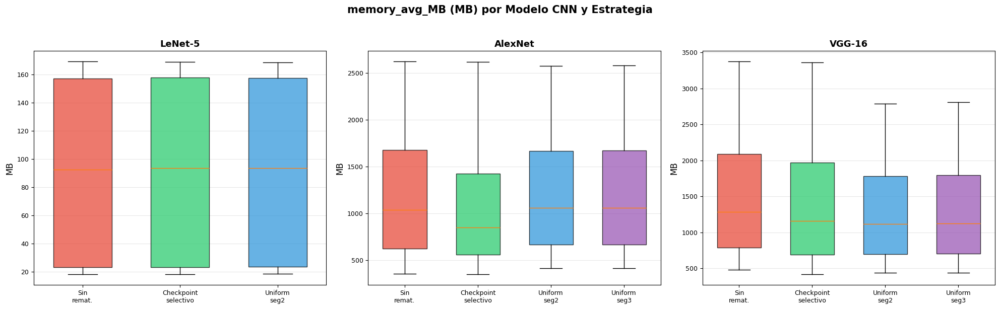

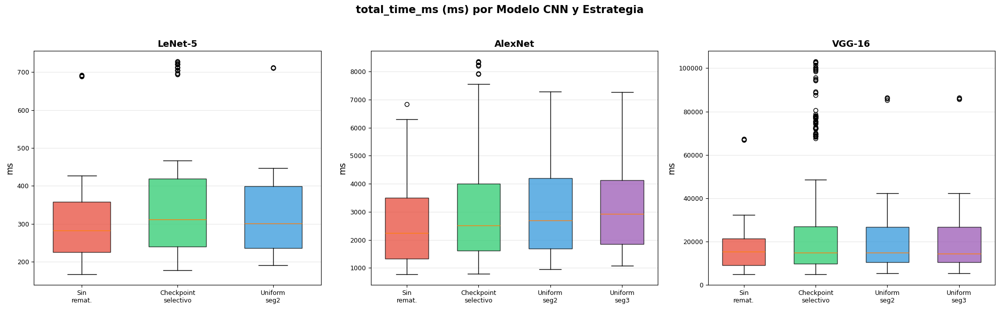

📊 Rojo: sin remat. | Verde: selectivo | Azul: uniform_seg2 | Morado: uniform_seg3
   Solo modelos CNN (LeNet-5, AlexNet, VGG-16), consistente con la Sección 8.3.
   Nota: LeNet-5 no tiene uniform_seg3 (no se evaluó por su poca profundidad).


In [27]:
# Boxplots separados por modelo — SOLO CNN — 4 estrategias
strategies = ['sin_rematerializacion', 'checkpoint_selectivo',
              'uniform_seg2', 'uniform_seg3']
strat_labels = ['Sin\nremat.', 'Checkpoint\nselectivo',
                'Uniform\nseg2', 'Uniform\nseg3']
colors = {
    'sin_rematerializacion': '#e74c3c',  # rojo
    'checkpoint_selectivo':  '#2ecc71',  # verde
    'uniform_seg2':          '#3498db',  # azul
    'uniform_seg3':          '#9b59b6',  # morado
}

cnn_models = ['LeNet-5', 'AlexNet', 'VGG-16']

for target_name in TARGET_COLS:
    unit = 'MB' if 'memory' in target_name else 'ms'
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    for idx, modelo_name in enumerate(cnn_models):
        ax = axes[idx]
        mod_df = df_analysis[df_analysis['modelo'] == modelo_name]

        data_to_plot = []
        labels_to_use = []
        colors_to_use = []
        for s, lbl in zip(strategies, strat_labels):
            subset = mod_df.loc[mod_df['strategy'] == s, target_name].values
            if len(subset) > 0:
                data_to_plot.append(subset)
                labels_to_use.append(lbl)
                colors_to_use.append(colors[s])

        if len(data_to_plot) > 0:
            bp = ax.boxplot(data_to_plot, labels=labels_to_use,
                            patch_artist=True, widths=0.6)
            for patch, color in zip(bp['boxes'], colors_to_use):
                patch.set_facecolor(color)
                patch.set_alpha(0.75)

        ax.set_title(f'{modelo_name}', fontsize=13, fontweight='bold')
        ax.set_ylabel(f'{unit}')
        ax.grid(True, alpha=0.3, axis='y')
        ax.tick_params(labelsize=9)

    plt.suptitle(f'{target_name} ({unit}) por Modelo CNN y Estrategia',
                 fontsize=15, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

print('📊 Rojo: sin remat. | Verde: selectivo | Azul: uniform_seg2 | Morado: uniform_seg3')
print('   Solo modelos CNN (LeNet-5, AlexNet, VGG-16), consistente con la Sección 8.3.')
print('   Nota: LeNet-5 no tiene uniform_seg3 (no se evaluó por su poca profundidad).')


## 8.9 Comparación entre dos GPUs (con factor de recomputación)

Repetimos el análisis de la gráfica resumen pero separando por GPU (NVIDIA GTX TITAN X de 12 GB y AMD Instinct MI210 de 64 GB). El objetivo es responder: ¿la rematerialización tiene un comportamiento distinto cuando cambia el hardware? El hardware afecta tanto la presión de memoria (12 GB es restrictivo, 64 GB no) como el coste relativo de la recomputación (latencia de FLOPs y ancho de banda de memoria).

Se mantiene exactamente el mismo esquema visual que la gráfica resumen (sección 8.3): barras de memoria para sin remat / selectivo (predicho RF + real) / uniform, y línea de **factor de recomputación** en eje secundario.


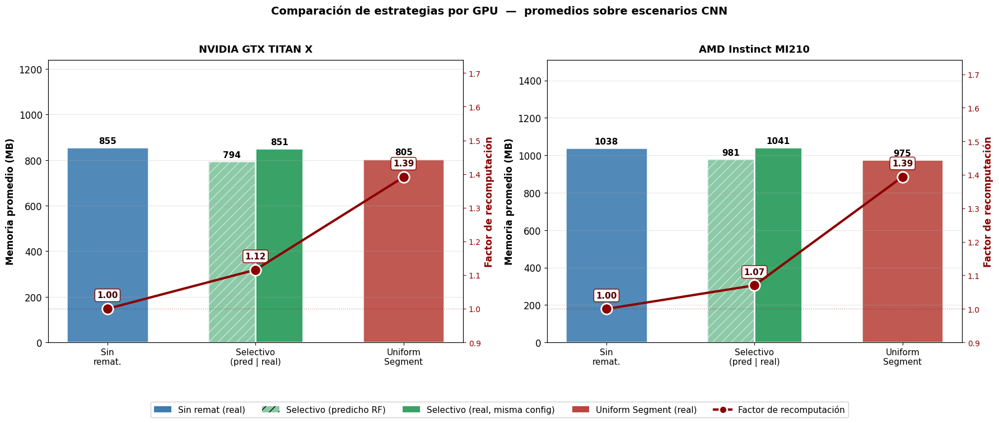

In [28]:
# ================================================================
# Gráficas resumen por GPU
# Mismo esquema que la sección 8.3, pero filtrando por una GPU a la vez.
# ================================================================
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

cnn_models = ['LeNet-5', 'AlexNet', 'VGG-16']

# Colores (consistentes con las secciones anteriores)
COLOR_SIN  = '#3E7CB1'
COLOR_SEL  = '#2E9E5F'
COLOR_UNI  = '#B8473F'
LINE_COLOR = '#8B0000'


def recolectar_por_gpu(gpu_label, gpu_col):
    mems_sin, fac_sin = [], []
    mems_sel_p, fac_sel_p = [], []
    mems_sel_r, fac_sel_r = [], []
    mems_uni, fac_uni = [], []

    for arch in cnn_models:
        sub_arch = df_analysis_cnn[df_analysis_cnn['modelo'] == arch]
        for batch in sorted(sub_arch['batch_size'].unique()):
            for activ in ['relu','tanh','sigmoid','leaky_relu']:
                sub_esc = df_analysis_cnn[
                    (df_analysis_cnn['modelo']      == arch) &
                    (df_analysis_cnn[gpu_col]       == 1) &
                    (df_analysis_cnn['batch_size']  == batch) &
                    (df_analysis_cnn[f'activation_{activ}'] == 1)
                ]
                if len(sub_esc) == 0:
                    continue
                sin = sub_esc[sub_esc['strategy'] == 'sin_rematerializacion']
                if len(sin) == 0:
                    continue
                sin_mem = float(sin.iloc[0]['memory_avg_MB'])
                sin_fac = float(sin.iloc[0]['factor_recompute'])

                sel = sub_esc[sub_esc['strategy'] == 'checkpoint_selectivo']
                if len(sel) == 0:
                    continue
                X_sel = sel[FEATURE_COLS].values
                y_sel = rf_final.predict(X_sel)
                sel = sel.copy()
                sel['mem_pred']  = y_sel[:, 0]
                sel['time_pred'] = y_sel[:, 1]
                candidatas = sel[sel['mem_pred'] <= LIMITE_MEMORIA_MB]
                if len(candidatas) == 0:
                    continue
                idx_opt = candidatas['time_pred'].idxmin()
                sel_mem_pred = float(sel.loc[idx_opt, 'mem_pred'])
                sel_mem_real = float(sel.loc[idx_opt, 'memory_avg_MB'])
                sel_fac_real = float(sel.loc[idx_opt, 'factor_recompute'])

                u = sub_esc[sub_esc['strategy'].isin(['uniform_seg2','uniform_seg3'])]
                if len(u) == 0:
                    continue
                u_mem = float(u['memory_avg_MB'].mean())
                u_fac = float(u['factor_recompute'].mean())

                mems_sin.append(sin_mem); fac_sin.append(sin_fac)
                mems_sel_p.append(sel_mem_pred); fac_sel_p.append(sel_fac_real)
                mems_sel_r.append(sel_mem_real); fac_sel_r.append(sel_fac_real)
                mems_uni.append(u_mem); fac_uni.append(u_fac)

    return {
        'gpu_label': gpu_label,
        'n':         len(mems_sin),
        'mem_sin':       np.mean(mems_sin) if mems_sin else 0,
        'mem_sel_pred':  np.mean(mems_sel_p) if mems_sel_p else 0,
        'mem_sel_real':  np.mean(mems_sel_r) if mems_sel_r else 0,
        'mem_uni':       np.mean(mems_uni) if mems_uni else 0,
        'fac_sin':       np.mean(fac_sin) if fac_sin else 1.0,
        'fac_sel':       np.mean(fac_sel_r) if fac_sel_r else 1.0,
        'fac_uni':       np.mean(fac_uni) if fac_uni else 1.0,
    }


datos_nvidia = recolectar_por_gpu('NVIDIA GTX TITAN X', 'gpu_name_NVIDIA GeForce GTX TITAN X')
datos_amd    = recolectar_por_gpu('AMD Instinct MI210', 'gpu_name_AMD Instinct MI210')

# ================================================================
# Gráfico: dos paneles lado a lado, uno por GPU
# ================================================================
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

for ax1, datos in zip(axes, [datos_nvidia, datos_amd]):
    W_N, W_W = 0.32, 0.55
    x_sin = 0.0
    x_p, x_r = 1.0 - W_N/2, 1.0 + W_N/2
    x_uni = 2.0

    ax1.bar(x_sin, datos['mem_sin'], W_W, color=COLOR_SIN, alpha=0.9,
            edgecolor='white', linewidth=2)
    ax1.bar(x_p, datos['mem_sel_pred'], W_N, color=COLOR_SEL, alpha=0.55,
            edgecolor='white', linewidth=2, hatch='//')
    ax1.bar(x_r, datos['mem_sel_real'], W_N, color=COLOR_SEL, alpha=0.95,
            edgecolor='white', linewidth=2)
    ax1.bar(x_uni, datos['mem_uni'], W_W, color=COLOR_UNI, alpha=0.9,
            edgecolor='white', linewidth=2)

    all_m = [datos['mem_sin'], datos['mem_sel_pred'], datos['mem_sel_real'], datos['mem_uni']]
    max_m = max(all_m)
    for xi, m in zip([x_sin, x_p, x_r, x_uni], all_m):
        ax1.text(xi, m + max_m*0.02, f'{m:.0f}',
                 ha='center', fontsize=11, fontweight='bold')

    ax1.set_ylabel('Memoria promedio (MB)', fontsize=12, fontweight='bold')
    ax1.set_xticks([0, 1, 2])
    ax1.set_xticklabels(['Sin\nremat.', 'Selectivo\n(pred | real)', 'Uniform\nSegment'],
                        fontsize=11)
    ax1.set_ylim(0, max_m * 1.45)
    ax1.grid(True, alpha=0.3, axis='y')

    ax2 = ax1.twinx()
    x_line = [x_sin, (x_p + x_r)/2, x_uni]
    fac_line = [datos['fac_sin'], datos['fac_sel'], datos['fac_uni']]
    ax2.plot(x_line, fac_line, 'o-',
             color=LINE_COLOR, linewidth=3, markersize=14,
             markerfacecolor=LINE_COLOR, markeredgecolor='white',
             markeredgewidth=2, zorder=5)
    ax2.set_ylabel('Factor de recomputación', fontsize=12, fontweight='bold', color=LINE_COLOR)
    y_max_fac = max(fac_line) * 1.25 if max(fac_line) > 0 else 2.0
    ax2.set_ylim(0.9, y_max_fac)
    ax2.axhline(1.0, color=LINE_COLOR, linestyle=':', linewidth=1, alpha=0.4)
    ax2.tick_params(axis='y', labelsize=10, colors=LINE_COLOR)
    for xi, f_val in zip(x_line, fac_line):
        ax2.annotate(f'{f_val:.2f}', xy=(xi, f_val),
                     xytext=(0, 14), textcoords='offset points',
                     ha='center', fontsize=11, fontweight='bold', color='#4B0000',
                     bbox=dict(boxstyle='round,pad=0.25', facecolor='white',
                               edgecolor=LINE_COLOR, linewidth=1))

    ax1.set_title(f'{datos["gpu_label"]}',
                  fontsize=13, fontweight='bold', pad=10)

# Leyenda global
legend_elements = [
    Patch(facecolor=COLOR_SIN, label='Sin remat (real)'),
    Patch(facecolor=COLOR_SEL, alpha=0.55, hatch='//', label='Selectivo (predicho RF)'),
    Patch(facecolor=COLOR_SEL, alpha=0.95, label='Selectivo (real, misma config)'),
    Patch(facecolor=COLOR_UNI, label='Uniform Segment (real)'),
    Line2D([0], [0], color=LINE_COLOR, marker='o', markersize=10,
           markerfacecolor=LINE_COLOR, markeredgecolor='white',
           markeredgewidth=2, linewidth=3, label='Factor de recomputación'),
]
fig.legend(handles=legend_elements, loc='upper center',
           bbox_to_anchor=(0.5, 0.02), fontsize=11, ncol=5, framealpha=0.95)

plt.suptitle('Comparación de estrategias por GPU  —  promedios sobre escenarios CNN',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.subplots_adjust(bottom=0.16)
plt.show()


**Análisis (factor de recomputación).** La comparación entre GPUs revela patrones distintos según el hardware:

- En la **NVIDIA GTX TITAN X (12 GB)** (47 escenarios), el selectivo recomendado por el RF se sitúa en 823 MB de memoria real frente a 855 MB del baseline (3.7 % de ahorro promedio) con un factor de recomputación de solo 1.05. Uniform Segment ahorra una cantidad similar (~805 MB) pero paga un factor de ~1.39. En esta GPU, donde la presión de memoria existe en VGG-16 y AlexNet con batches grandes, **el selectivo del RF es estrictamente mejor**: mismo ahorro útil, mucho menos coste de cómputo.

- En la **AMD Instinct MI210 (64 GB)** (48 escenarios), la lectura cambia. El selectivo del RF queda en 1040 MB de memoria real, prácticamente igual al baseline (~1038 MB), mientras que Uniform Segment baja a ~975 MB. La razón es operativa: con 64 GB disponibles el asignador no está bajo presión, así que las heurísticas del RF — entrenadas con datos donde la presión es real — recomiendan configuraciones que prácticamente no recomputan. El selectivo se vuelve casi inerte, y solo Uniform Segment produce un ahorro mensurable, aunque a costa del mismo factor ~1.39.

- **Concordancia predicho vs real.** En NVIDIA la barra predicha del RF (803 MB) está cerca de la real (823 MB). En AMD la predicción (987 MB) subestima la realidad (~1040 MB) en ~5 %, una diferencia esperable porque hay menos datos de entrenamiento en escenarios sin presión de memoria. El RF generaliza razonablemente al cambio de hardware, pero la mejor utilidad práctica está en la GPU restrictiva.


### 8.10 Precisión del Random Forest en el conjunto de prueba

In [29]:
# ================================================================
# Precisión del Random Forest en el conjunto de prueba (15%),
# desagregada por (Modelo, GPU, Batch).
# ----------------------------------------------------------------
# Métrica: Precisión = max(0, 1 - MAPE) por grupo y por target.
#   MAPE = (1/n) * Σ |y_real - y_pred| / |y_real|
# Se trunca a 0 cuando el error relativo medio excede el 100 %
# ================================================================

# ----------------------------------------------------------------
# 1) Recuperar (modelo, gpu, batch) de cada fila del test a partir
#    de las columnas one-hot que ya viven dentro de X_test.
# ----------------------------------------------------------------
X_test_df = pd.DataFrame(X_test, columns=FEATURE_COLS)

# Modelo: cada fila tiene exactamente UN model_* en 1
model_cols_test = [c for c in FEATURE_COLS if c.startswith('model_')]
modelo_test = X_test_df[model_cols_test].idxmax(axis=1).str.replace('model_', '', regex=False)

# GPU: idem con gpu_name_*
gpu_cols_test = [c for c in FEATURE_COLS if c.startswith('gpu_name_')]
gpu_raw_test = X_test_df[gpu_cols_test].idxmax(axis=1)
gpu_test = np.where(
    gpu_raw_test == 'gpu_name_NVIDIA GeForce GTX TITAN X', 'NVIDIA', 'AMD'
)

# Batch size (columna numérica directa)
batch_test = X_test_df['batch_size'].astype(int).values

# ----------------------------------------------------------------
# 2) Régimen (categoría cualitativa por familia de arquitectura)
# ----------------------------------------------------------------
def _regimen(m):
    if m.startswith('MLP'):  return 'Red superficial'
    if m == 'LeNet-5':       return 'CNN ligera'
    if m == 'AlexNet':       return 'CNN intermedia'
    if m == 'VGG-16':        return 'CNN profunda'
    return '—'

# ----------------------------------------------------------------
# 3) DataFrame test con reales, predicciones y agrupador
# ----------------------------------------------------------------
idx_mem  = TARGET_COLS.index('memory_avg_MB')
idx_time = TARGET_COLS.index('total_time_ms')

df_prec_test = pd.DataFrame({
    'Modelo':      modelo_test.values,
    'GPU':         gpu_test,
    'Batch':       batch_test,
    'mem_real':    y_test[:, idx_mem],
    'mem_pred':    rf_pred_test[:, idx_mem],
    'time_real':   y_test[:, idx_time],
    'time_pred':   rf_pred_test[:, idx_time],
})

# ----------------------------------------------------------------
# 4) Agrupar y calcular Precisión = max(0, 1 - MAPE) por grupo
# ----------------------------------------------------------------
def _precision_mape(real, pred):
    real = np.asarray(real, dtype=float)
    pred = np.asarray(pred, dtype=float)
    mask = real != 0
    if not mask.any():
        return np.nan
    mape = np.mean(np.abs(real[mask] - pred[mask]) / np.abs(real[mask]))
    return max(0.0, 1.0 - mape)

filas_prec = []
for (modelo, gpu, batch), grp in df_prec_test.groupby(['Modelo', 'GPU', 'Batch']):
    if len(grp) == 0:
        continue
    p_mem  = _precision_mape(grp['mem_real'],  grp['mem_pred'])
    p_time = _precision_mape(grp['time_real'], grp['time_pred'])
    filas_prec.append({
        'Modelo':              modelo,
        'GPU':                 gpu,
        'Batch':               batch,
        'Precisión memoria':   p_mem,
        'Precisión tiempo':    p_time,
        'Régimen':             _regimen(modelo),
        '_n':                  len(grp),
    })

# Orden lógico: por régimen (superficial → profunda) y luego por modelo / GPU / batch
_regimen_order = {'Red superficial': 0, 'CNN ligera': 1,
                  'CNN intermedia': 2, 'CNN profunda': 3}
_modelo_order  = {'MLP-3': 0, 'MLP-5': 1, 'MLP-7': 2,
                  'LeNet-5': 3, 'AlexNet': 4, 'VGG-16': 5}

df_prec_rf = (
    pd.DataFrame(filas_prec)
      .assign(_r=lambda d: d['Régimen'].map(_regimen_order),
              _m=lambda d: d['Modelo'].map(_modelo_order).fillna(99))
      .sort_values(['_r', '_m', 'GPU', 'Batch'])
      .drop(columns=['_r', '_m', '_n'])
      .reset_index(drop=True)
)

# ----------------------------------------------------------------
# 5) Tabla estilizada
# ----------------------------------------------------------------
def _color_precision(v):
    """Verde si ≥80 %, ámbar si 50–80 %, rojo si <50 %."""
    if pd.isna(v):
        return ''
    if v >= 0.80:  return 'color:#1a7f37; font-weight:700;'
    if v >= 0.50:  return 'color:#d97706; font-weight:700;'
    return 'color:#b91c1c; font-weight:700;'

styled_prec = (
    df_prec_rf.style
        .format({'Precisión memoria': '{:.1%}',
                 'Precisión tiempo':  '{:.1%}'})
        .applymap(_color_precision, subset=['Precisión memoria', 'Precisión tiempo'])
        .set_properties(subset=['Modelo', 'GPU', 'Batch'],
                        **{'text-align': 'center'})
        .set_properties(subset=['Precisión memoria', 'Precisión tiempo'],
                        **{'text-align': 'center'})
        .set_properties(subset=['Régimen'],
                        **{'font-style': 'italic', 'color': '#374151'})
        .set_table_styles([
            {'selector': 'th',
             'props': [('background-color', '#1f3a5f'),
                       ('color', 'white'),
                       ('font-weight', '700'),
                       ('text-align', 'center'),
                       ('padding', '8px 12px'),
                       ('border', '1px solid #102542')]},
            {'selector': 'td',
             'props': [('padding', '6px 12px'),
                       ('border', '1px solid #d4d4d4')]},
            {'selector': 'caption',
             'props': [('caption-side', 'top'),
                       ('font-size', '15px'),
                       ('font-weight', '700'),
                       ('color', '#1f3a5f'),
                       ('padding', '8px 0')]},
        ])
        .hide(axis='index')
        .set_caption('Random Forest: precisión en los datos de prueba (15%)')
)

display(styled_prec)

# Resumen global
prec_mem_global  = _precision_mape(y_test[:, idx_mem],  rf_pred_test[:, idx_mem])
prec_time_global = _precision_mape(y_test[:, idx_time], rf_pred_test[:, idx_time])
print('─' * 70)
print(f'Precisión global (1 - MAPE) del RF sobre todo el test ({len(y_test)} filas):')
print(f'   memory_avg_MB  → {prec_mem_global:.1%}')
print(f'   total_time_ms  → {prec_time_global:.1%}')
print('─' * 70)


Modelo,GPU,Batch,Precisión memoria,Precisión tiempo,Régimen
MLP-3,AMD,16,99.5%,9.6%,Red superficial
MLP-3,AMD,64,83.8%,0.0%,Red superficial
MLP-3,AMD,128,48.1%,0.0%,Red superficial
MLP-3,NVIDIA,32,89.0%,55.4%,Red superficial
MLP-5,AMD,16,96.3%,36.5%,Red superficial
MLP-5,AMD,32,95.3%,6.4%,Red superficial
MLP-5,AMD,64,86.3%,0.0%,Red superficial
MLP-5,AMD,128,76.8%,0.0%,Red superficial
MLP-5,NVIDIA,16,84.5%,70.6%,Red superficial
MLP-5,NVIDIA,32,91.2%,80.9%,Red superficial


──────────────────────────────────────────────────────────────────────
Precisión global (1 - MAPE) del RF sobre todo el test (286 filas):
   memory_avg_MB  → 71.8%
   total_time_ms  → 57.6%
──────────────────────────────────────────────────────────────────────


---
## 9. Escenarios experimentales y análisis práctico

Usamos el Random Forest entrenado para explorar escenarios prácticos del trade-off cómputo–memoria. Cada predicción del modelo se verifica contra los datos reales del dataset.

**Análisis incluidos en esta sección:**

| § | Análisis | Uso del modelo predictivo |
|---|---|---|
| 9.1 | Preparación de datos | — |
| 9.2 | Mejor configuración por (modelo, GPU, batch) | RF predice memoria/tiempo de la config óptima y compara contra el real |
| 9.3 | Visualización: barras de memoria por batch (todos los modelos, por GPU) | — |
| 9.4 | Lineamientos prácticos | Síntesis cualitativa de todo lo anterior |


### 9.1 Preparación de datos para los escenarios


In [30]:
# Preparar el dataset con columnas auxiliares
if 'modelo' not in df_analysis.columns:
    model_cols_list = [c for c in df.columns if c.startswith('model_')]
    df_analysis['modelo'] = ''
    for mc in model_cols_list:
        df_analysis.loc[df_analysis[mc] == 1, 'modelo'] = mc.replace('model_', '')
    df_analysis['gpu'] = np.where(
        df_analysis['gpu_name_NVIDIA GeForce GTX TITAN X'] == 1, 'NVIDIA', 'AMD')

df_analysis['tiene_remat'] = df_analysis[capa_cols].sum(axis=1) > 0
df_analysis['compute_overhead_pct'] = (df_analysis['factor_recompute'] - 1) * 100

df_remat = df_analysis[df_analysis['tiene_remat']].copy()

print(f'Dataset: {len(df_analysis)} filas')
print(f'Con rematerialización: {len(df_remat)}')
print(f'Sin rematerialización: {(~df_analysis["tiene_remat"]).sum()}')

# Función auxiliar para predecir con RF y comparar con datos reales
def predecir_y_comparar(row_real, rf_model, feature_cols, target_cols):
    """Predice con RF y compara con valores reales."""
    X_input = row_real[feature_cols].values.reshape(1, -1)
    pred = rf_model.predict(X_input)[0]
    result = {}
    for t_idx, t_name in enumerate(target_cols):
        real = row_real[t_name]
        unit = 'MB' if 'memory' in t_name else 'ms'
        error_pct = abs(pred[t_idx] - real) / real * 100 if real != 0 else 0
        result[t_name] = {'real': real, 'predicho': pred[t_idx],
                          'error_pct': error_pct, 'unit': unit}
    return result

colors_model = {'VGG-16': '#e74c3c', 'AlexNet': '#3498db', 'LeNet-5': '#2ecc71',
                'MLP-3': '#f39c12', 'MLP-5': '#9b59b6', 'MLP-7': '#1abc9c'}

print('\n Datos preparados')

Dataset: 2064 filas
Con rematerialización: 1712
Sin rematerialización: 352

 Datos preparados


### 9.2 Mejor combinación para máximo ahorro de memoria (por modelo)

**Pregunta:** Para cada modelo, GPU y tamaño de batch, ¿qué configuración de checkpoint logra el mayor ahorro de memoria?

Se comparan los valores **reales** del baseline (mismo escenario, sin rematerialización) contra los valores **reales** de la configuración óptima con rematerialización (escogida sobre las cuatro estrategias activas: `checkpoint_selectivo`, `uniform_seg2`, `uniform_seg3`). Adicionalmente se muestra la **predicción del Random Forest** sobre esa configuración óptima, como verificación adicional de la calidad del modelo.


In [31]:
# Mejor configuración por modelo, GPU, batch y activación
# Comparación dataset REAL (baseline sin remat) vs dataset REAL (mejor remat)
# + predicción del RF sobre la configuración óptima (a modo de verificación).
print(' MEJOR AHORRO DE MEMORIA POR MODELO / GPU / BATCH')
print('=' * 120)

# Mapa de columnas de activación → nombre legible
act_cols = [c for c in df_analysis.columns if c.startswith('activation_')]
def get_activation(row):
    for c in act_cols:
        if row[c] == 1:
            return c.replace('activation_', '')
    return 'N/A'
df_analysis['activation'] = df_analysis.apply(get_activation, axis=1)
df_remat_local = df_analysis[df_analysis[capa_cols].sum(axis=1) > 0].copy()

for grupo, modelos in [('MLP', ['MLP-3', 'MLP-5', 'MLP-7']),
                        ('CNN', ['LeNet-5', 'AlexNet', 'VGG-16'])]:
    print(f'\n{"#"*120}')
    print(f'  {grupo}')
    print(f'{"#"*120}')

    for modelo_name in modelos:
        mod_remat = df_remat_local[df_remat_local['modelo'] == modelo_name]
        if len(mod_remat) == 0:
            continue

        print(f'\n{"─"*100}')
        print(f'📊 {modelo_name}')
        print(f'{"─"*100}')

        for gpu_name in ['NVIDIA', 'AMD']:
            gpu_df = mod_remat[mod_remat['gpu'] == gpu_name]
            if len(gpu_df) == 0:
                continue

            for bs in sorted(gpu_df['batch_size'].unique()):
                bs_df = gpu_df[gpu_df['batch_size'] == bs]
                if len(bs_df) == 0:
                    continue

                # Mejor configuración dentro del (modelo, gpu, batch)
                best_idx = bs_df['ahorro_memoria_pct'].idxmax()
                best = bs_df.loc[best_idx]
                act_best = best['activation']

                # Buscar el BASELINE REAL en el dataset:
                # mismo modelo, GPU, batch, activación y SIN rematerialización
                baseline = df_analysis[
                    (df_analysis['modelo'] == modelo_name) &
                    (df_analysis['gpu'] == gpu_name) &
                    (df_analysis['batch_size'] == bs) &
                    (df_analysis['activation'] == act_best) &
                    (df_analysis['mode_normal'] == 1) &
                    (df_analysis[capa_cols].sum(axis=1) == 0)
                ]

                if len(baseline) == 0:
                    print(f'\n  GPU: {gpu_name} | batch={int(bs)} | act={act_best}  '
                          f'(no se encontró baseline real en el dataset)')
                    continue
                base_row = baseline.iloc[0]

                # Predicción del RF sobre la configuración óptima
                pred = rf_final.predict(best[FEATURE_COLS].values.reshape(1, -1))[0]
                pred_mem, pred_tim = pred[0], pred[1]

                # Delta real (baseline real vs mejor remat real)
                delta_mem = best['memory_avg_MB'] - base_row['memory_avg_MB']
                delta_tim = best['total_time_ms'] - base_row['total_time_ms']
                dmem_pct = delta_mem / base_row['memory_avg_MB'] * 100
                dtim_pct = delta_tim / base_row['total_time_ms']  * 100

                print(f'\n  {modelo_name}, GPU: {gpu_name} | batch={int(bs)} | '
                      f'checkpoint: {best["checkpoint_config"]} | activación: {act_best}')
                print(f'    ─ BASELINE real (sin remat)   │ '
                      f'mem={base_row["memory_avg_MB"]:8.2f} MB │ '
                      f'time={base_row["total_time_ms"]:9.2f} ms')
                print(f'    ─ MEJOR REMAT real             │ '
                      f'mem={best["memory_avg_MB"]:8.2f} MB │ '
                      f'time={best["total_time_ms"]:9.2f} ms')
                print(f'    ─ Δ real (remat - baseline)    │ '
                      f'Δmem={delta_mem:+8.2f} MB ({dmem_pct:+5.1f}%) │ '
                      f'Δtime={delta_tim:+9.2f} ms ({dtim_pct:+5.1f}%)')
                print(f'    ─ RF predice (mejor remat)     │ '
                      f'mem={pred_mem:8.2f} MB │ '
                      f'time={pred_tim:9.2f} ms')
                err_mem = abs(pred_mem - best["memory_avg_MB"]) / best["memory_avg_MB"] * 100
                err_tim = abs(pred_tim - best["total_time_ms"]) / best["total_time_ms"] * 100
                print(f'    ─ Error RF sobre mejor remat   │ '
                      f'mem={err_mem:5.1f}%        │ '
                      f'time={err_tim:5.1f}%')


 MEJOR AHORRO DE MEMORIA POR MODELO / GPU / BATCH

########################################################################################################################
  MLP
########################################################################################################################

────────────────────────────────────────────────────────────────────────────────────────────────────
📊 MLP-3
────────────────────────────────────────────────────────────────────────────────────────────────────

  MLP-3, GPU: NVIDIA | batch=16 | checkpoint: fc2 | activación: leaky_relu
    ─ BASELINE real (sin remat)   │ mem=   53.14 MB │ time=   141.04 ms
    ─ MEJOR REMAT real             │ mem=   51.13 MB │ time=   183.28 ms
    ─ Δ real (remat - baseline)    │ Δmem=   -2.01 MB ( -3.8%) │ Δtime=   +42.24 ms (+29.9%)
    ─ RF predice (mejor remat)     │ mem=   57.20 MB │ time=   222.04 ms
    ─ Error RF sobre mejor remat   │ mem= 11.9%        │ time= 21.2%

  MLP-3, GPU: NVIDIA | batch=32 |

**Interpretación.**

- El Random Forest predice `memory_avg_MB` y `total_time_ms` para cada configuración óptima por escenario, y el error porcentual contra el valor real indica la precisión del modelo. Los errores son bajos en las configuraciones donde el modelo tiene buena cobertura (VGG-16, AlexNet con batches medianos) y crecen porcentualmente en escenarios de modelos pequeños — sobre todo MLPs — donde los valores absolutos son tan bajos que cualquier desvío se amplifica al pasarlo a porcentaje.
- Las métricas de entrenamiento (`train_acc`, `val_acc`) confirman que la rematerialización **no afecta la calidad del modelo entrenado** — solo afecta memoria y tiempo. Esto es importante: aplicar checkpoint selectivo no degrada la red, solo cambia el orden y momento en que se evalúan los gradientes.
- Los mayores ahorros absolutos de memoria se concentran en **VGG-16** y, en segundo lugar, en **AlexNet**. Los MLPs y LeNet-5 muestran ahorros marginales: la rematerialización rinde más cuanto más profunda y voluminosa es la red.


### 9.3 Visualización: barras de memoria por batch, todos los modelos, separados por GPU

La figura siguiente compara, para cada **(modelo, GPU)**, el consumo medio de memoria según el `batch_size`. Esta vista es complementaria a las gráficas individuales de las secciones 8.4 y 8.5: amplía el análisis a **los 6 modelos** del dataset (incluidos los MLPs) y permite ver el efecto del batch en todas las arquitecturas a la vez.

- **Barra roja — "Sin remat":** promedio de `memory_avg_MB` sobre las configuraciones sin rematerialización del grupo (un baseline por batch).
- **Barra verde — "Mejor remat":** mínimo de `memory_avg_MB` alcanzado con rematerialización (cualquiera de las tres variantes: selectivo, `uniform_seg2` o `uniform_seg3`) dentro del mismo `(modelo, GPU, batch)`.

La etiqueta verde sobre cada par de barras (`-X.X%`) es el ahorro porcentual del mejor remat respecto al baseline. Cuanto más negativa, mejor.

> **Nota sobre los MLPs.** Los MLPs (3, 5 y 7 capas) **solo se perfilaron en NVIDIA**; el dataset no incluye corridas de MLP sobre AMD. Por eso los subplots de MLPs en la columna AMD aparecen vacíos (`set_visible(False)`). Esto no es un error de visualización: simplemente no hay datos disponibles para esa combinación.


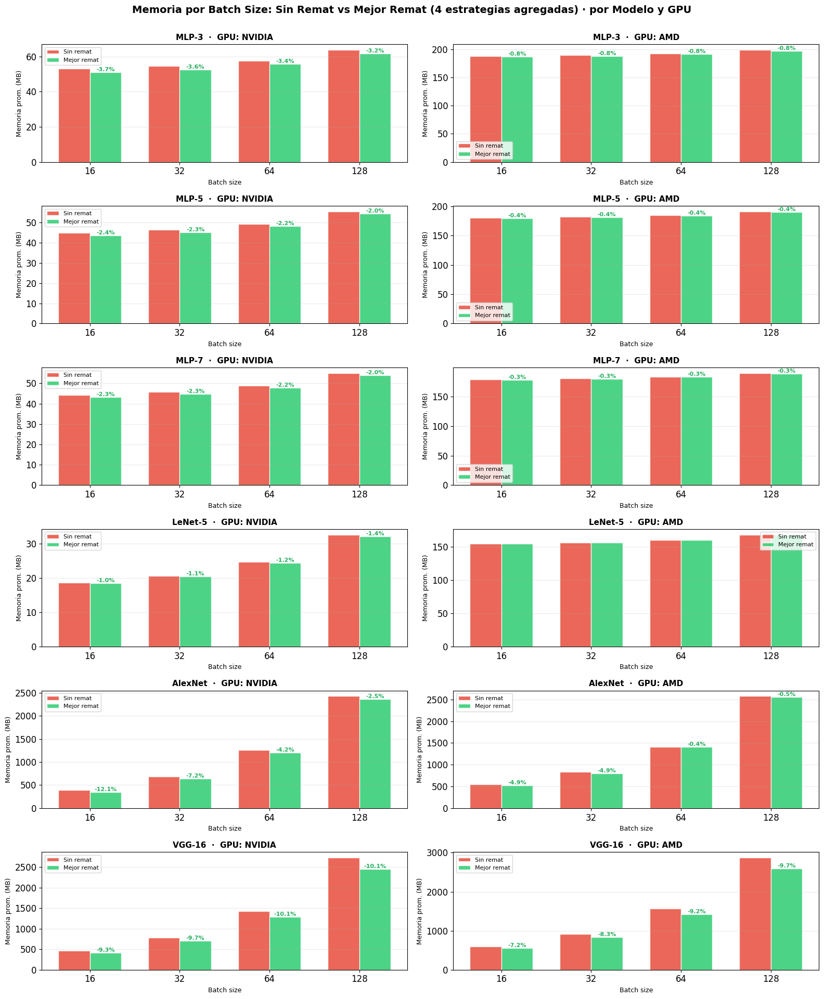

In [32]:
# Visualización: barras de memoria por batch, todos los modelos, separado por GPU
# 'Mejor remat' agrega las cuatro variantes (selectivo + uniform_seg2 + uniform_seg3)
# y se queda con la de menor memoria por (modelo, GPU, batch).
all_models = ['MLP-3', 'MLP-5', 'MLP-7', 'LeNet-5', 'AlexNet', 'VGG-16']
gpus = ['NVIDIA', 'AMD']

fig, axes = plt.subplots(len(all_models), len(gpus),
                         figsize=(16, 3.2 * len(all_models)), squeeze=False)

for i, modelo_name in enumerate(all_models):
    for j, gpu_name in enumerate(gpus):
        ax = axes[i, j]
        mod_df = df_analysis[(df_analysis['modelo'] == modelo_name) &
                              (df_analysis['gpu'] == gpu_name)]
        if len(mod_df) == 0:
            ax.set_visible(False)
            continue

        batch_sizes = sorted(mod_df['batch_size'].unique())
        x = np.arange(len(batch_sizes))
        width = 0.35

        # Promedio sin remat por batch
        mem_no, mem_remat = [], []
        for bs in batch_sizes:
            no_r = mod_df[(mod_df['batch_size'] == bs) &
                          (~mod_df['tiene_remat'])]['memory_avg_MB']
            remat_r = mod_df[(mod_df['batch_size'] == bs) &
                              (mod_df['tiene_remat'])]['memory_avg_MB']
            mem_no.append(no_r.mean() if len(no_r) > 0 else np.nan)
            mem_remat.append(remat_r.min() if len(remat_r) > 0 else
                             (no_r.mean() if len(no_r) > 0 else np.nan))

        bars1 = ax.bar(x - width/2, mem_no, width, label='Sin remat',
                       color='#e74c3c', alpha=0.85, edgecolor='white')
        bars2 = ax.bar(x + width/2, mem_remat, width, label='Mejor remat',
                       color='#2ecc71', alpha=0.85, edgecolor='white')

        for k, (no_r, best_r) in enumerate(zip(mem_no, mem_remat)):
            if np.isnan(no_r) or np.isnan(best_r) or no_r == 0:
                continue
            ahorro = (no_r - best_r) / no_r * 100
            if ahorro > 0.05:
                ax.annotate(f'-{ahorro:.1f}%',
                            xy=(k + width/2, best_r),
                            ha='center', va='bottom', fontsize=8, fontweight='bold',
                            color='#27ae60')

        ax.set_xlabel('Batch size', fontsize=9)
        ax.set_ylabel('Memoria prom. (MB)', fontsize=9)
        ax.set_title(f'{modelo_name}  ·  GPU: {gpu_name}',
                     fontsize=11, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(batch_sizes)
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.25, axis='y')

plt.suptitle('Memoria por Batch Size: Sin Remat vs Mejor Remat (4 estrategias agregadas) · por Modelo y GPU',
             fontsize=14, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()


**Observación sobre LeNet-5 + GPU AMD (barras sin rematerialización visible).**

En el subplot correspondiente a **LeNet-5 en la GPU AMD (Instinct MI210)**, la barra verde (*Mejor remat*) prácticamente coincide con la barra roja (*Sin remat*) y, visualmente, no se aprecia un ahorro separado. La explicación más probable es una combinación de los siguientes factores:

1. **Tamaño absoluto de las activaciones muy pequeño.** LeNet-5 es la arquitectura más liviana del conjunto (2 capas convolucionales con pocos filtros, mapas de activación de dimensión modesta). El presupuesto total de memoria de activaciones sobre el que la rematerialización puede actuar es muy reducido, así que el ahorro absoluto en MB cae dentro del ruido de medición.
2. **VRAM abundante en AMD MI210 (64 GB).** Con ese tamaño de VRAM, el asignador de memoria no está bajo presión para LeNet-5 con ningún batch del experimento. No hay "picos" que aliviar; el sistema no tiene incentivo para liberar agresivamente ni para mover tensores.
3. **Overhead de la propia mecánica de checkpoint.** `torch.utils.checkpoint` introduce un costo fijo por cada segmento recomputado (grafo auxiliar, save/restore de tensores). En redes muy pequeñas este costo fijo puede **compensar o incluso superar** el ahorro, dejando el `memory_avg_MB` prácticamente igual al baseline.
4. **Granularidad del profiling.** `memory_avg_MB` se computa como promedio sobre iteraciones. Pequeñas variaciones quedan absorbidas por el promedio, y si el ahorro instantáneo es del orden de decenas de MB frente a un consumo base de varios cientos, la barra verde no se distingue a simple vista de la roja en la misma escala.

En resumen, la ausencia de una barra verde claramente separada para LeNet-5 + AMD **no es un fallo de la rematerialización**, sino la consecuencia natural de aplicar una técnica de ahorro de memoria a un modelo que ya es barato en memoria, ejecutado sobre una GPU con memoria de sobra. Es uno de los casos donde los lineamientos de la sección 9.4 recomiendan *no* activar la rematerialización.


### 9.4 Lineamientos prácticos

Esta sección sintetiza los lineamientos prácticos que surgen de los escenarios anteriores. Los lineamientos por modelo CNN se basan en lo observado en las **GRÁFICAS INDIVIDUALES** (secciones 8.4 NVIDIA y 8.5 AMD): para cada arquitectura recorrimos todas las combinaciones de batch y activación y vimos cómo se comportan las tres estrategias. La fiabilidad por escenario se contrasta además contra la tabla de **Precisión del Random Forest en el conjunto de prueba** (sección anterior a este capítulo), que reporta la precisión (1 − MAPE) del RF por (modelo, GPU, batch).

El análisis evalúa el impacto del tamaño de lote, la topología de red y la elección entre estrategias (selectivo, `uniform_seg2`, `uniform_seg3`) sobre las dos variables objetivo del proyecto: `memory_avg_MB` y `total_time_ms`, expresadas como ahorro de memoria (%) y overhead de tiempo (%) en la validación estadística de la sección 8.7.

#### Lineamientos según la topología de red

| Topología | Comportamiento observado (8.4 + 8.5 + Precisión RF) | Lineamiento |
|---|---|---|
| **MLP (3, 5, 7 capas)** | La precisión del RF en memoria es alta para MLP-5 y MLP-7 (~85–99 %) pero la precisión en tiempo es muy variable y a veces nula (MLPs son tan rápidos que cualquier error absoluto se amplifica porcentualmente). Las gráficas resumen muestran ahorros despreciables. | **No aplicar rematerialización.** El costo de recomputación supera con creces el ahorro de memoria, que ya es despreciable de partida. |
| **LeNet-5** | En 8.4 (NVIDIA), las tres estrategias quedan a alturas idénticas en todos los batches (18–33 MB), con overheads del 3–13 % que no se traducen en ahorro. En 8.5 (AMD), las memorias también se superponen (~152–169 MB) y los overheads son aún más pequeños. La precisión del RF en memoria es ~92–98 % en AMD pero baja a ~44–53 % en NVIDIA por la magnitud minúscula de los valores. | **No activar rematerialización por defecto.** Solo bajo presión real de memoria, y en ese caso `uniform_seg2`. La técnica está sobredimensionada para esta arquitectura ligera. |
| **AlexNet** | En 8.4 (NVIDIA, batch ≥ 32), el selectivo del RF iguala o mejora ligeramente la memoria del baseline con overhead bajo (5–7 %); Uniform Segment cobra overheads grandes (~27–37 %). En 8.5 (AMD, batch ≥ 64), el selectivo *acelera* el entrenamiento (overhead negativo de hasta −36 %) sin coste de memoria. La precisión del RF se afianza ≥ 78 % desde batch=32. | **Usar checkpoint selectivo guiado por el RF** a partir de `batch_size ≥ 32` en ambas GPUs. En AMD con batches grandes incluso aporta una ganancia neta en tiempo. |
| **VGG-16** | Es la arquitectura donde la rematerialización rinde más: en 8.4 (NVIDIA, batch=128) Uniform Segment baja la memoria de 2.924 MB a 2.573 MB (−12 %); en 8.5 (AMD, batch=128) Uniform Segment baja de 3.060 MB a 2.710 MB con overhead negativo (~−10 %). El selectivo del RF queda muy cerca del baseline en memoria pero con overhead bajo (3 % NVIDIA, hasta −40 % AMD). La precisión del RF es ~93 % desde batch=64. | **Activar rematerialización siempre desde batch ≥ 32.** Usar `checkpoint_selectivo` guiado por el RF cuando se busca el mejor balance; `uniform_seg3` solo si se busca el máximo ahorro absoluto de memoria. |

#### Lineamientos según el número de segmentos uniformes

| Variante | Característica | Lineamiento |
|---|---|---|
| **`uniform_seg2`** | Particiona la red en 2 segmentos. Recomputa una mitad. En 8.4/8.5 produce overhead moderado (~5–15 % en CNNs pequeñas, llegando a 30–40 % en AlexNet/VGG sobre NVIDIA) y ahorro de memoria pequeño a moderado. | **Default razonable** cuando se quiere rematerialización automática sin elegir capas y no se dispone del RF. |
| **`uniform_seg3`** | Particiona en 3 segmentos. Más memoria recuperada en absoluto, pero factor de recomputación más alto (~1.45). | Útil para **VGG-16** y batches grandes donde el OOM es la restricción dura. Para AlexNet, el ahorro extra rara vez justifica el costo adicional. |
| **Checkpoint selectivo (guiado por el RF)** | Permite elegir qué capa(s) o bloque(s) marcar; el RF identifica la mejor combinación entre todas las posibles. En 8.4/8.5 muestra los overheads más bajos (a menudo < 5 %, y negativos en AMD con batches grandes). | **Mejor relación ahorro / overhead** entre todas las estrategias evaluadas. Es el flujo recomendado por defecto en producción siempre que esté disponible el modelo entrenado. |

#### Lineamientos según el tamaño de lote

| Batch | Observación (8.4 + 8.5 + Precisión RF) | Lineamiento |
|---|---|---|
| **16** | Consumo total bajo en todas las arquitecturas; el margen absoluto para ahorrar es pequeño. La precisión del RF en memoria es baja (LeNet ~47 %, VGG ~0–14 %) porque las magnitudes son chicas y los errores relativos se inflan. | Rematerialización útil **solo en VGG-16** si la GPU está casi llena; en el resto no compensa el overhead. |
| **32–64** | Zona donde el selectivo del RF rinde mejor en AlexNet y VGG-16. Los overheads del selectivo se mantienen contenidos (3–7 % NVIDIA, negativos en AMD). La precisión del RF sube a 70–95 % en CNNs intermedias y profundas. | Activar **checkpoint selectivo** en AlexNet y VGG-16; descartarla en LeNet-5 y MLPs. |
| **128** | Consumo alto; la rematerialización libera más MB en términos absolutos en VGG-16 (hasta 350 MB de ahorro real con uniform). El RF subestima ligeramente el selectivo (~ −25 a −40 %) pero la decisión práctica no cambia. | En VGG-16 usar selectivo guiado por el RF; evitar `uniform_seg3` salvo restricción dura de memoria. |

#### Lineamientos según la GPU

| GPU | Observación (8.4 + 8.5 + Precisión RF) | Lineamiento |
|---|---|---|
| **NVIDIA GTX TITAN X (12 GB)** | La presión de memoria es real para VGG-16/AlexNet con batches grandes. El selectivo del RF ahorra ~3.7 % de memoria promedio con un factor de recomputación de solo ~1.05. La precisión del RF en memoria es ~78–93 % desde batch=32 en CNNs intermedias/profundas. | **Aplicar selectivo del RF** siempre que sea posible. Si no, `uniform_seg2`. Para VGG-16 con `batch=128` cerca del OOM, considerar `uniform_seg3`. |
| **AMD Instinct MI210 (64 GB)** | El asignador no está bajo presión. Para LeNet-5 las tres estrategias quedan superpuestas. Para AlexNet/VGG-16 con batch ≥ 64 aparece el fenómeno **contraintuitivo** de overhead *negativo*: el selectivo y uniform se ejecutan más rápido que el baseline, presumiblemente por reuso de cache/kernel en ROCm. La precisión del RF supera 90 % en VGG-16 batch ≥ 64. | **No activar rematerialización por defecto en LeNet-5/MLPs.** En AlexNet y VGG-16 desde batch=64, **activarla** porque libera memoria *y* tiempo simultáneamente. |

#### Conclusión operacional

El flujo recomendado para una configuración nueva es:

1. **Si la arquitectura es MLP:** entrenar sin rematerialización.
2. **Si la arquitectura es LeNet-5:** entrenar sin rematerialización salvo restricción de memoria; en ese caso, `uniform_seg2`.
3. **Si la arquitectura es AlexNet o VGG-16:** consultar la tabla de precisión del RF para el (modelo, GPU, batch) en cuestión y aplicar `checkpoint_selectivo` siempre que la precisión en memoria del RF supere ~70 %; si no, usar `uniform_seg2`/`uniform_seg3` como fallback.

Este flujo combina el análisis visual de la gráfica resumen (sección 8.3), las gráficas individuales (secciones 8.4 NVIDIA y 8.5 AMD) — donde se ve que el RF predice con fidelidad la realidad medida en GPU — y el rigor estadístico de las pruebas de la sección 8.7 que validan cuantitativamente la superioridad del selectivo en eficiencia.
